In [9]:
# Set up autoreload
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [10]:
# Sys Imports
import sys
from pathlib import Path

github_root = Path.cwd().resolve().parents[3]
sys.path.append(str(github_root))


In [11]:
# Self-def imports
from src.dl.data import get_data
from src.dl.loaders import *
from src.dl.train import train_model

In [12]:
# Package imports
import torch
import torch.nn as nn
import numpy as np

In [13]:
# Get device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


In [14]:
# Data hyperparams
save_path = rf"{github_root}\data\isprs_26_new.csv"
batch_size = 5
epoch = 80
n_train = 100
n_val = 24
n_test = 20
n_tb_epoch = n_train // batch_size

# Model hyperparam and weights
model_cfg = {'hidden_dim': [128, 128, 128, 128]}
statedict_path = rf"{github_root}\runs\dl\simpler_data\mlp\mlp_128_4layer\model_weights.pth"

# Training hyperparams
lr = 1e-4
weight_decay = 0.2

# Global hyperparams
n_randoms = 50 # Number of random seeds to use to split the data, and to train on. The metrics will be
               # recrded for each random seed, to create distributions of metrics.
master_seed = 1878439041 # The master seed to use to generate the random seeds for data splitting and training. This is used to ensure reproducibility.
seed_generator = np.random.default_rng(master_seed)
mccv_seeds = seed_generator.integers(low=0, high=2**32 - 1, size=n_randoms).tolist()

In [15]:
for i in mccv_seeds:
    save_dir = github_root / 'runs' / 'dl' / 'atmo_data' / 'mlp_128_4layer' / 'results' /str(i)
    save_dir.mkdir(parents=True, exist_ok=True)

Initial fine tuning complete, with 100 batches
Epoch 1/80, Step 1/20, Train Loss: 0.221805
Epoch 1/80, Step 2/20, Train Loss: 0.145894
Epoch 1/80, Step 3/20, Train Loss: 0.248596
Epoch 1/80, Step 4/20, Train Loss: 0.286185
Epoch 1/80, Step 5/20, Train Loss: 0.230364
Epoch 1/80, Step 6/20, Train Loss: 0.255422
Epoch 1/80, Step 7/20, Train Loss: 0.238143
Epoch 1/80, Step 8/20, Train Loss: 0.216581
Epoch 1/80, Step 9/20, Train Loss: 0.214134
Epoch 1/80, Step 10/20, Train Loss: 0.254889
Epoch 1/80, Step 11/20, Train Loss: 0.296821
Epoch 1/80, Step 12/20, Train Loss: 0.251999
Epoch 1/80, Step 13/20, Train Loss: 0.182852
Epoch 1/80, Step 14/20, Train Loss: 0.273348
Epoch 1/80, Step 15/20, Train Loss: 0.199251
Epoch 1/80, Step 16/20, Train Loss: 0.202191
Epoch 1/80, Step 17/20, Train Loss: 0.341297
Epoch 1/80, Step 18/20, Train Loss: 0.289346
Epoch 1/80, Step 19/20, Train Loss: 0.195396
Epoch 1/80, Step 20/20, Train Loss: 0.261689
Epoch 1/80 complete. Train Loss: 0.240310, Val Loss: 0.191789


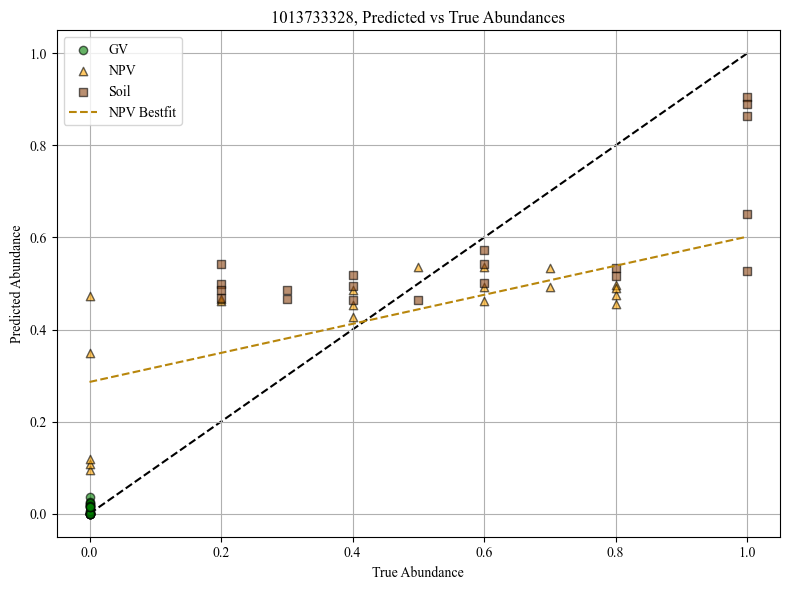

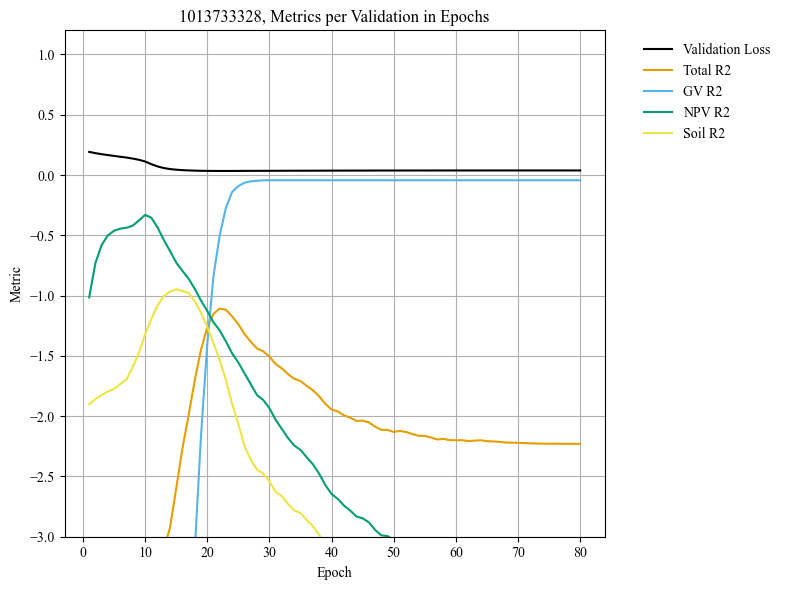

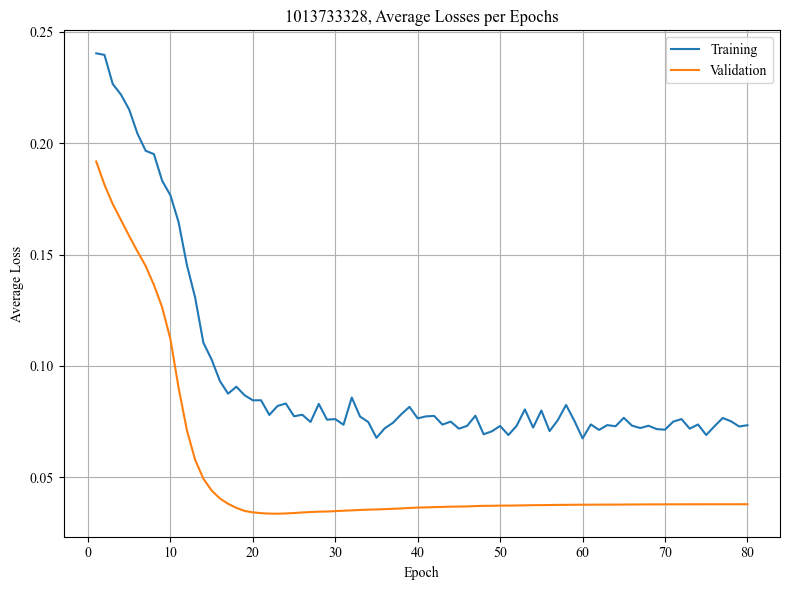

Testing complete
Initial fine tuning complete, with 100 batches
Epoch 1/80, Step 1/20, Train Loss: 0.298306
Epoch 1/80, Step 2/20, Train Loss: 0.257354
Epoch 1/80, Step 3/20, Train Loss: 0.222246
Epoch 1/80, Step 4/20, Train Loss: 0.268486
Epoch 1/80, Step 5/20, Train Loss: 0.180132
Epoch 1/80, Step 6/20, Train Loss: 0.216275
Epoch 1/80, Step 7/20, Train Loss: 0.218995
Epoch 1/80, Step 8/20, Train Loss: 0.185009
Epoch 1/80, Step 9/20, Train Loss: 0.290042
Epoch 1/80, Step 10/20, Train Loss: 0.260287
Epoch 1/80, Step 11/20, Train Loss: 0.181831
Epoch 1/80, Step 12/20, Train Loss: 0.245521
Epoch 1/80, Step 13/20, Train Loss: 0.208597
Epoch 1/80, Step 14/20, Train Loss: 0.353283
Epoch 1/80, Step 15/20, Train Loss: 0.183868
Epoch 1/80, Step 16/20, Train Loss: 0.152654
Epoch 1/80, Step 17/20, Train Loss: 0.287029
Epoch 1/80, Step 18/20, Train Loss: 0.305785
Epoch 1/80, Step 19/20, Train Loss: 0.155135
Epoch 1/80, Step 20/20, Train Loss: 0.269701
Epoch 1/80 complete. Train Loss: 0.237027, Va

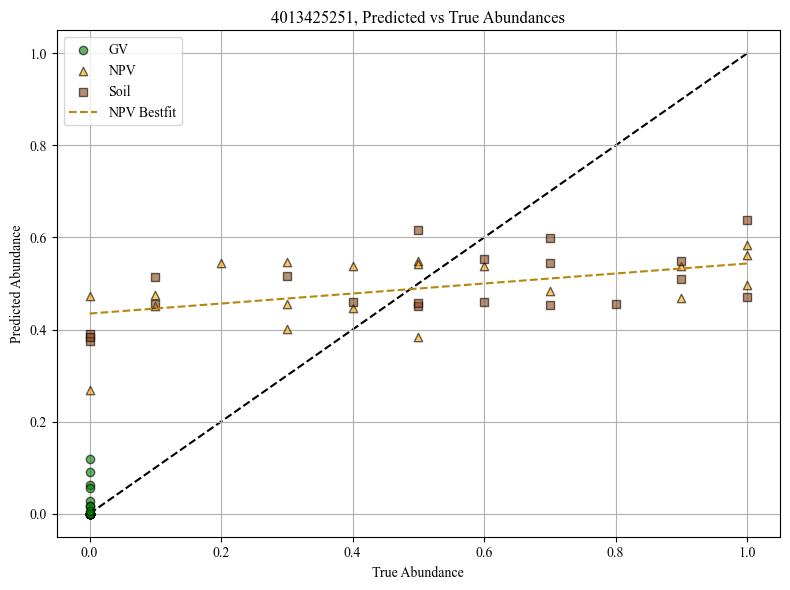

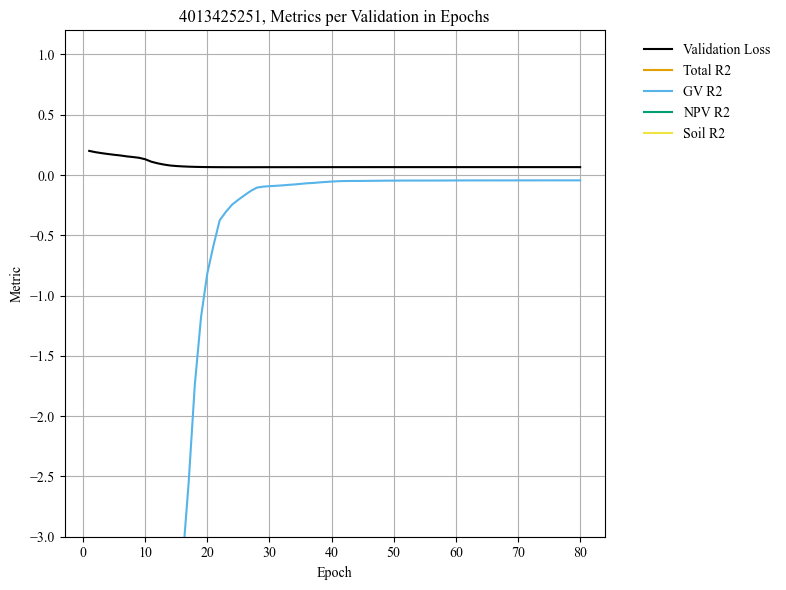

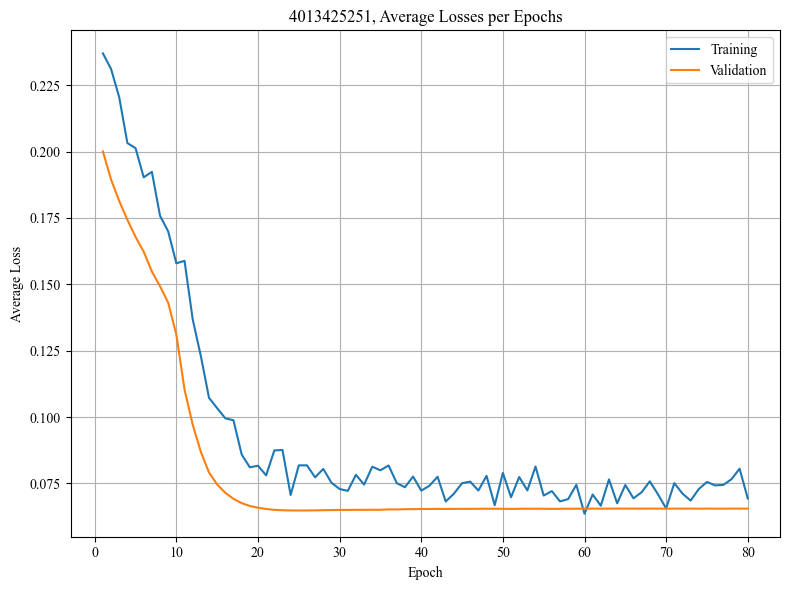

Testing complete
Initial fine tuning complete, with 100 batches
Epoch 1/80, Step 1/20, Train Loss: 0.263726
Epoch 1/80, Step 2/20, Train Loss: 0.150973
Epoch 1/80, Step 3/20, Train Loss: 0.237708
Epoch 1/80, Step 4/20, Train Loss: 0.345509
Epoch 1/80, Step 5/20, Train Loss: 0.102005
Epoch 1/80, Step 6/20, Train Loss: 0.161725
Epoch 1/80, Step 7/20, Train Loss: 0.243757
Epoch 1/80, Step 8/20, Train Loss: 0.312113
Epoch 1/80, Step 9/20, Train Loss: 0.280484
Epoch 1/80, Step 10/20, Train Loss: 0.259838
Epoch 1/80, Step 11/20, Train Loss: 0.215818
Epoch 1/80, Step 12/20, Train Loss: 0.222179
Epoch 1/80, Step 13/20, Train Loss: 0.275847
Epoch 1/80, Step 14/20, Train Loss: 0.218484
Epoch 1/80, Step 15/20, Train Loss: 0.228459
Epoch 1/80, Step 16/20, Train Loss: 0.143611
Epoch 1/80, Step 17/20, Train Loss: 0.264506
Epoch 1/80, Step 18/20, Train Loss: 0.305403
Epoch 1/80, Step 19/20, Train Loss: 0.238045
Epoch 1/80, Step 20/20, Train Loss: 0.258184
Epoch 1/80 complete. Train Loss: 0.236419, Va

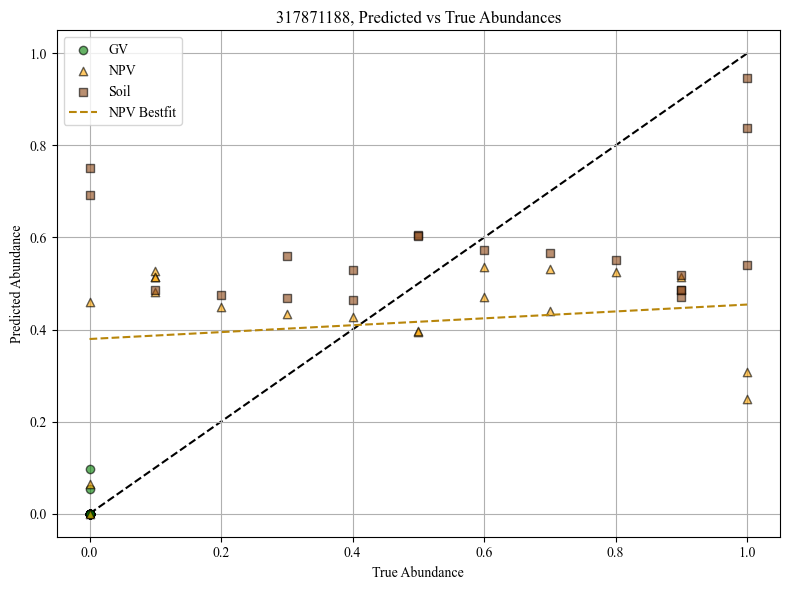

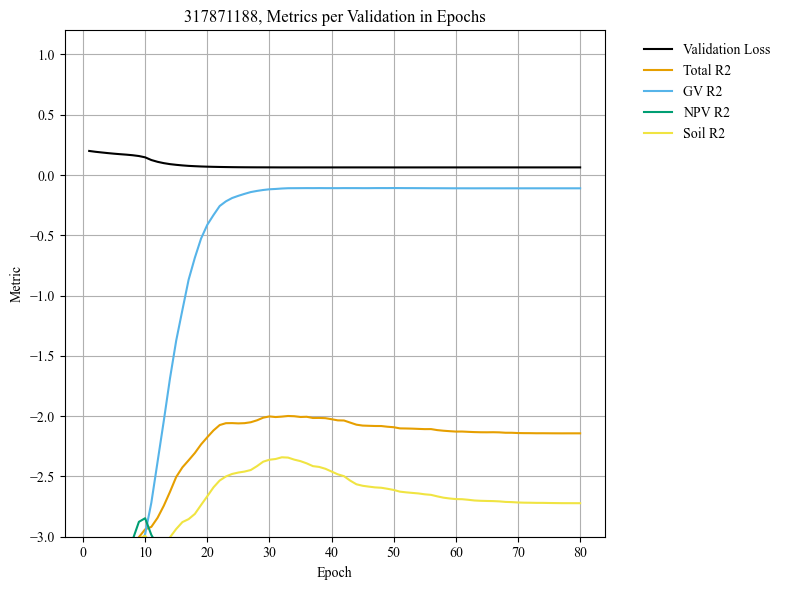

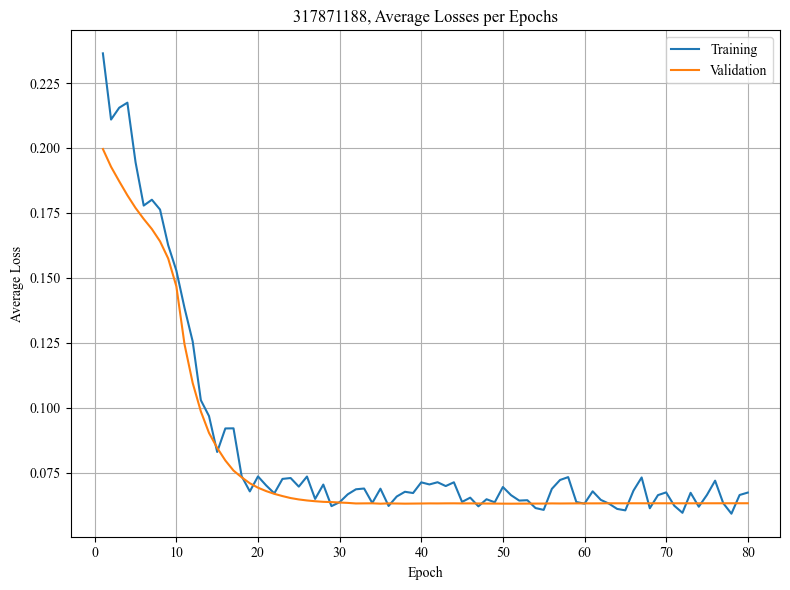

Testing complete
Initial fine tuning complete, with 100 batches
Epoch 1/80, Step 1/20, Train Loss: 0.196478
Epoch 1/80, Step 2/20, Train Loss: 0.195626
Epoch 1/80, Step 3/20, Train Loss: 0.385333
Epoch 1/80, Step 4/20, Train Loss: 0.259112
Epoch 1/80, Step 5/20, Train Loss: 0.220519
Epoch 1/80, Step 6/20, Train Loss: 0.218702
Epoch 1/80, Step 7/20, Train Loss: 0.295979
Epoch 1/80, Step 8/20, Train Loss: 0.228283
Epoch 1/80, Step 9/20, Train Loss: 0.269595
Epoch 1/80, Step 10/20, Train Loss: 0.316506
Epoch 1/80, Step 11/20, Train Loss: 0.340241
Epoch 1/80, Step 12/20, Train Loss: 0.230386
Epoch 1/80, Step 13/20, Train Loss: 0.235910
Epoch 1/80, Step 14/20, Train Loss: 0.262867
Epoch 1/80, Step 15/20, Train Loss: 0.241708
Epoch 1/80, Step 16/20, Train Loss: 0.149779
Epoch 1/80, Step 17/20, Train Loss: 0.172250
Epoch 1/80, Step 18/20, Train Loss: 0.160565
Epoch 1/80, Step 19/20, Train Loss: 0.285777
Epoch 1/80, Step 20/20, Train Loss: 0.137065
Epoch 1/80 complete. Train Loss: 0.240134, Va

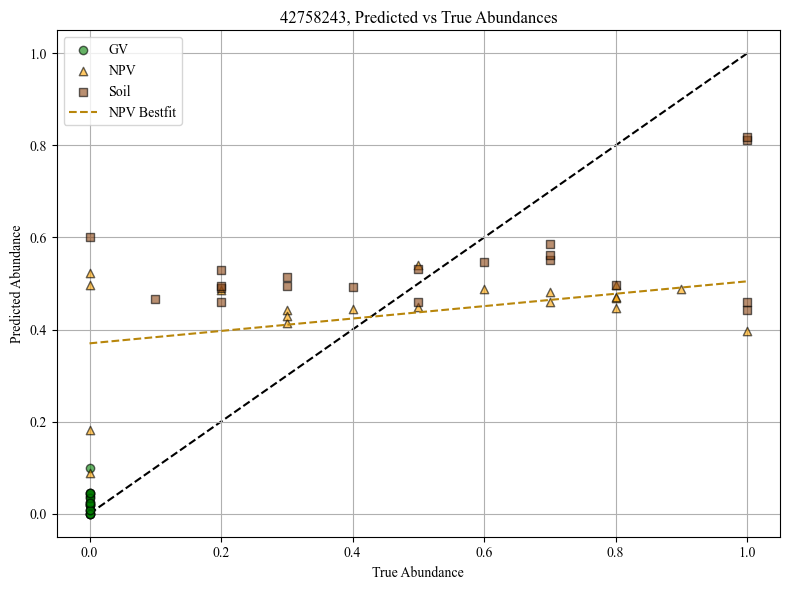

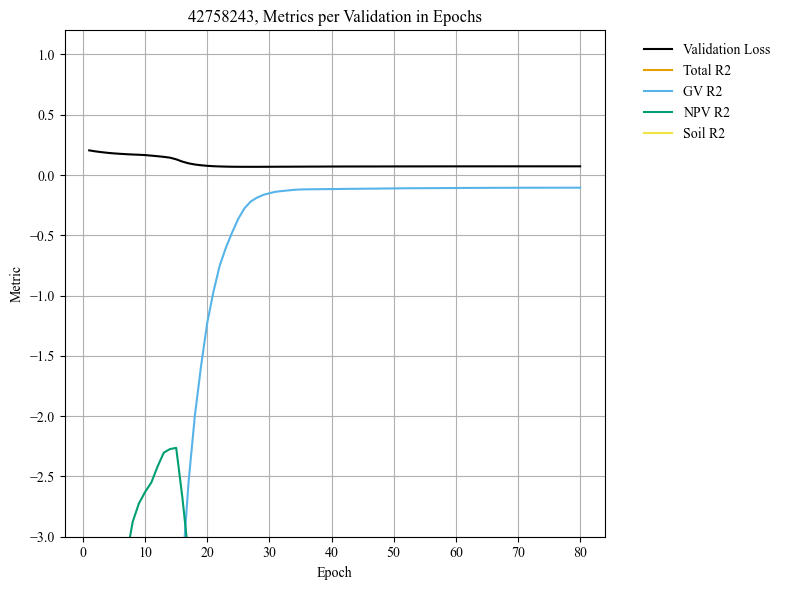

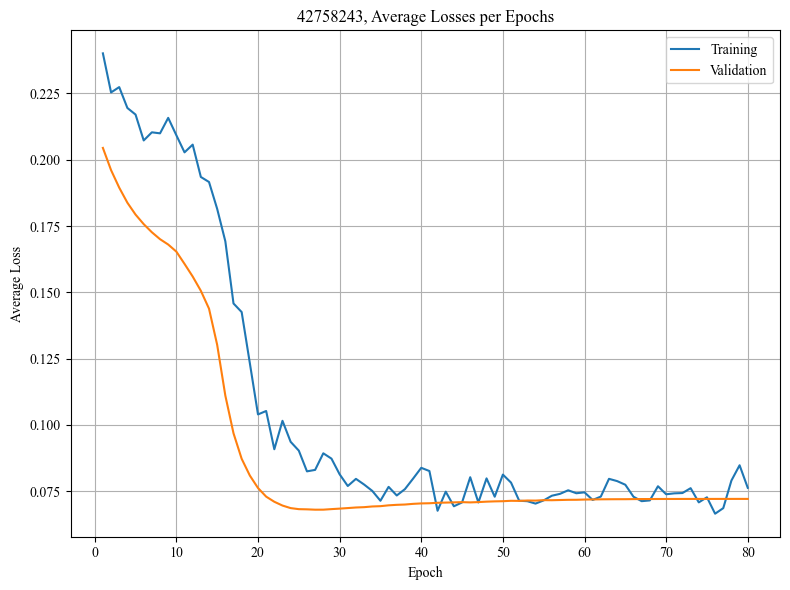

Testing complete
Initial fine tuning complete, with 100 batches
Epoch 1/80, Step 1/20, Train Loss: 0.246977
Epoch 1/80, Step 2/20, Train Loss: 0.241432
Epoch 1/80, Step 3/20, Train Loss: 0.257588
Epoch 1/80, Step 4/20, Train Loss: 0.194545
Epoch 1/80, Step 5/20, Train Loss: 0.279071
Epoch 1/80, Step 6/20, Train Loss: 0.213837
Epoch 1/80, Step 7/20, Train Loss: 0.172456
Epoch 1/80, Step 8/20, Train Loss: 0.232324
Epoch 1/80, Step 9/20, Train Loss: 0.204446
Epoch 1/80, Step 10/20, Train Loss: 0.250216
Epoch 1/80, Step 11/20, Train Loss: 0.191552
Epoch 1/80, Step 12/20, Train Loss: 0.256607
Epoch 1/80, Step 13/20, Train Loss: 0.205509
Epoch 1/80, Step 14/20, Train Loss: 0.211084
Epoch 1/80, Step 15/20, Train Loss: 0.267256
Epoch 1/80, Step 16/20, Train Loss: 0.229843
Epoch 1/80, Step 17/20, Train Loss: 0.183534
Epoch 1/80, Step 18/20, Train Loss: 0.353755
Epoch 1/80, Step 19/20, Train Loss: 0.196868
Epoch 1/80, Step 20/20, Train Loss: 0.202323
Epoch 1/80 complete. Train Loss: 0.229561, Va

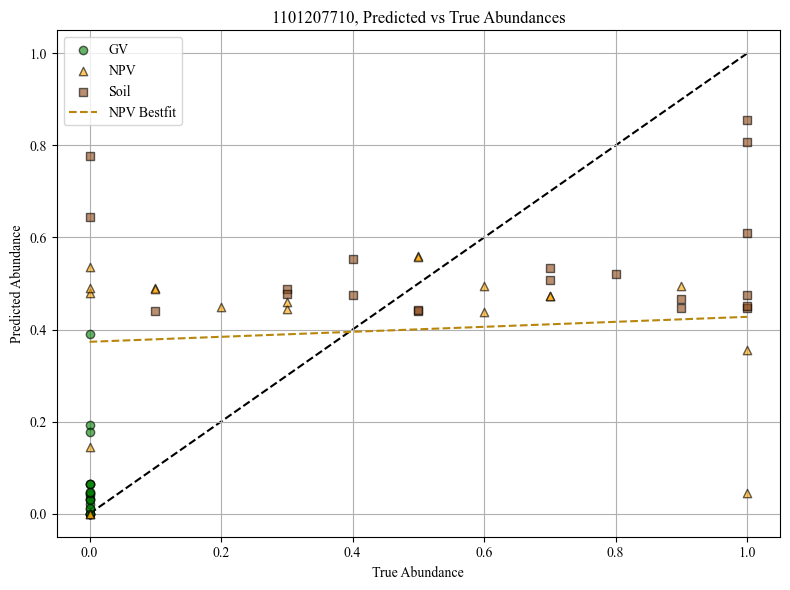

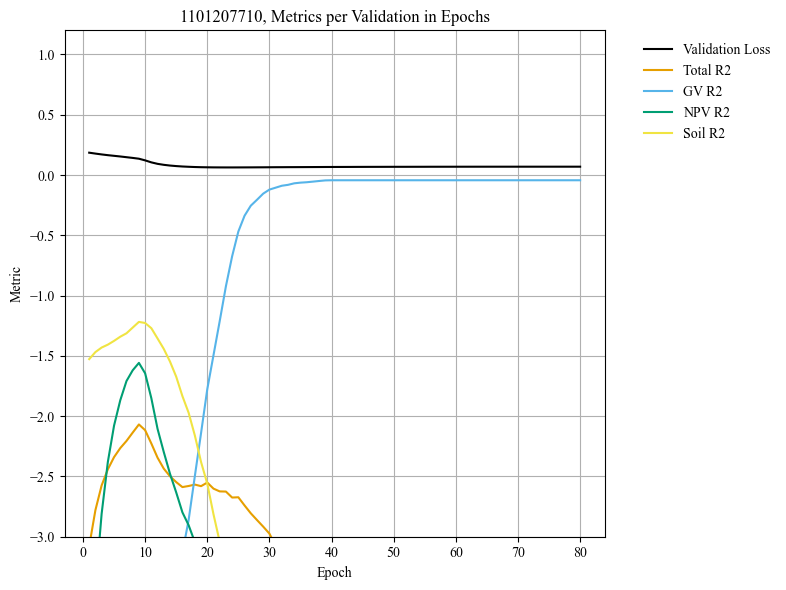

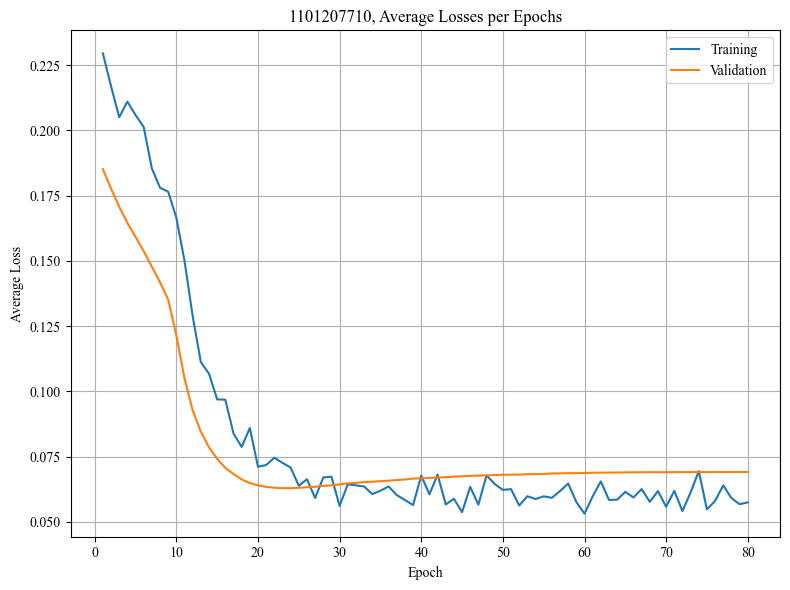

Testing complete
Initial fine tuning complete, with 100 batches
Epoch 1/80, Step 1/20, Train Loss: 0.183969
Epoch 1/80, Step 2/20, Train Loss: 0.314034
Epoch 1/80, Step 3/20, Train Loss: 0.280342
Epoch 1/80, Step 4/20, Train Loss: 0.242563
Epoch 1/80, Step 5/20, Train Loss: 0.133447
Epoch 1/80, Step 6/20, Train Loss: 0.228427
Epoch 1/80, Step 7/20, Train Loss: 0.270569
Epoch 1/80, Step 8/20, Train Loss: 0.170355
Epoch 1/80, Step 9/20, Train Loss: 0.271803
Epoch 1/80, Step 10/20, Train Loss: 0.239686
Epoch 1/80, Step 11/20, Train Loss: 0.288482
Epoch 1/80, Step 12/20, Train Loss: 0.217730
Epoch 1/80, Step 13/20, Train Loss: 0.228092
Epoch 1/80, Step 14/20, Train Loss: 0.284998
Epoch 1/80, Step 15/20, Train Loss: 0.297592
Epoch 1/80, Step 16/20, Train Loss: 0.172743
Epoch 1/80, Step 17/20, Train Loss: 0.240029
Epoch 1/80, Step 18/20, Train Loss: 0.339496
Epoch 1/80, Step 19/20, Train Loss: 0.182199
Epoch 1/80, Step 20/20, Train Loss: 0.312758
Epoch 1/80 complete. Train Loss: 0.244966, Va

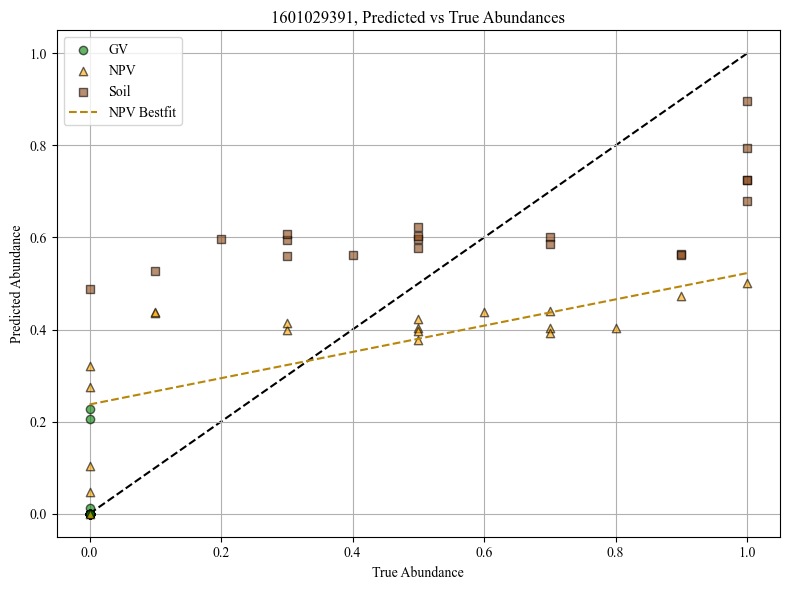

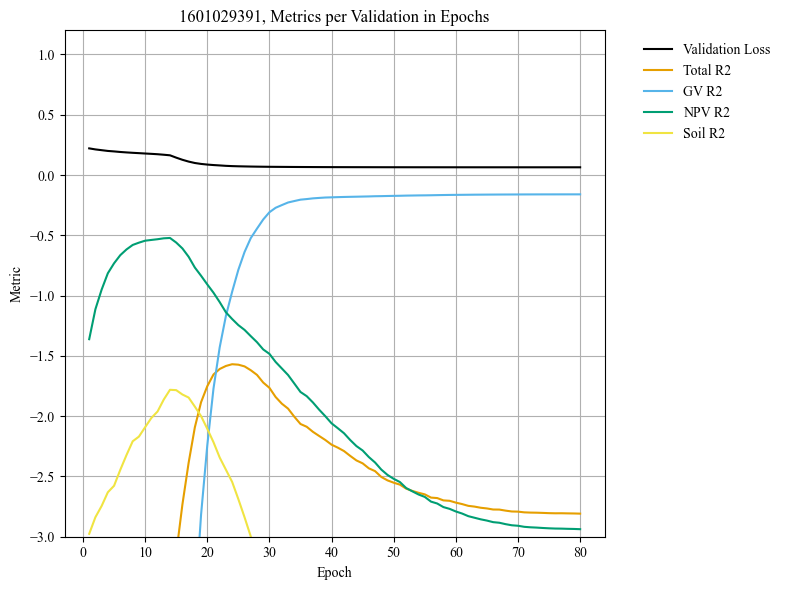

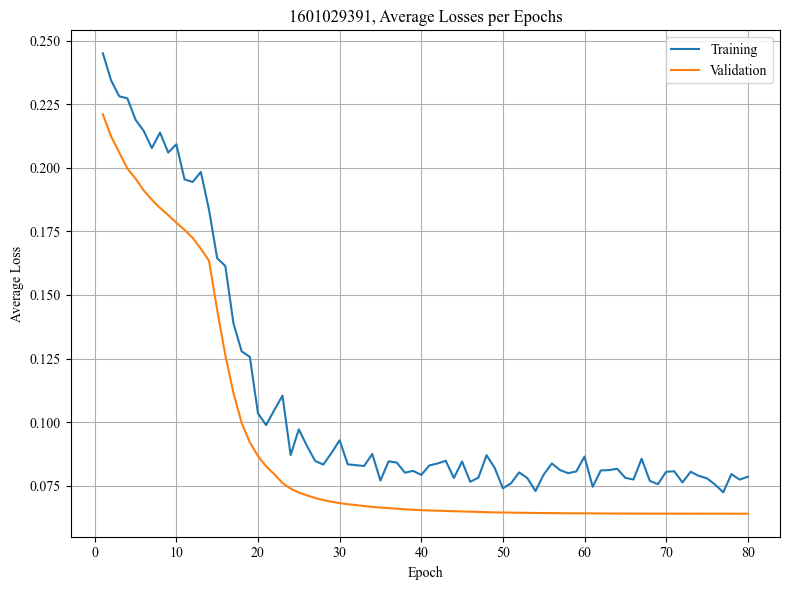

Testing complete
Initial fine tuning complete, with 100 batches
Epoch 1/80, Step 1/20, Train Loss: 0.276226
Epoch 1/80, Step 2/20, Train Loss: 0.239636
Epoch 1/80, Step 3/20, Train Loss: 0.310743
Epoch 1/80, Step 4/20, Train Loss: 0.186466
Epoch 1/80, Step 5/20, Train Loss: 0.208693
Epoch 1/80, Step 6/20, Train Loss: 0.221130
Epoch 1/80, Step 7/20, Train Loss: 0.285700
Epoch 1/80, Step 8/20, Train Loss: 0.168675
Epoch 1/80, Step 9/20, Train Loss: 0.261239
Epoch 1/80, Step 10/20, Train Loss: 0.248323
Epoch 1/80, Step 11/20, Train Loss: 0.284741
Epoch 1/80, Step 12/20, Train Loss: 0.222188
Epoch 1/80, Step 13/20, Train Loss: 0.196894
Epoch 1/80, Step 14/20, Train Loss: 0.245900
Epoch 1/80, Step 15/20, Train Loss: 0.217275
Epoch 1/80, Step 16/20, Train Loss: 0.121364
Epoch 1/80, Step 17/20, Train Loss: 0.307368
Epoch 1/80, Step 18/20, Train Loss: 0.225862
Epoch 1/80, Step 19/20, Train Loss: 0.131136
Epoch 1/80, Step 20/20, Train Loss: 0.128766
Epoch 1/80 complete. Train Loss: 0.224416, Va

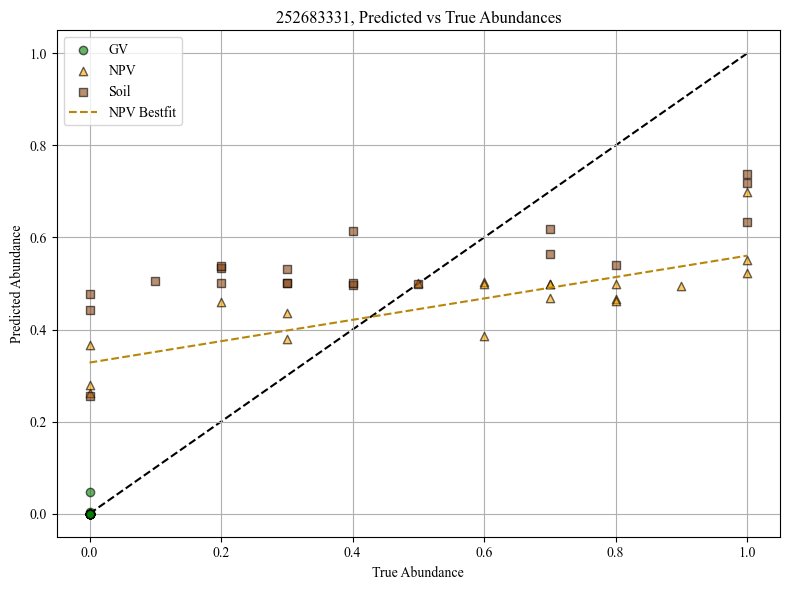

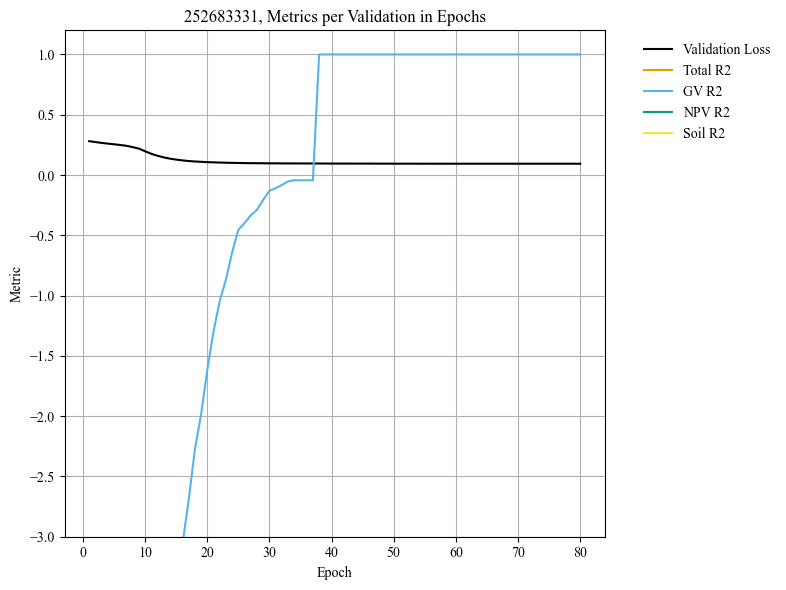

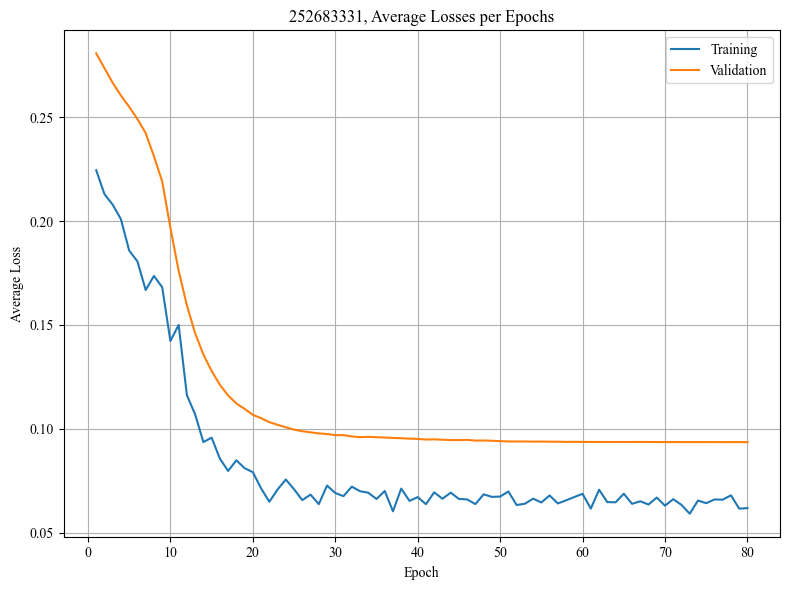

Testing complete
Initial fine tuning complete, with 100 batches
Epoch 1/80, Step 1/20, Train Loss: 0.239543
Epoch 1/80, Step 2/20, Train Loss: 0.232094
Epoch 1/80, Step 3/20, Train Loss: 0.210377
Epoch 1/80, Step 4/20, Train Loss: 0.276890
Epoch 1/80, Step 5/20, Train Loss: 0.192977
Epoch 1/80, Step 6/20, Train Loss: 0.259654
Epoch 1/80, Step 7/20, Train Loss: 0.255786
Epoch 1/80, Step 8/20, Train Loss: 0.217434
Epoch 1/80, Step 9/20, Train Loss: 0.199453
Epoch 1/80, Step 10/20, Train Loss: 0.173473
Epoch 1/80, Step 11/20, Train Loss: 0.217013
Epoch 1/80, Step 12/20, Train Loss: 0.267545
Epoch 1/80, Step 13/20, Train Loss: 0.166257
Epoch 1/80, Step 14/20, Train Loss: 0.220779
Epoch 1/80, Step 15/20, Train Loss: 0.367970
Epoch 1/80, Step 16/20, Train Loss: 0.228954
Epoch 1/80, Step 17/20, Train Loss: 0.235604
Epoch 1/80, Step 18/20, Train Loss: 0.252456
Epoch 1/80, Step 19/20, Train Loss: 0.202277
Epoch 1/80, Step 20/20, Train Loss: 0.158314
Epoch 1/80 complete. Train Loss: 0.228743, Va

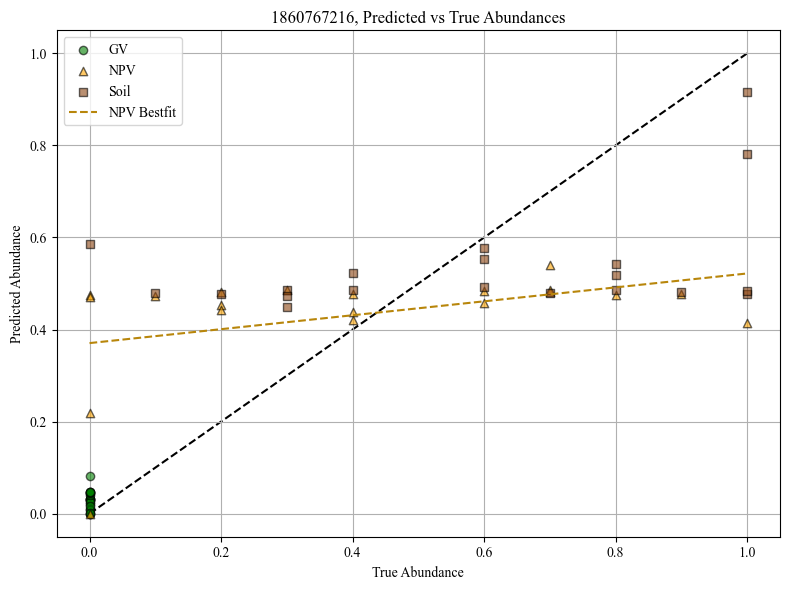

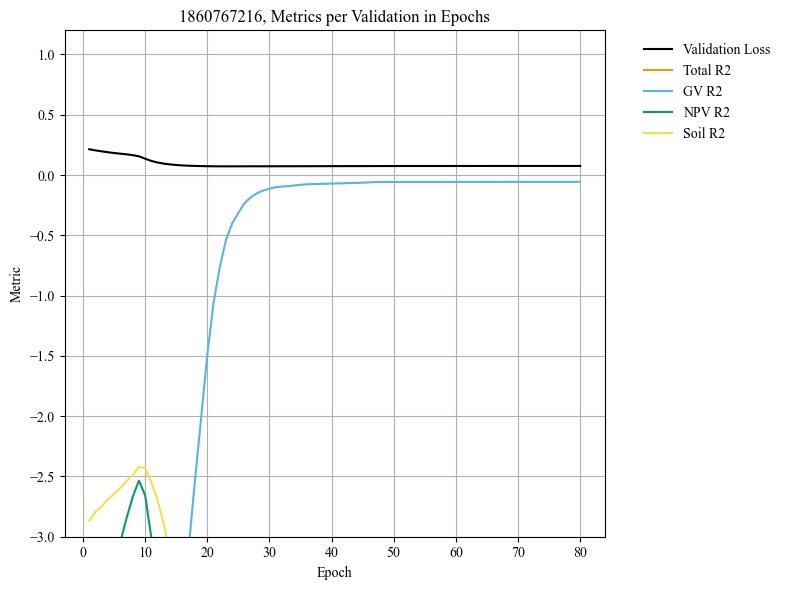

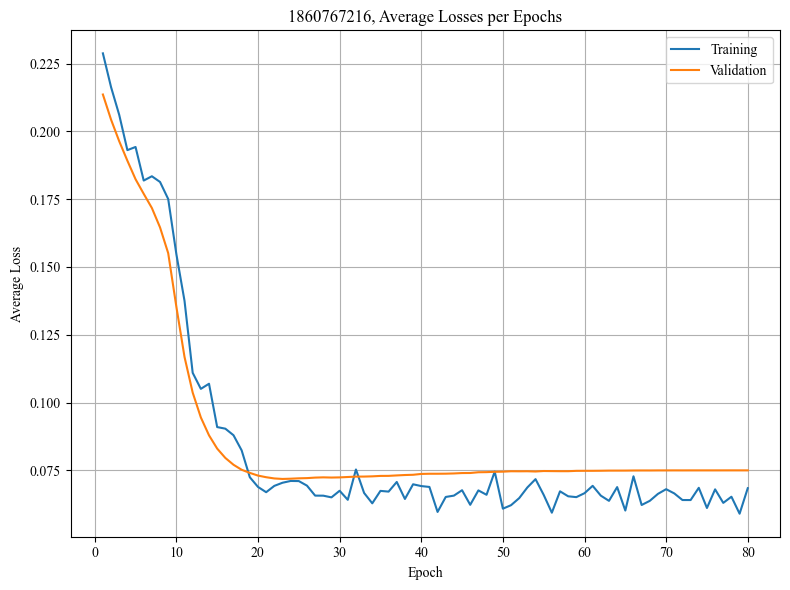

Testing complete
Initial fine tuning complete, with 100 batches
Epoch 1/80, Step 1/20, Train Loss: 0.172225
Epoch 1/80, Step 2/20, Train Loss: 0.296725
Epoch 1/80, Step 3/20, Train Loss: 0.234989
Epoch 1/80, Step 4/20, Train Loss: 0.299737
Epoch 1/80, Step 5/20, Train Loss: 0.236855
Epoch 1/80, Step 6/20, Train Loss: 0.272322
Epoch 1/80, Step 7/20, Train Loss: 0.186882
Epoch 1/80, Step 8/20, Train Loss: 0.141334
Epoch 1/80, Step 9/20, Train Loss: 0.259570
Epoch 1/80, Step 10/20, Train Loss: 0.232636
Epoch 1/80, Step 11/20, Train Loss: 0.190150
Epoch 1/80, Step 12/20, Train Loss: 0.150368
Epoch 1/80, Step 13/20, Train Loss: 0.180711
Epoch 1/80, Step 14/20, Train Loss: 0.226952
Epoch 1/80, Step 15/20, Train Loss: 0.262402
Epoch 1/80, Step 16/20, Train Loss: 0.310621
Epoch 1/80, Step 17/20, Train Loss: 0.145755
Epoch 1/80, Step 18/20, Train Loss: 0.239033
Epoch 1/80, Step 19/20, Train Loss: 0.239279
Epoch 1/80, Step 20/20, Train Loss: 0.177476
Epoch 1/80 complete. Train Loss: 0.222801, Va

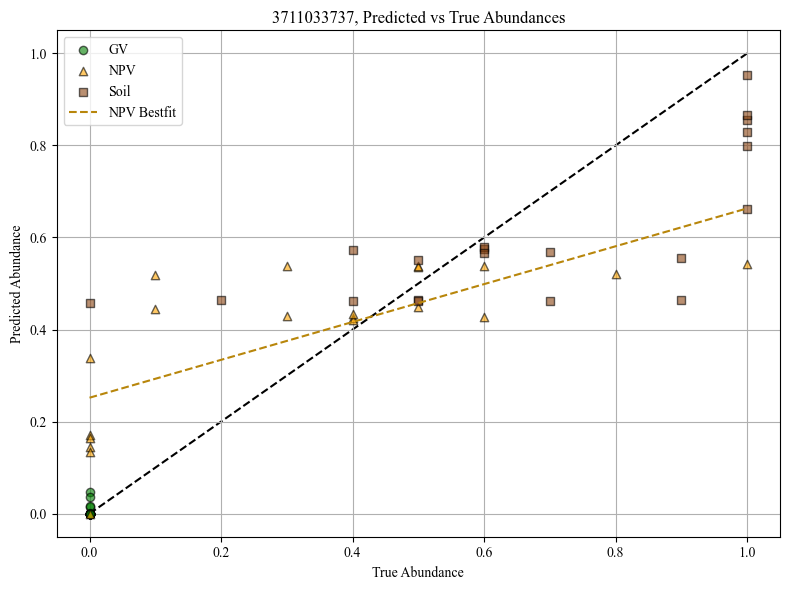

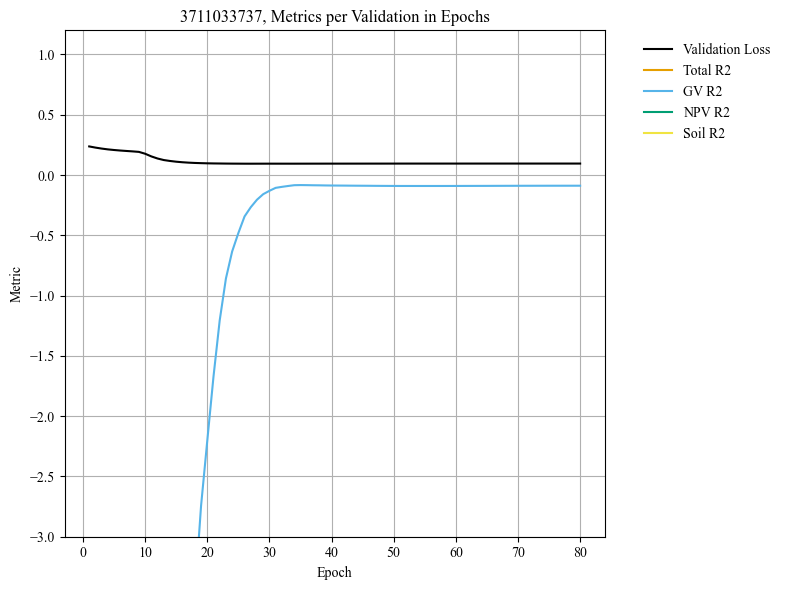

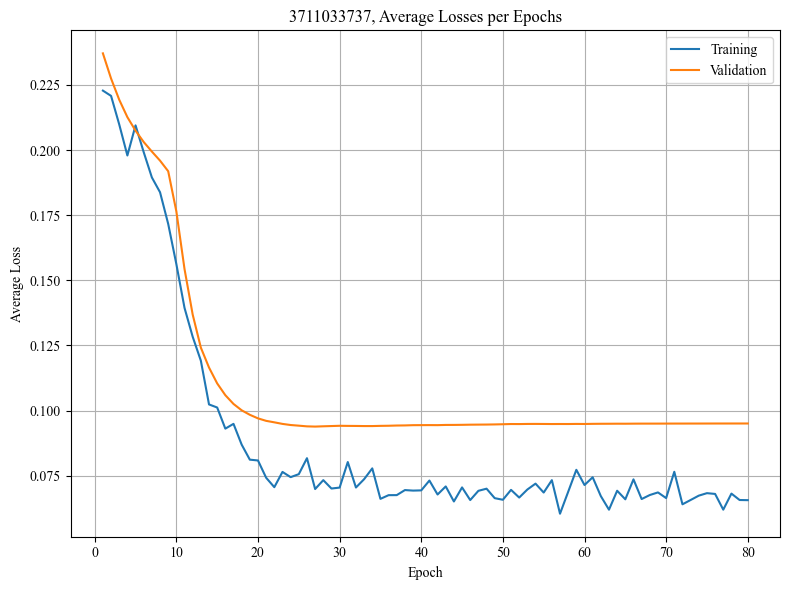

Testing complete
Initial fine tuning complete, with 100 batches
Epoch 1/80, Step 1/20, Train Loss: 0.344475
Epoch 1/80, Step 2/20, Train Loss: 0.218783
Epoch 1/80, Step 3/20, Train Loss: 0.236168
Epoch 1/80, Step 4/20, Train Loss: 0.204752
Epoch 1/80, Step 5/20, Train Loss: 0.309995
Epoch 1/80, Step 6/20, Train Loss: 0.233293
Epoch 1/80, Step 7/20, Train Loss: 0.236280
Epoch 1/80, Step 8/20, Train Loss: 0.240449
Epoch 1/80, Step 9/20, Train Loss: 0.214601
Epoch 1/80, Step 10/20, Train Loss: 0.231415
Epoch 1/80, Step 11/20, Train Loss: 0.187506
Epoch 1/80, Step 12/20, Train Loss: 0.147225
Epoch 1/80, Step 13/20, Train Loss: 0.151013
Epoch 1/80, Step 14/20, Train Loss: 0.209163
Epoch 1/80, Step 15/20, Train Loss: 0.207142
Epoch 1/80, Step 16/20, Train Loss: 0.281839
Epoch 1/80, Step 17/20, Train Loss: 0.247696
Epoch 1/80, Step 18/20, Train Loss: 0.199494
Epoch 1/80, Step 19/20, Train Loss: 0.127963
Epoch 1/80, Step 20/20, Train Loss: 0.293520
Epoch 1/80 complete. Train Loss: 0.226139, Va

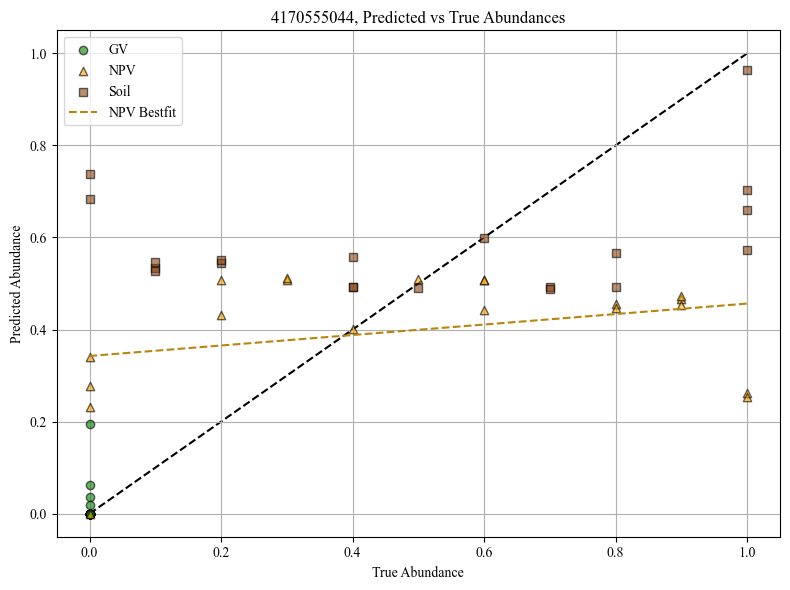

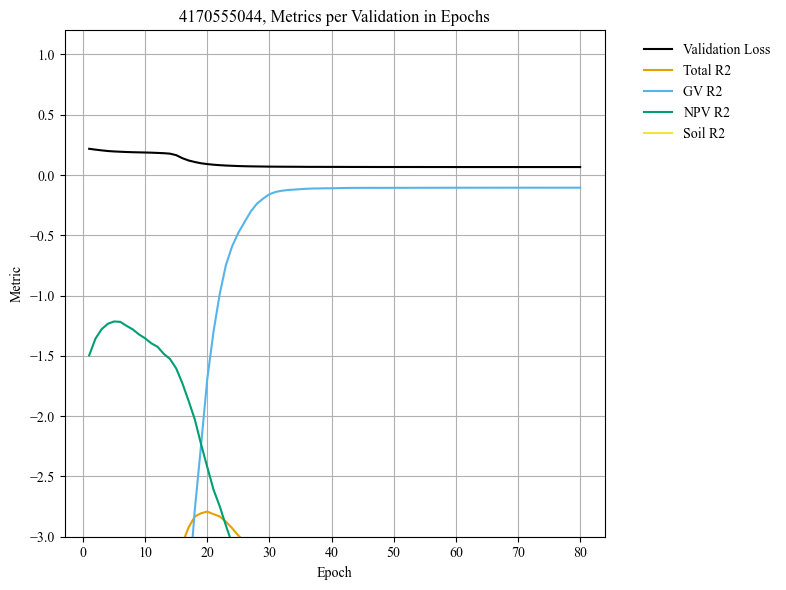

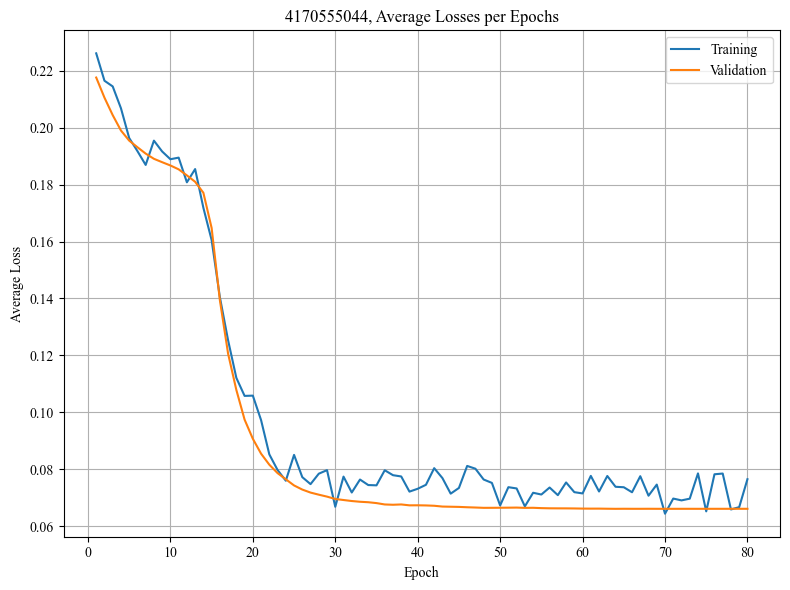

Testing complete
Initial fine tuning complete, with 100 batches
Epoch 1/80, Step 1/20, Train Loss: 0.292591
Epoch 1/80, Step 2/20, Train Loss: 0.158453
Epoch 1/80, Step 3/20, Train Loss: 0.260522
Epoch 1/80, Step 4/20, Train Loss: 0.216881
Epoch 1/80, Step 5/20, Train Loss: 0.266804
Epoch 1/80, Step 6/20, Train Loss: 0.177428
Epoch 1/80, Step 7/20, Train Loss: 0.194719
Epoch 1/80, Step 8/20, Train Loss: 0.187461
Epoch 1/80, Step 9/20, Train Loss: 0.387657
Epoch 1/80, Step 10/20, Train Loss: 0.229997
Epoch 1/80, Step 11/20, Train Loss: 0.244375
Epoch 1/80, Step 12/20, Train Loss: 0.196650
Epoch 1/80, Step 13/20, Train Loss: 0.270536
Epoch 1/80, Step 14/20, Train Loss: 0.141641
Epoch 1/80, Step 15/20, Train Loss: 0.287613
Epoch 1/80, Step 16/20, Train Loss: 0.303271
Epoch 1/80, Step 17/20, Train Loss: 0.208673
Epoch 1/80, Step 18/20, Train Loss: 0.146702
Epoch 1/80, Step 19/20, Train Loss: 0.218215
Epoch 1/80, Step 20/20, Train Loss: 0.285927
Epoch 1/80 complete. Train Loss: 0.233806, Va

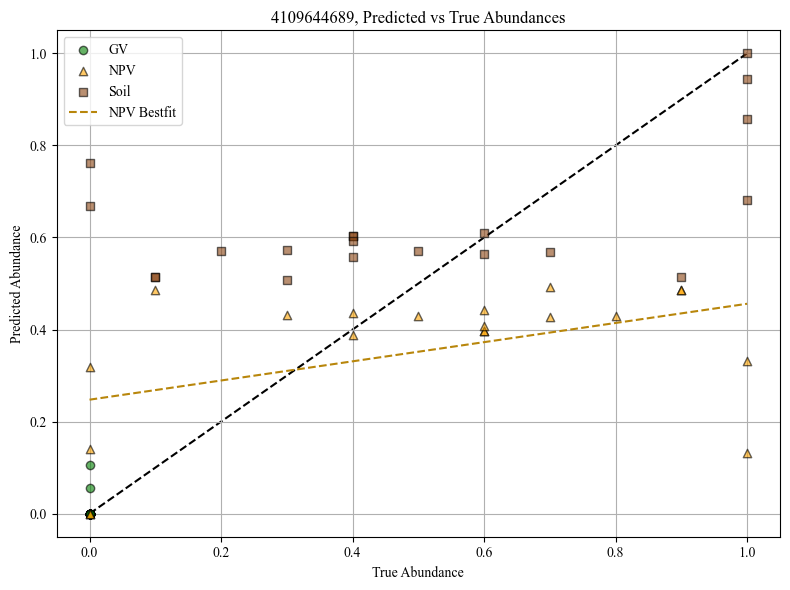

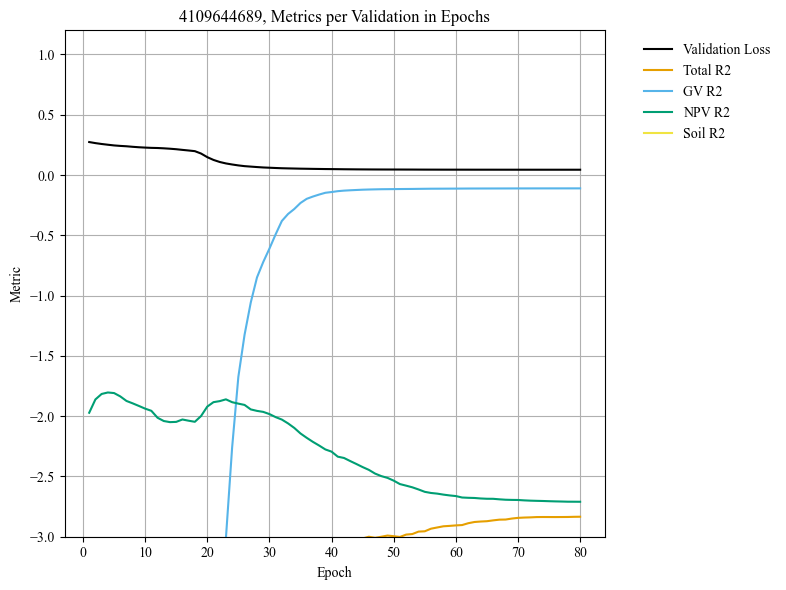

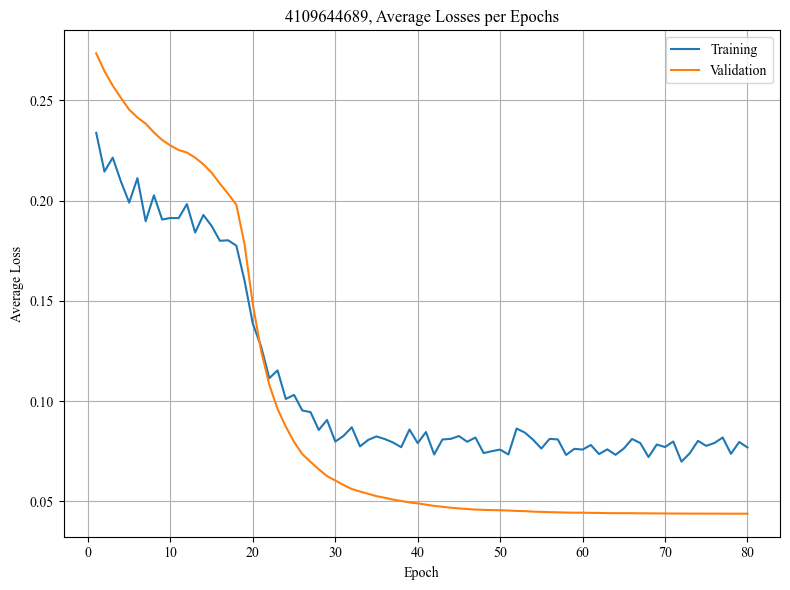

Testing complete
Initial fine tuning complete, with 100 batches
Epoch 1/80, Step 1/20, Train Loss: 0.276151
Epoch 1/80, Step 2/20, Train Loss: 0.266128
Epoch 1/80, Step 3/20, Train Loss: 0.135245
Epoch 1/80, Step 4/20, Train Loss: 0.256855
Epoch 1/80, Step 5/20, Train Loss: 0.242281
Epoch 1/80, Step 6/20, Train Loss: 0.217411
Epoch 1/80, Step 7/20, Train Loss: 0.207877
Epoch 1/80, Step 8/20, Train Loss: 0.125260
Epoch 1/80, Step 9/20, Train Loss: 0.214004
Epoch 1/80, Step 10/20, Train Loss: 0.234315
Epoch 1/80, Step 11/20, Train Loss: 0.254819
Epoch 1/80, Step 12/20, Train Loss: 0.223964
Epoch 1/80, Step 13/20, Train Loss: 0.311367
Epoch 1/80, Step 14/20, Train Loss: 0.236674
Epoch 1/80, Step 15/20, Train Loss: 0.319295
Epoch 1/80, Step 16/20, Train Loss: 0.137817
Epoch 1/80, Step 17/20, Train Loss: 0.126097
Epoch 1/80, Step 18/20, Train Loss: 0.334857
Epoch 1/80, Step 19/20, Train Loss: 0.313268
Epoch 1/80, Step 20/20, Train Loss: 0.206372
Epoch 1/80 complete. Train Loss: 0.232003, Va

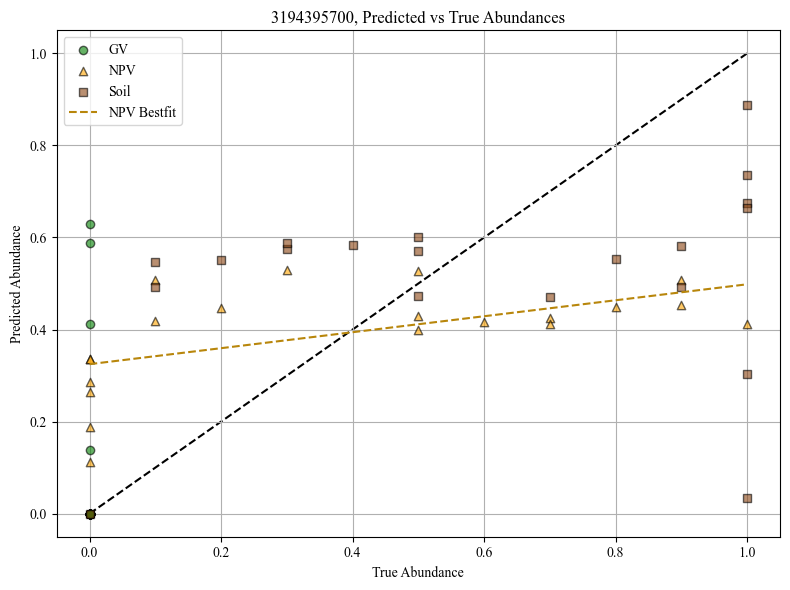

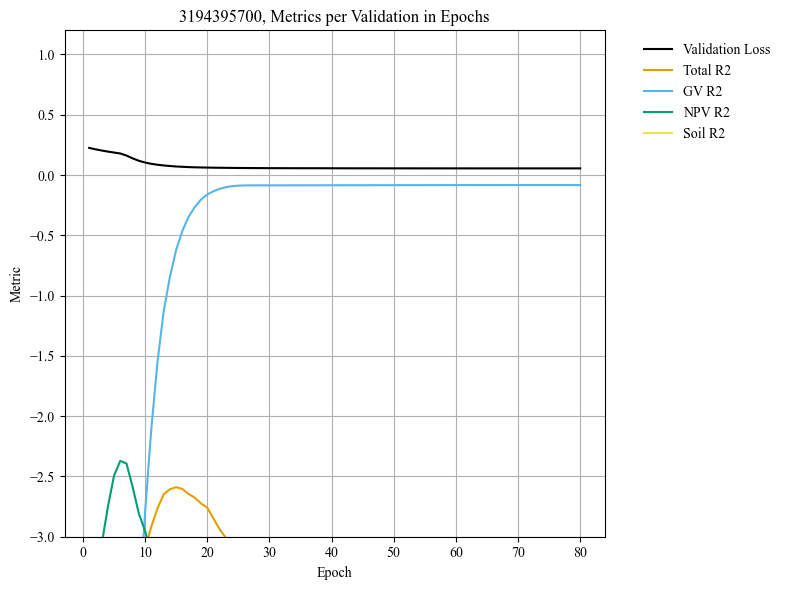

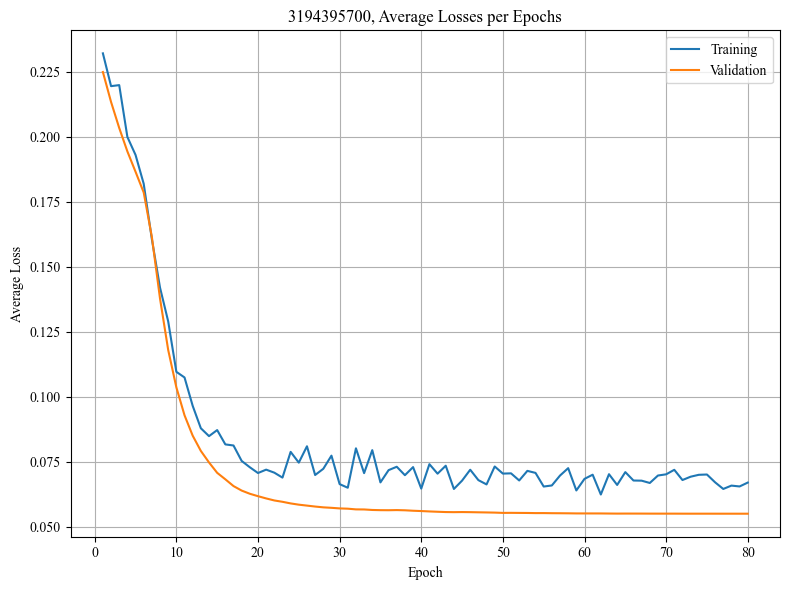

Testing complete
Initial fine tuning complete, with 100 batches
Epoch 1/80, Step 1/20, Train Loss: 0.326501
Epoch 1/80, Step 2/20, Train Loss: 0.172148
Epoch 1/80, Step 3/20, Train Loss: 0.126019
Epoch 1/80, Step 4/20, Train Loss: 0.161370
Epoch 1/80, Step 5/20, Train Loss: 0.377009
Epoch 1/80, Step 6/20, Train Loss: 0.233217
Epoch 1/80, Step 7/20, Train Loss: 0.298680
Epoch 1/80, Step 8/20, Train Loss: 0.275542
Epoch 1/80, Step 9/20, Train Loss: 0.116220
Epoch 1/80, Step 10/20, Train Loss: 0.273197
Epoch 1/80, Step 11/20, Train Loss: 0.233676
Epoch 1/80, Step 12/20, Train Loss: 0.267898
Epoch 1/80, Step 13/20, Train Loss: 0.152547
Epoch 1/80, Step 14/20, Train Loss: 0.199276
Epoch 1/80, Step 15/20, Train Loss: 0.185411
Epoch 1/80, Step 16/20, Train Loss: 0.239522
Epoch 1/80, Step 17/20, Train Loss: 0.197353
Epoch 1/80, Step 18/20, Train Loss: 0.181528
Epoch 1/80, Step 19/20, Train Loss: 0.215877
Epoch 1/80, Step 20/20, Train Loss: 0.287127
Epoch 1/80 complete. Train Loss: 0.226006, Va

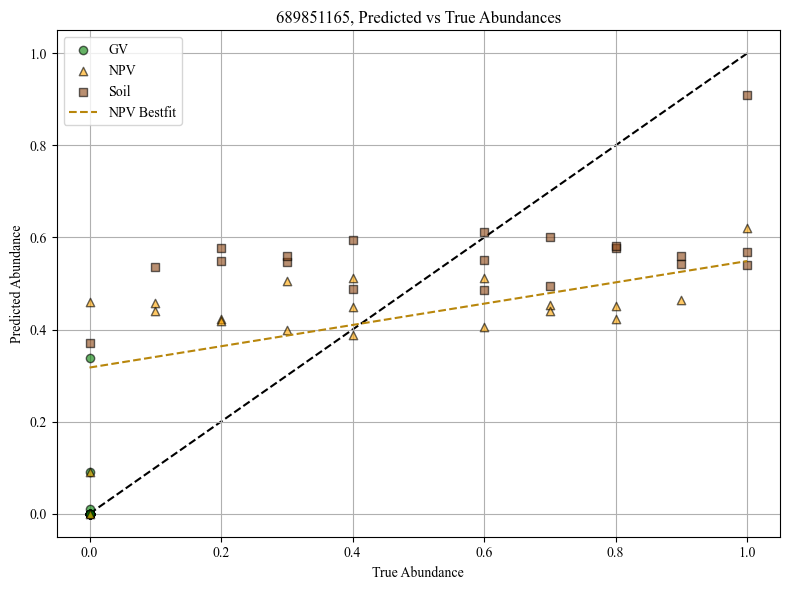

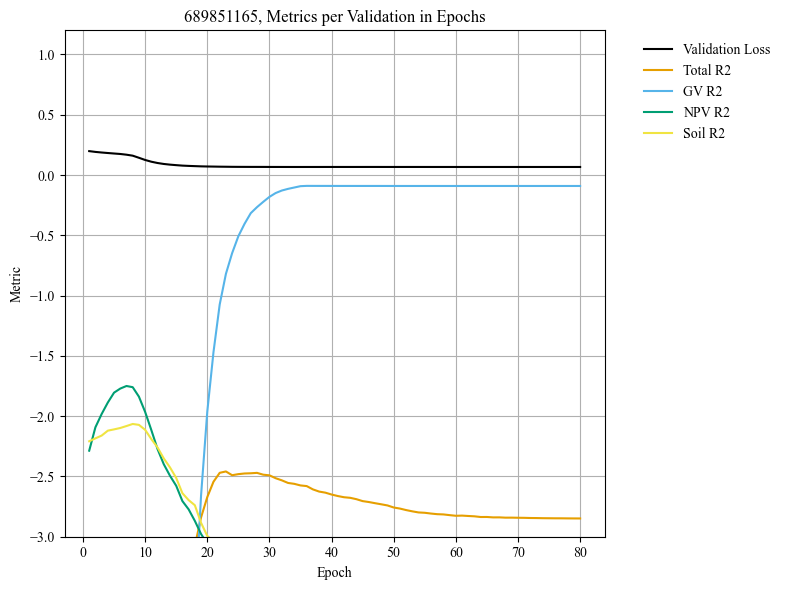

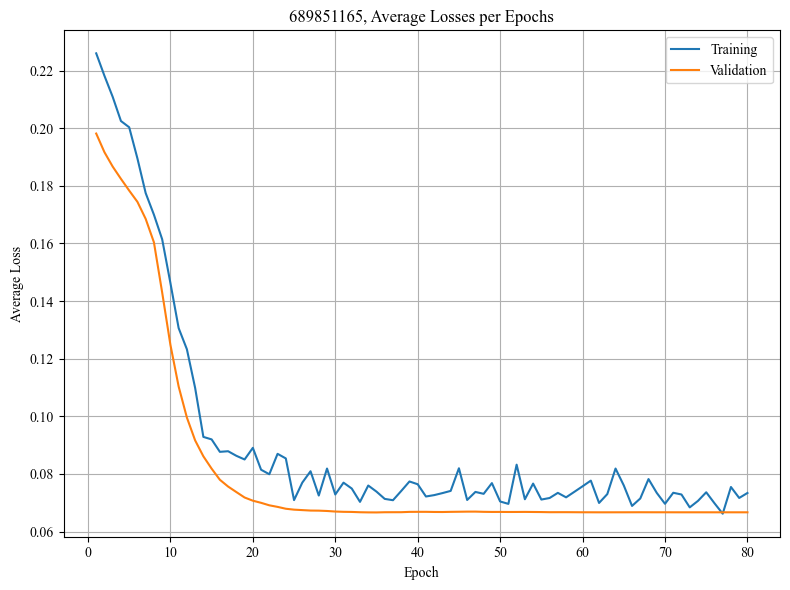

Testing complete
Initial fine tuning complete, with 100 batches
Epoch 1/80, Step 1/20, Train Loss: 0.230046
Epoch 1/80, Step 2/20, Train Loss: 0.214911
Epoch 1/80, Step 3/20, Train Loss: 0.304053
Epoch 1/80, Step 4/20, Train Loss: 0.223367
Epoch 1/80, Step 5/20, Train Loss: 0.269298
Epoch 1/80, Step 6/20, Train Loss: 0.226199
Epoch 1/80, Step 7/20, Train Loss: 0.279150
Epoch 1/80, Step 8/20, Train Loss: 0.198645
Epoch 1/80, Step 9/20, Train Loss: 0.166554
Epoch 1/80, Step 10/20, Train Loss: 0.214597
Epoch 1/80, Step 11/20, Train Loss: 0.226221
Epoch 1/80, Step 12/20, Train Loss: 0.211115
Epoch 1/80, Step 13/20, Train Loss: 0.104541
Epoch 1/80, Step 14/20, Train Loss: 0.306222
Epoch 1/80, Step 15/20, Train Loss: 0.206142
Epoch 1/80, Step 16/20, Train Loss: 0.272966
Epoch 1/80, Step 17/20, Train Loss: 0.305385
Epoch 1/80, Step 18/20, Train Loss: 0.270000
Epoch 1/80, Step 19/20, Train Loss: 0.191570
Epoch 1/80, Step 20/20, Train Loss: 0.242353
Epoch 1/80 complete. Train Loss: 0.233167, Va

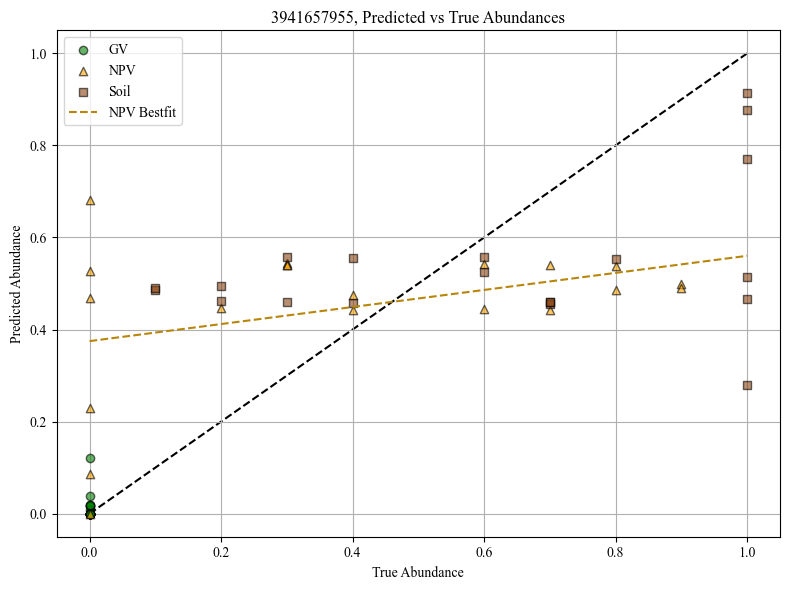

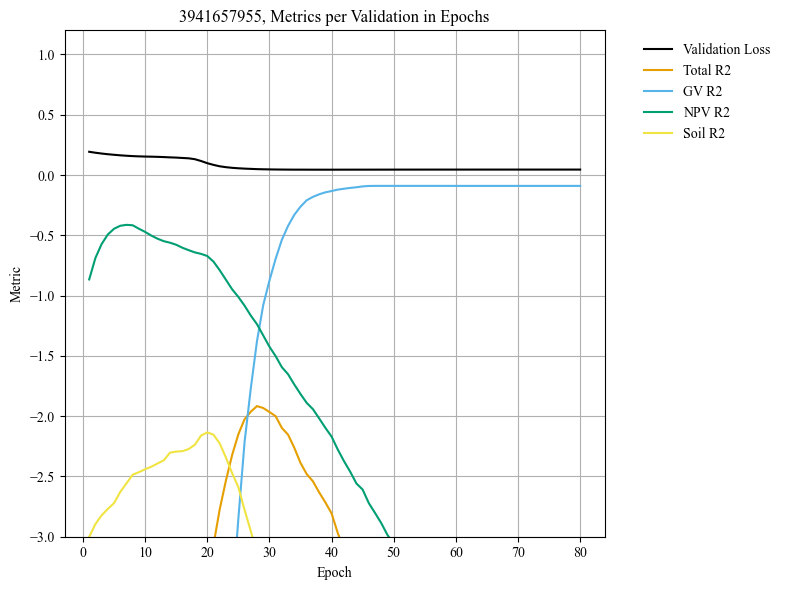

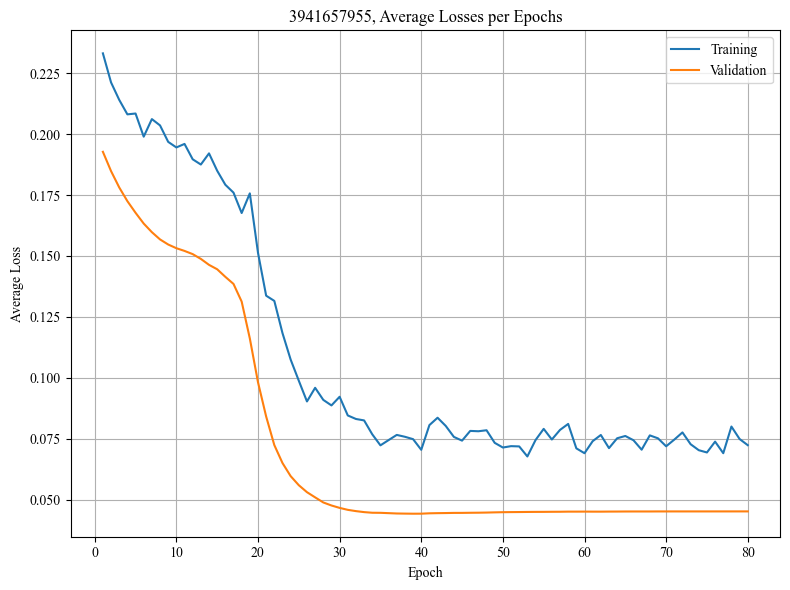

Testing complete
Initial fine tuning complete, with 100 batches
Epoch 1/80, Step 1/20, Train Loss: 0.205109
Epoch 1/80, Step 2/20, Train Loss: 0.236394
Epoch 1/80, Step 3/20, Train Loss: 0.247498
Epoch 1/80, Step 4/20, Train Loss: 0.300815
Epoch 1/80, Step 5/20, Train Loss: 0.240841
Epoch 1/80, Step 6/20, Train Loss: 0.269613
Epoch 1/80, Step 7/20, Train Loss: 0.169058
Epoch 1/80, Step 8/20, Train Loss: 0.355253
Epoch 1/80, Step 9/20, Train Loss: 0.246343
Epoch 1/80, Step 10/20, Train Loss: 0.324398
Epoch 1/80, Step 11/20, Train Loss: 0.258004
Epoch 1/80, Step 12/20, Train Loss: 0.280795
Epoch 1/80, Step 13/20, Train Loss: 0.240427
Epoch 1/80, Step 14/20, Train Loss: 0.176356
Epoch 1/80, Step 15/20, Train Loss: 0.188755
Epoch 1/80, Step 16/20, Train Loss: 0.177622
Epoch 1/80, Step 17/20, Train Loss: 0.286441
Epoch 1/80, Step 18/20, Train Loss: 0.331303
Epoch 1/80, Step 19/20, Train Loss: 0.306039
Epoch 1/80, Step 20/20, Train Loss: 0.230645
Epoch 1/80 complete. Train Loss: 0.253585, Va

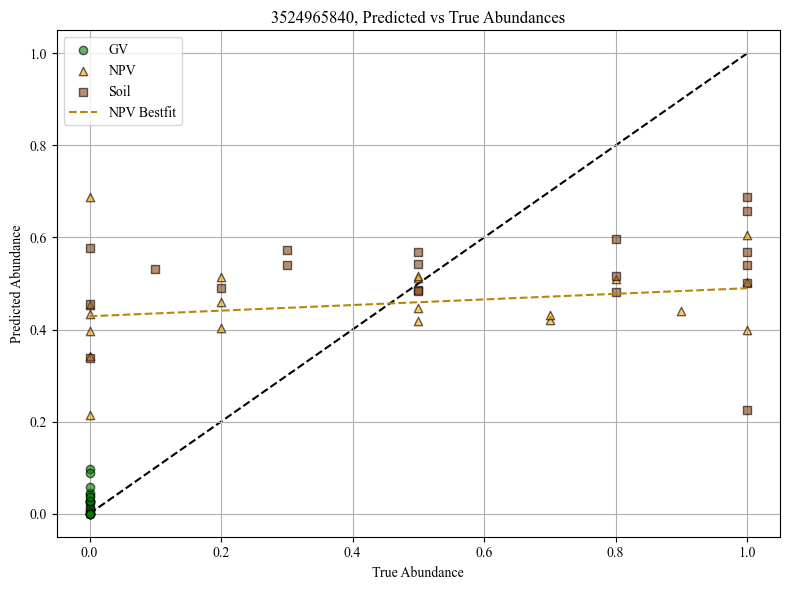

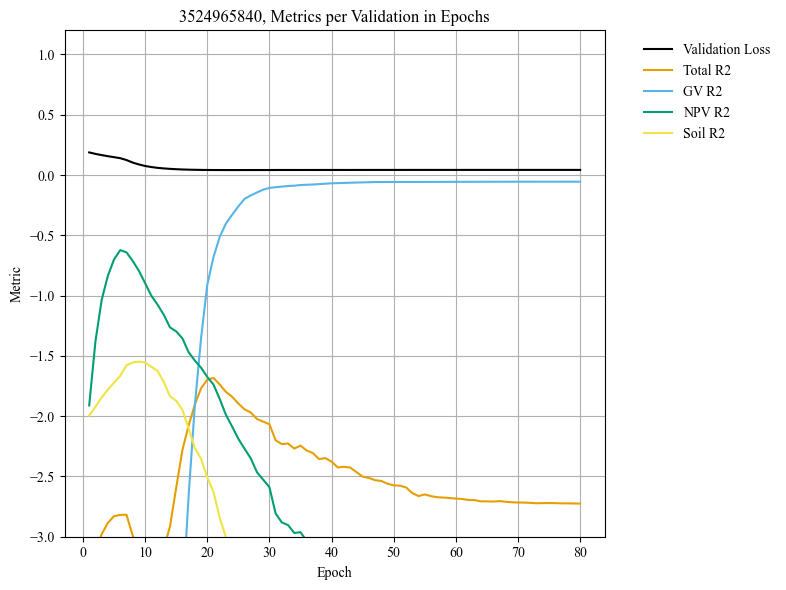

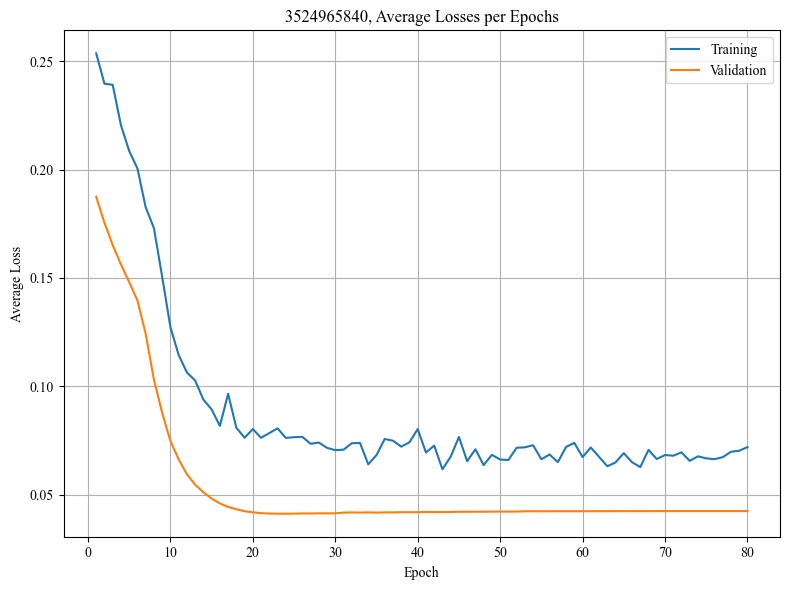

Testing complete
Initial fine tuning complete, with 100 batches
Epoch 1/80, Step 1/20, Train Loss: 0.192262
Epoch 1/80, Step 2/20, Train Loss: 0.201018
Epoch 1/80, Step 3/20, Train Loss: 0.212042
Epoch 1/80, Step 4/20, Train Loss: 0.230979
Epoch 1/80, Step 5/20, Train Loss: 0.217743
Epoch 1/80, Step 6/20, Train Loss: 0.141752
Epoch 1/80, Step 7/20, Train Loss: 0.178210
Epoch 1/80, Step 8/20, Train Loss: 0.211765
Epoch 1/80, Step 9/20, Train Loss: 0.176071
Epoch 1/80, Step 10/20, Train Loss: 0.184364
Epoch 1/80, Step 11/20, Train Loss: 0.195980
Epoch 1/80, Step 12/20, Train Loss: 0.214530
Epoch 1/80, Step 13/20, Train Loss: 0.165283
Epoch 1/80, Step 14/20, Train Loss: 0.325357
Epoch 1/80, Step 15/20, Train Loss: 0.210594
Epoch 1/80, Step 16/20, Train Loss: 0.223215
Epoch 1/80, Step 17/20, Train Loss: 0.249460
Epoch 1/80, Step 18/20, Train Loss: 0.303330
Epoch 1/80, Step 19/20, Train Loss: 0.214683
Epoch 1/80, Step 20/20, Train Loss: 0.303543
Epoch 1/80 complete. Train Loss: 0.217609, Va

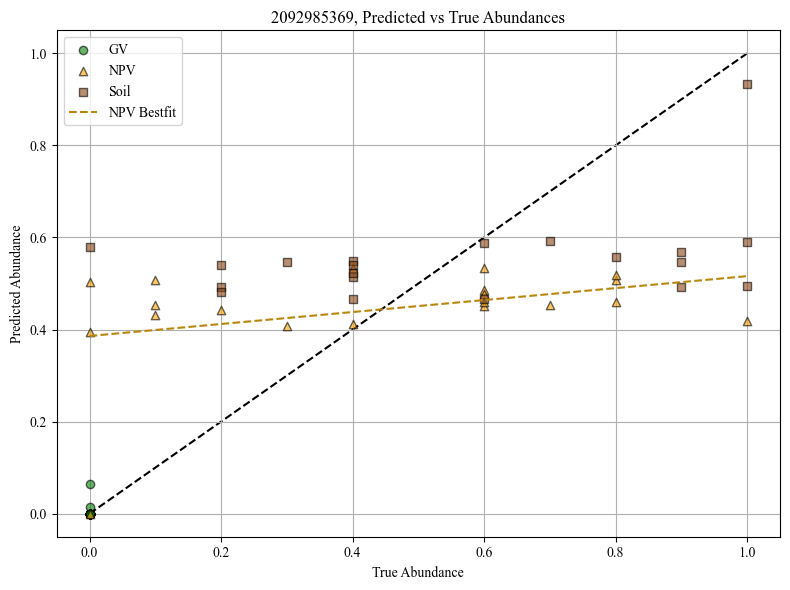

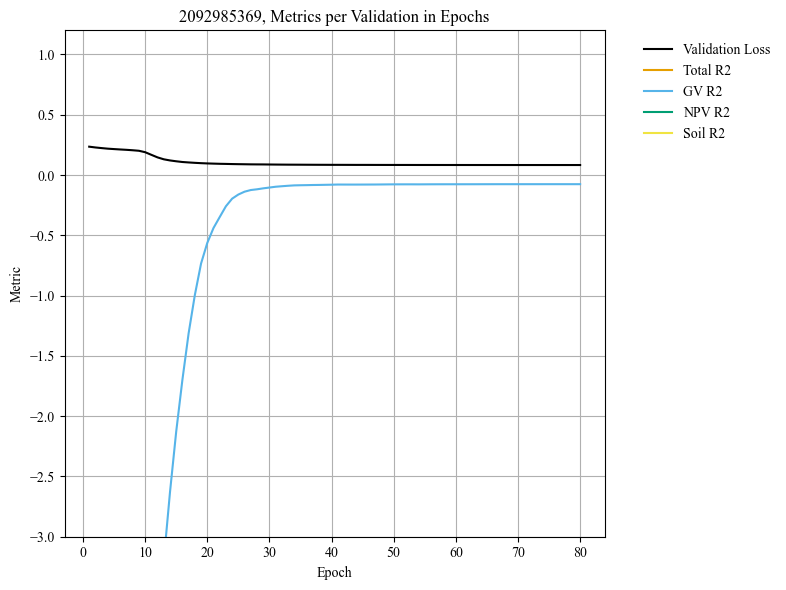

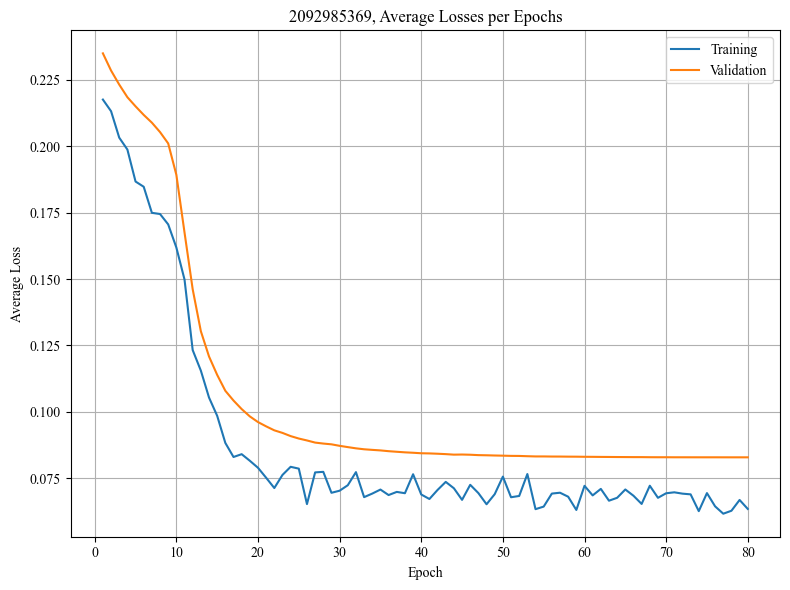

Testing complete
Initial fine tuning complete, with 100 batches
Epoch 1/80, Step 1/20, Train Loss: 0.189383
Epoch 1/80, Step 2/20, Train Loss: 0.201994
Epoch 1/80, Step 3/20, Train Loss: 0.259090
Epoch 1/80, Step 4/20, Train Loss: 0.216901
Epoch 1/80, Step 5/20, Train Loss: 0.207751
Epoch 1/80, Step 6/20, Train Loss: 0.220436
Epoch 1/80, Step 7/20, Train Loss: 0.222098
Epoch 1/80, Step 8/20, Train Loss: 0.199625
Epoch 1/80, Step 9/20, Train Loss: 0.310852
Epoch 1/80, Step 10/20, Train Loss: 0.243105
Epoch 1/80, Step 11/20, Train Loss: 0.155416
Epoch 1/80, Step 12/20, Train Loss: 0.247070
Epoch 1/80, Step 13/20, Train Loss: 0.290068
Epoch 1/80, Step 14/20, Train Loss: 0.290455
Epoch 1/80, Step 15/20, Train Loss: 0.129394
Epoch 1/80, Step 16/20, Train Loss: 0.222747
Epoch 1/80, Step 17/20, Train Loss: 0.259877
Epoch 1/80, Step 18/20, Train Loss: 0.186445
Epoch 1/80, Step 19/20, Train Loss: 0.237477
Epoch 1/80, Step 20/20, Train Loss: 0.281852
Epoch 1/80 complete. Train Loss: 0.228602, Va

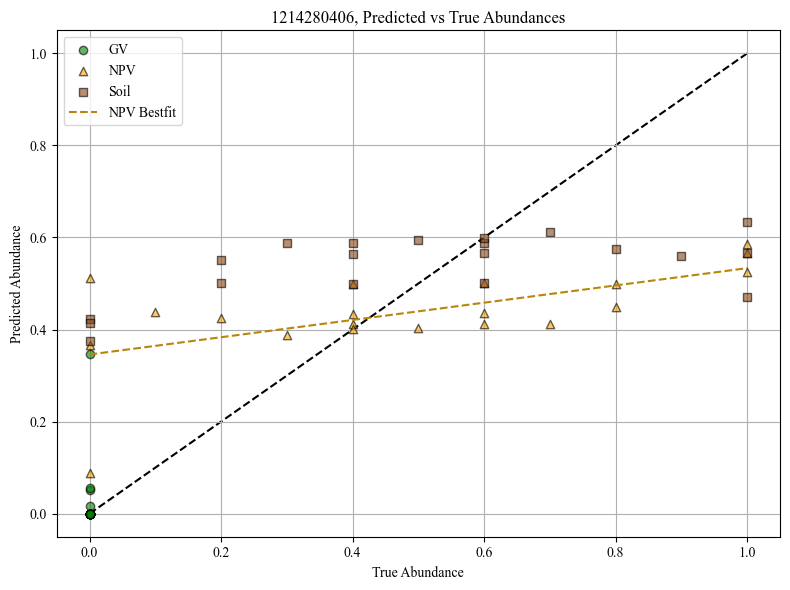

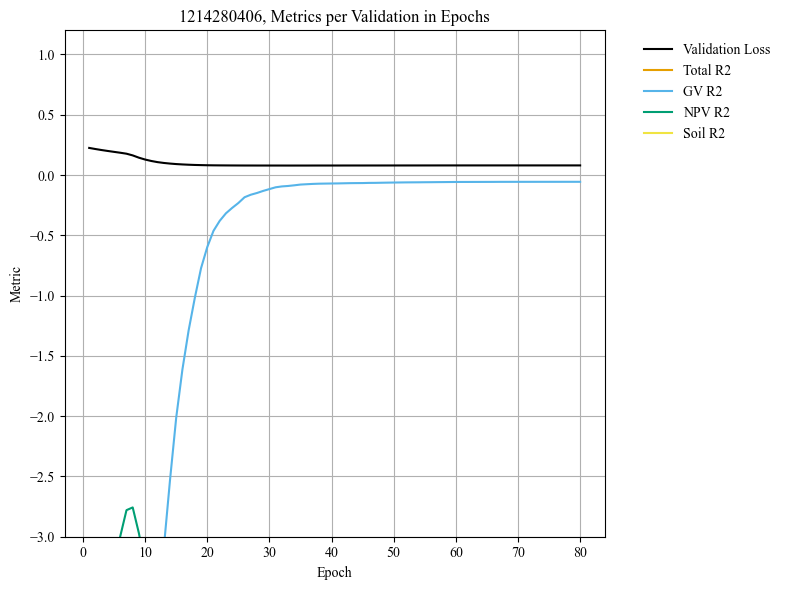

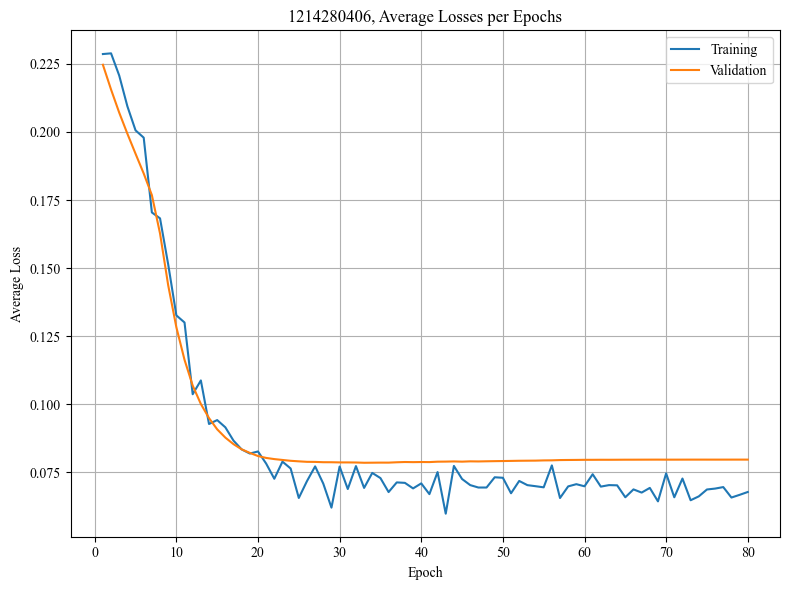

Testing complete
Initial fine tuning complete, with 100 batches
Epoch 1/80, Step 1/20, Train Loss: 0.374029
Epoch 1/80, Step 2/20, Train Loss: 0.254005
Epoch 1/80, Step 3/20, Train Loss: 0.179100
Epoch 1/80, Step 4/20, Train Loss: 0.183320
Epoch 1/80, Step 5/20, Train Loss: 0.247627
Epoch 1/80, Step 6/20, Train Loss: 0.286895
Epoch 1/80, Step 7/20, Train Loss: 0.222260
Epoch 1/80, Step 8/20, Train Loss: 0.230454
Epoch 1/80, Step 9/20, Train Loss: 0.230591
Epoch 1/80, Step 10/20, Train Loss: 0.134312
Epoch 1/80, Step 11/20, Train Loss: 0.261039
Epoch 1/80, Step 12/20, Train Loss: 0.173926
Epoch 1/80, Step 13/20, Train Loss: 0.309677
Epoch 1/80, Step 14/20, Train Loss: 0.323325
Epoch 1/80, Step 15/20, Train Loss: 0.264454
Epoch 1/80, Step 16/20, Train Loss: 0.127716
Epoch 1/80, Step 17/20, Train Loss: 0.189939
Epoch 1/80, Step 18/20, Train Loss: 0.210689
Epoch 1/80, Step 19/20, Train Loss: 0.307746
Epoch 1/80, Step 20/20, Train Loss: 0.218946
Epoch 1/80 complete. Train Loss: 0.236502, Va

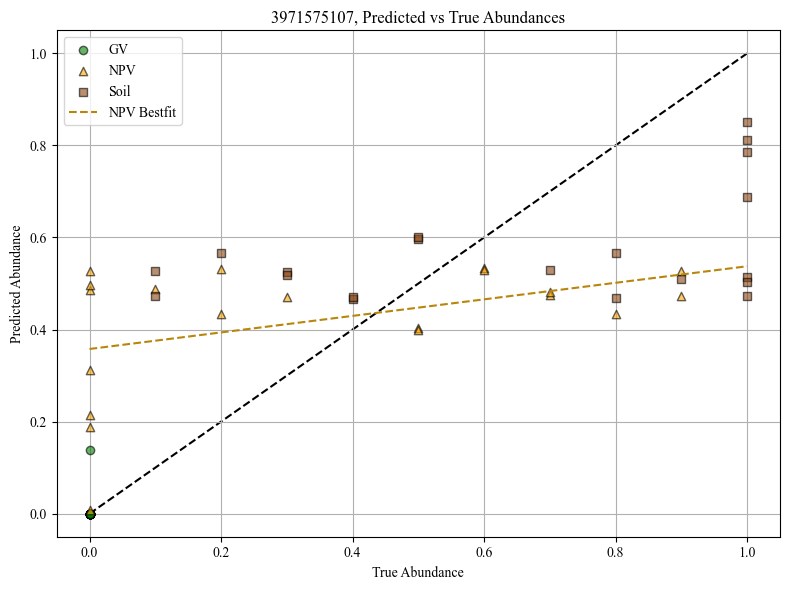

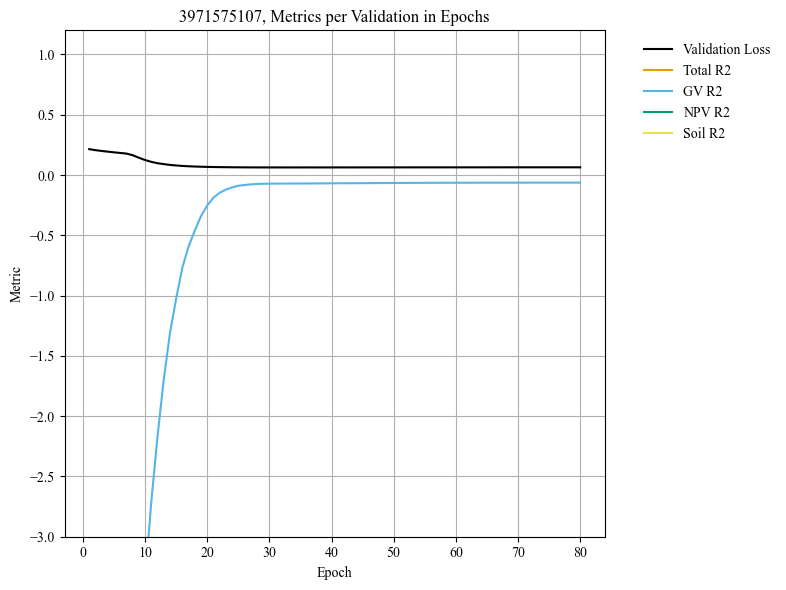

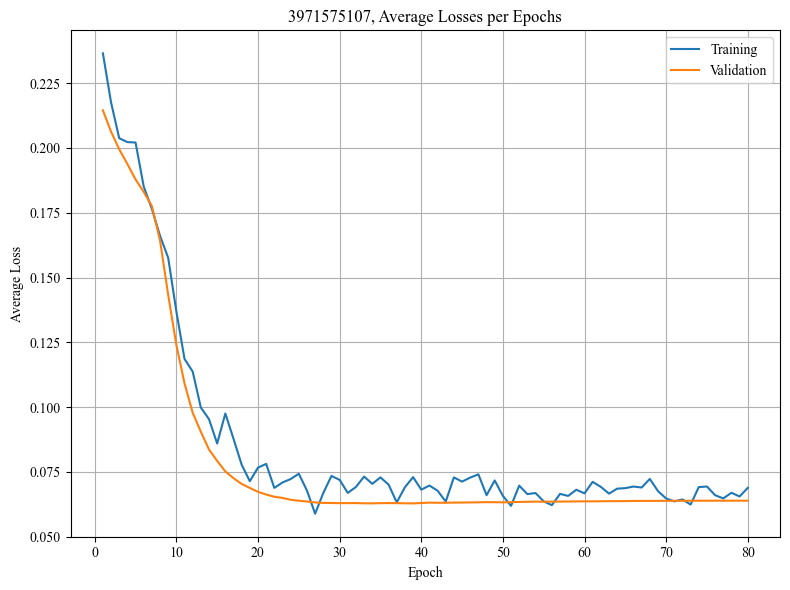

Testing complete
Initial fine tuning complete, with 100 batches
Epoch 1/80, Step 1/20, Train Loss: 0.197647
Epoch 1/80, Step 2/20, Train Loss: 0.145644
Epoch 1/80, Step 3/20, Train Loss: 0.226315
Epoch 1/80, Step 4/20, Train Loss: 0.282796
Epoch 1/80, Step 5/20, Train Loss: 0.245705
Epoch 1/80, Step 6/20, Train Loss: 0.164136
Epoch 1/80, Step 7/20, Train Loss: 0.277265
Epoch 1/80, Step 8/20, Train Loss: 0.201256
Epoch 1/80, Step 9/20, Train Loss: 0.280147
Epoch 1/80, Step 10/20, Train Loss: 0.293118
Epoch 1/80, Step 11/20, Train Loss: 0.084205
Epoch 1/80, Step 12/20, Train Loss: 0.215706
Epoch 1/80, Step 13/20, Train Loss: 0.283107
Epoch 1/80, Step 14/20, Train Loss: 0.268731
Epoch 1/80, Step 15/20, Train Loss: 0.134641
Epoch 1/80, Step 16/20, Train Loss: 0.239686
Epoch 1/80, Step 17/20, Train Loss: 0.159600
Epoch 1/80, Step 18/20, Train Loss: 0.204503
Epoch 1/80, Step 19/20, Train Loss: 0.201759
Epoch 1/80, Step 20/20, Train Loss: 0.291698
Epoch 1/80 complete. Train Loss: 0.219883, Va

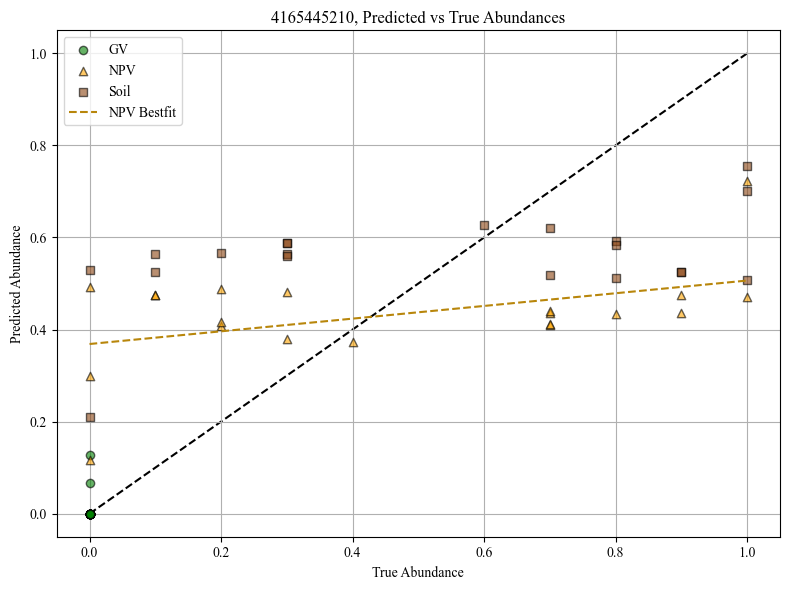

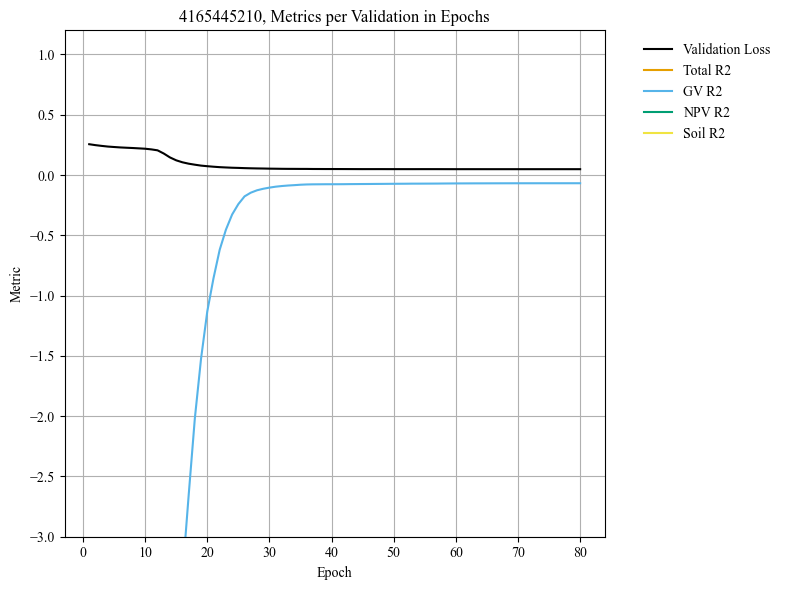

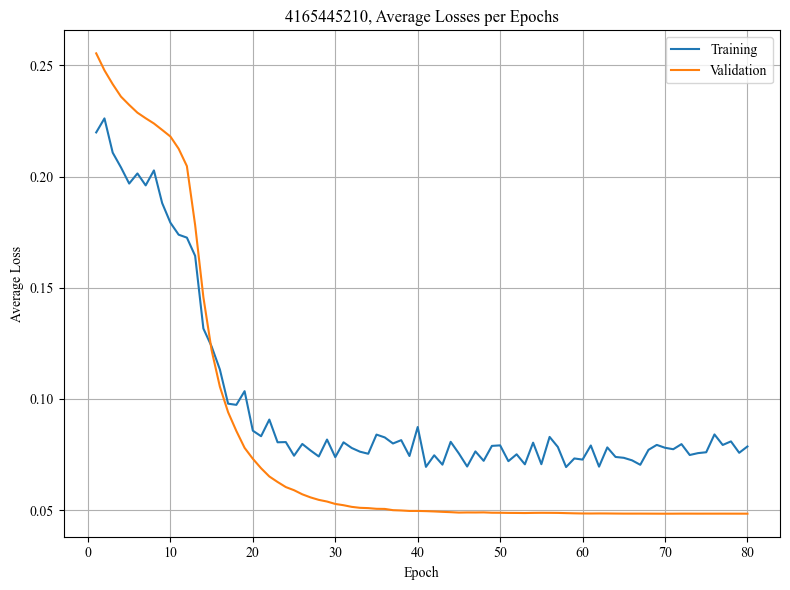

Testing complete
Initial fine tuning complete, with 100 batches
Epoch 1/80, Step 1/20, Train Loss: 0.243206
Epoch 1/80, Step 2/20, Train Loss: 0.196037
Epoch 1/80, Step 3/20, Train Loss: 0.157766
Epoch 1/80, Step 4/20, Train Loss: 0.261974
Epoch 1/80, Step 5/20, Train Loss: 0.273931
Epoch 1/80, Step 6/20, Train Loss: 0.222993
Epoch 1/80, Step 7/20, Train Loss: 0.207844
Epoch 1/80, Step 8/20, Train Loss: 0.251593
Epoch 1/80, Step 9/20, Train Loss: 0.320241
Epoch 1/80, Step 10/20, Train Loss: 0.336450
Epoch 1/80, Step 11/20, Train Loss: 0.234614
Epoch 1/80, Step 12/20, Train Loss: 0.205877
Epoch 1/80, Step 13/20, Train Loss: 0.283113
Epoch 1/80, Step 14/20, Train Loss: 0.260839
Epoch 1/80, Step 15/20, Train Loss: 0.171121
Epoch 1/80, Step 16/20, Train Loss: 0.249922
Epoch 1/80, Step 17/20, Train Loss: 0.269027
Epoch 1/80, Step 18/20, Train Loss: 0.252710
Epoch 1/80, Step 19/20, Train Loss: 0.197190
Epoch 1/80, Step 20/20, Train Loss: 0.255568
Epoch 1/80 complete. Train Loss: 0.242601, Va

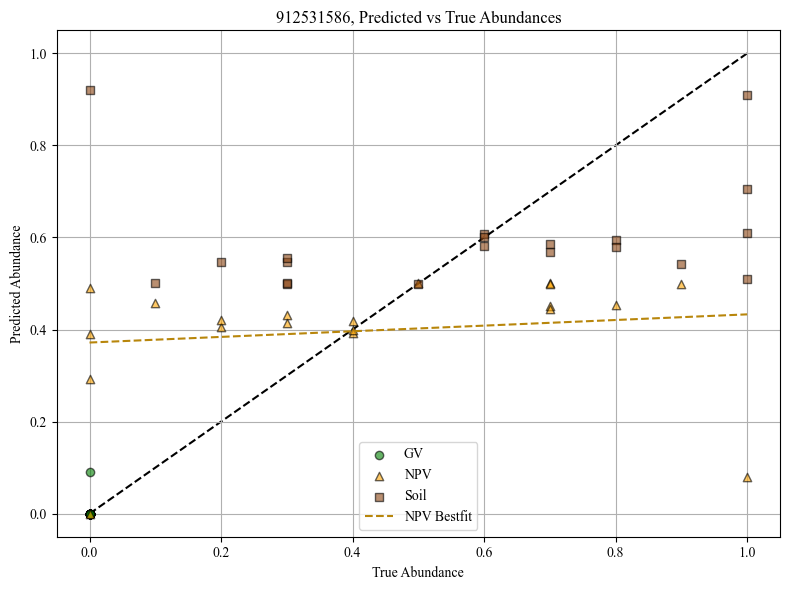

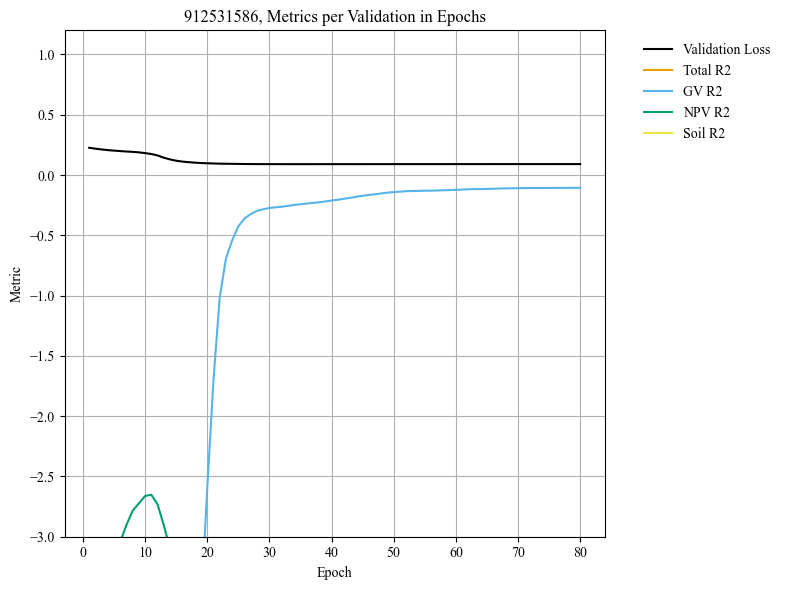

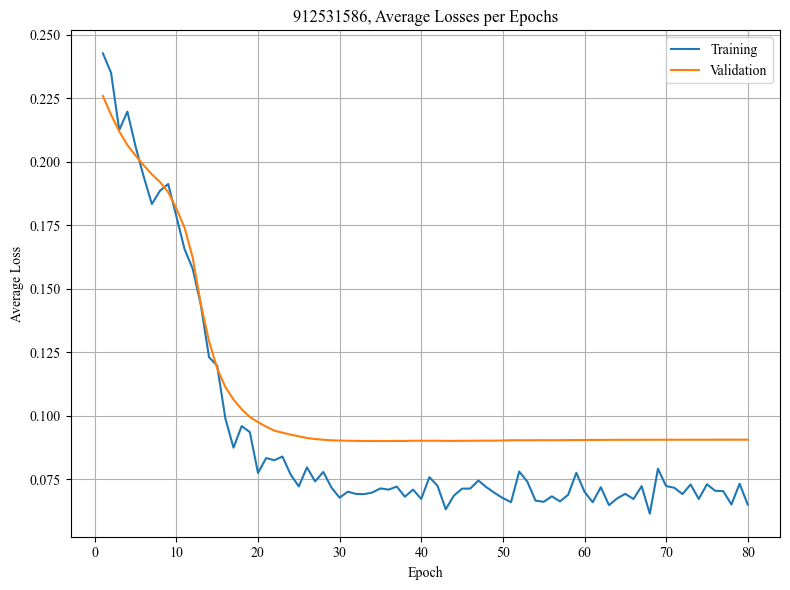

Testing complete
Initial fine tuning complete, with 100 batches
Epoch 1/80, Step 1/20, Train Loss: 0.269730
Epoch 1/80, Step 2/20, Train Loss: 0.201287
Epoch 1/80, Step 3/20, Train Loss: 0.155771
Epoch 1/80, Step 4/20, Train Loss: 0.204129
Epoch 1/80, Step 5/20, Train Loss: 0.227529
Epoch 1/80, Step 6/20, Train Loss: 0.300042
Epoch 1/80, Step 7/20, Train Loss: 0.237659
Epoch 1/80, Step 8/20, Train Loss: 0.225731
Epoch 1/80, Step 9/20, Train Loss: 0.306619
Epoch 1/80, Step 10/20, Train Loss: 0.198764
Epoch 1/80, Step 11/20, Train Loss: 0.177595
Epoch 1/80, Step 12/20, Train Loss: 0.193338
Epoch 1/80, Step 13/20, Train Loss: 0.208570
Epoch 1/80, Step 14/20, Train Loss: 0.303307
Epoch 1/80, Step 15/20, Train Loss: 0.215109
Epoch 1/80, Step 16/20, Train Loss: 0.311401
Epoch 1/80, Step 17/20, Train Loss: 0.183026
Epoch 1/80, Step 18/20, Train Loss: 0.212950
Epoch 1/80, Step 19/20, Train Loss: 0.233763
Epoch 1/80, Step 20/20, Train Loss: 0.375351
Epoch 1/80 complete. Train Loss: 0.237083, Va

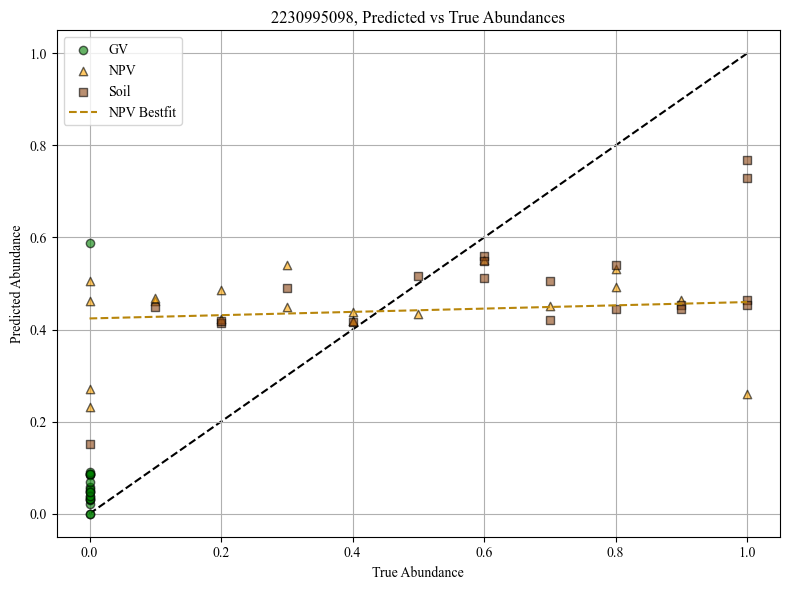

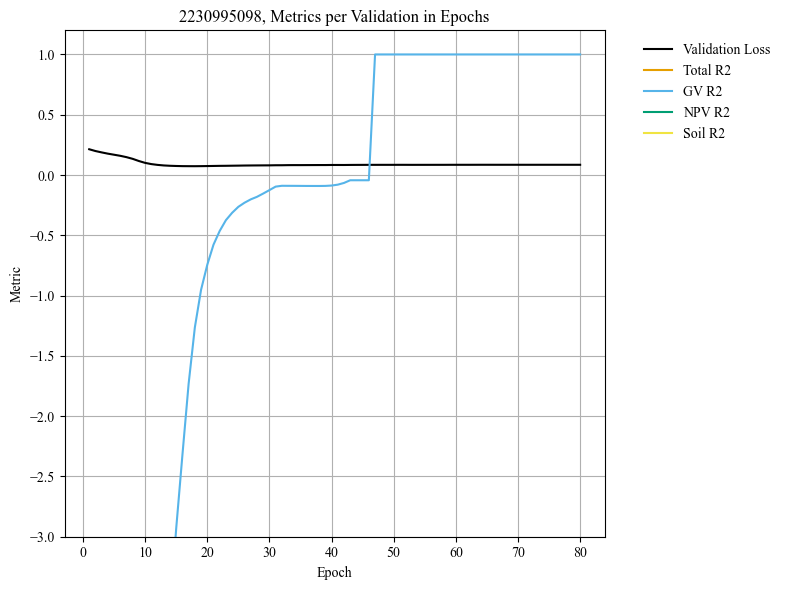

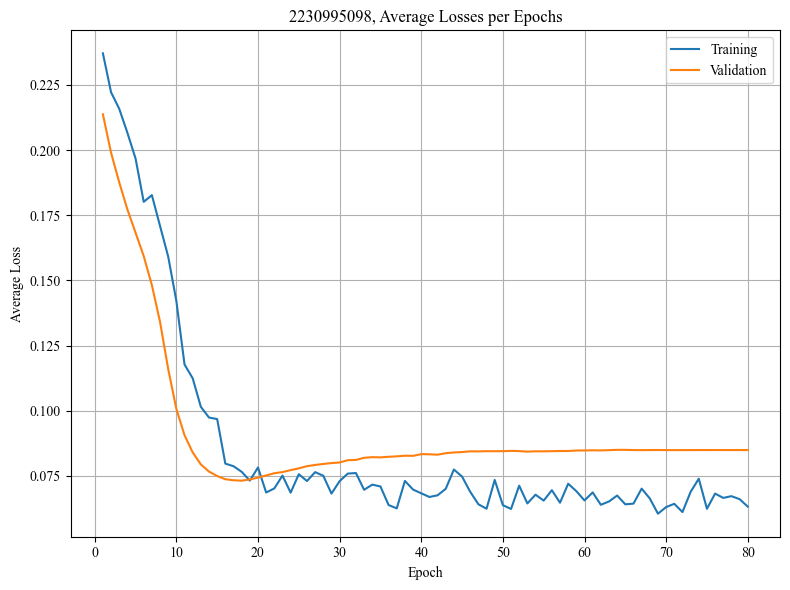

Testing complete
Initial fine tuning complete, with 100 batches
Epoch 1/80, Step 1/20, Train Loss: 0.268317
Epoch 1/80, Step 2/20, Train Loss: 0.284540
Epoch 1/80, Step 3/20, Train Loss: 0.233726
Epoch 1/80, Step 4/20, Train Loss: 0.136889
Epoch 1/80, Step 5/20, Train Loss: 0.239441
Epoch 1/80, Step 6/20, Train Loss: 0.200190
Epoch 1/80, Step 7/20, Train Loss: 0.238488
Epoch 1/80, Step 8/20, Train Loss: 0.318568
Epoch 1/80, Step 9/20, Train Loss: 0.128545
Epoch 1/80, Step 10/20, Train Loss: 0.194610
Epoch 1/80, Step 11/20, Train Loss: 0.205464
Epoch 1/80, Step 12/20, Train Loss: 0.175701
Epoch 1/80, Step 13/20, Train Loss: 0.319068
Epoch 1/80, Step 14/20, Train Loss: 0.156476
Epoch 1/80, Step 15/20, Train Loss: 0.201035
Epoch 1/80, Step 16/20, Train Loss: 0.243417
Epoch 1/80, Step 17/20, Train Loss: 0.246427
Epoch 1/80, Step 18/20, Train Loss: 0.157437
Epoch 1/80, Step 19/20, Train Loss: 0.303093
Epoch 1/80, Step 20/20, Train Loss: 0.186762
Epoch 1/80 complete. Train Loss: 0.221910, Va

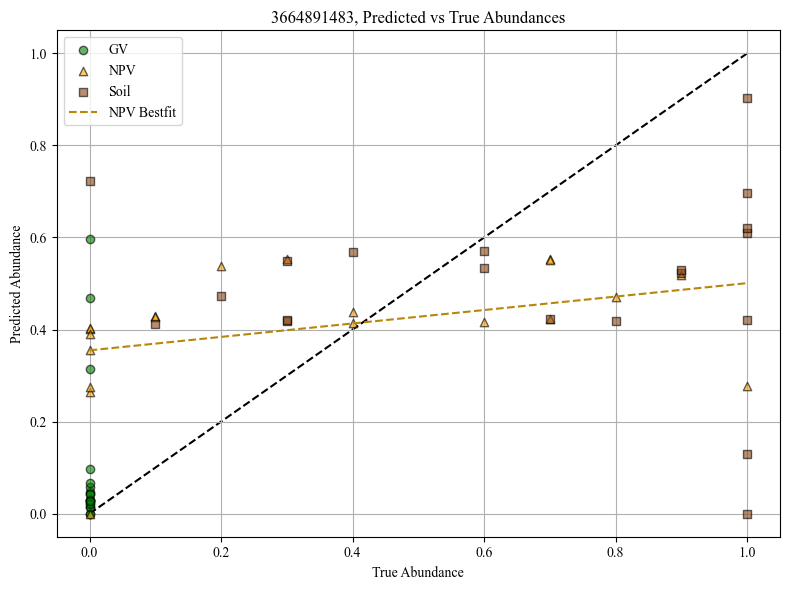

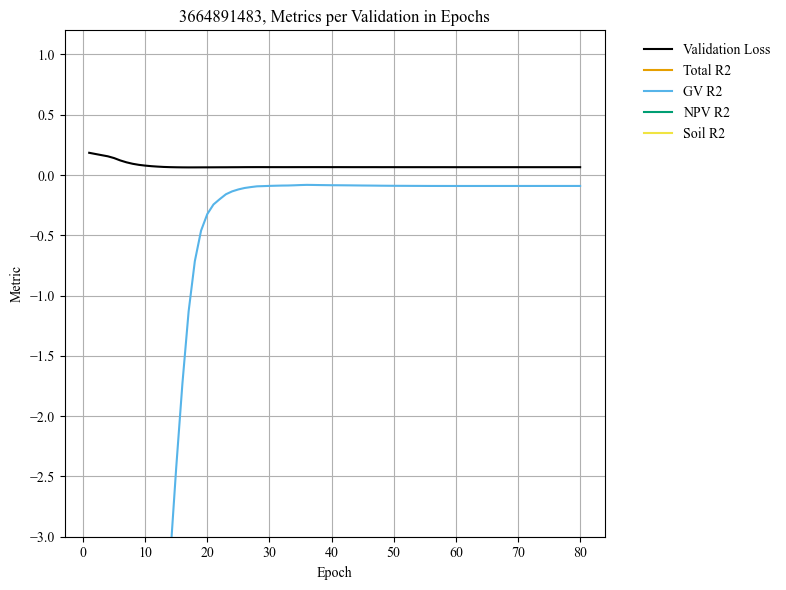

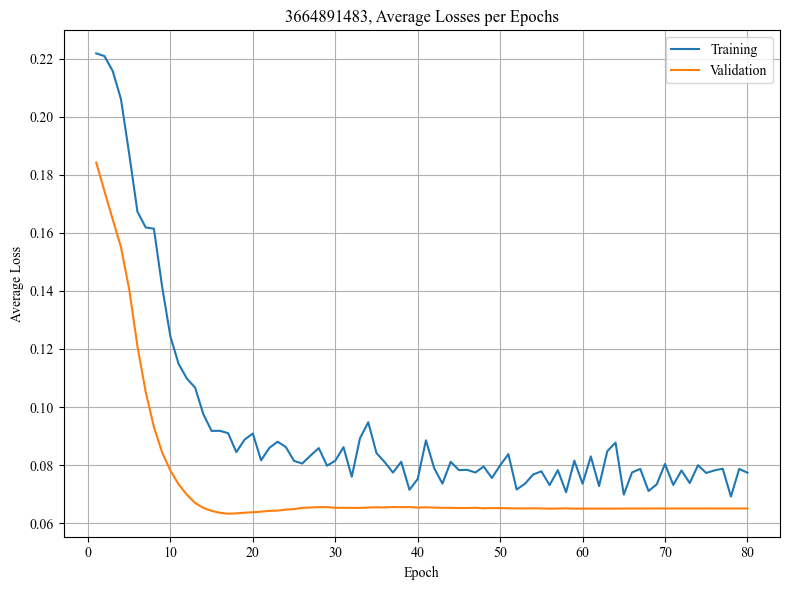

Testing complete
Initial fine tuning complete, with 100 batches
Epoch 1/80, Step 1/20, Train Loss: 0.168773
Epoch 1/80, Step 2/20, Train Loss: 0.225933
Epoch 1/80, Step 3/20, Train Loss: 0.219736
Epoch 1/80, Step 4/20, Train Loss: 0.243479
Epoch 1/80, Step 5/20, Train Loss: 0.161315
Epoch 1/80, Step 6/20, Train Loss: 0.239258
Epoch 1/80, Step 7/20, Train Loss: 0.159545
Epoch 1/80, Step 8/20, Train Loss: 0.247686
Epoch 1/80, Step 9/20, Train Loss: 0.188608
Epoch 1/80, Step 10/20, Train Loss: 0.275010
Epoch 1/80, Step 11/20, Train Loss: 0.149100
Epoch 1/80, Step 12/20, Train Loss: 0.150259
Epoch 1/80, Step 13/20, Train Loss: 0.216938
Epoch 1/80, Step 14/20, Train Loss: 0.168403
Epoch 1/80, Step 15/20, Train Loss: 0.204382
Epoch 1/80, Step 16/20, Train Loss: 0.236179
Epoch 1/80, Step 17/20, Train Loss: 0.310907
Epoch 1/80, Step 18/20, Train Loss: 0.170052
Epoch 1/80, Step 19/20, Train Loss: 0.207294
Epoch 1/80, Step 20/20, Train Loss: 0.368125
Epoch 1/80 complete. Train Loss: 0.215549, Va

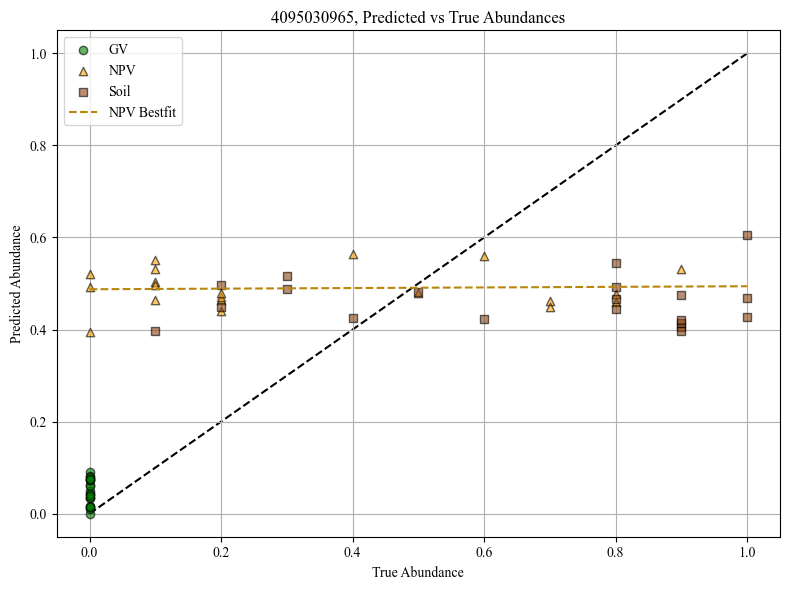

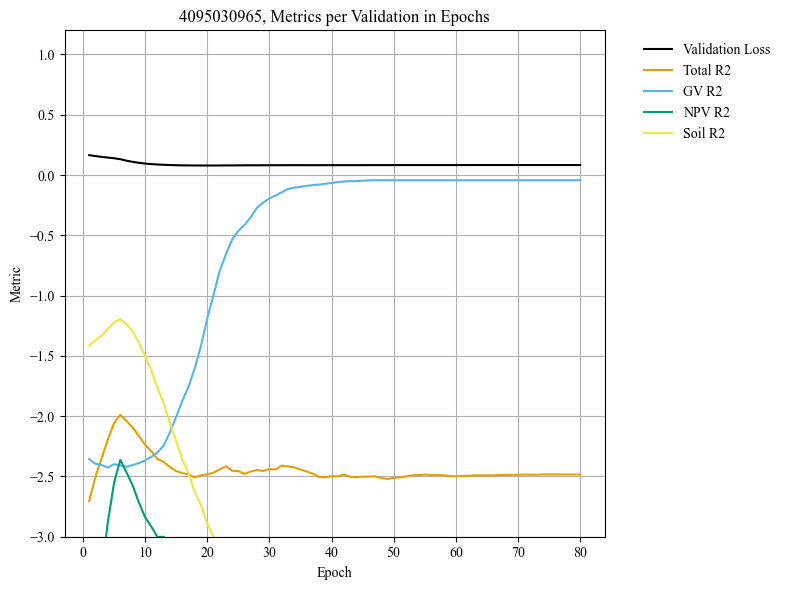

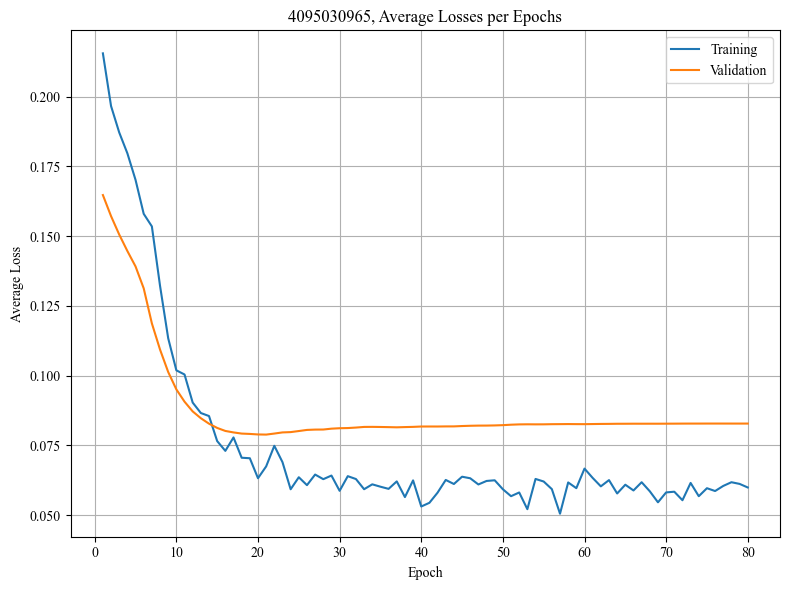

Testing complete
Initial fine tuning complete, with 100 batches
Epoch 1/80, Step 1/20, Train Loss: 0.256092
Epoch 1/80, Step 2/20, Train Loss: 0.160418
Epoch 1/80, Step 3/20, Train Loss: 0.150925
Epoch 1/80, Step 4/20, Train Loss: 0.273654
Epoch 1/80, Step 5/20, Train Loss: 0.167639
Epoch 1/80, Step 6/20, Train Loss: 0.125743
Epoch 1/80, Step 7/20, Train Loss: 0.179297
Epoch 1/80, Step 8/20, Train Loss: 0.312508
Epoch 1/80, Step 9/20, Train Loss: 0.171219
Epoch 1/80, Step 10/20, Train Loss: 0.174963
Epoch 1/80, Step 11/20, Train Loss: 0.331070
Epoch 1/80, Step 12/20, Train Loss: 0.192009
Epoch 1/80, Step 13/20, Train Loss: 0.184984
Epoch 1/80, Step 14/20, Train Loss: 0.299274
Epoch 1/80, Step 15/20, Train Loss: 0.240417
Epoch 1/80, Step 16/20, Train Loss: 0.165695
Epoch 1/80, Step 17/20, Train Loss: 0.160751
Epoch 1/80, Step 18/20, Train Loss: 0.181645
Epoch 1/80, Step 19/20, Train Loss: 0.261617
Epoch 1/80, Step 20/20, Train Loss: 0.222306
Epoch 1/80 complete. Train Loss: 0.210611, Va

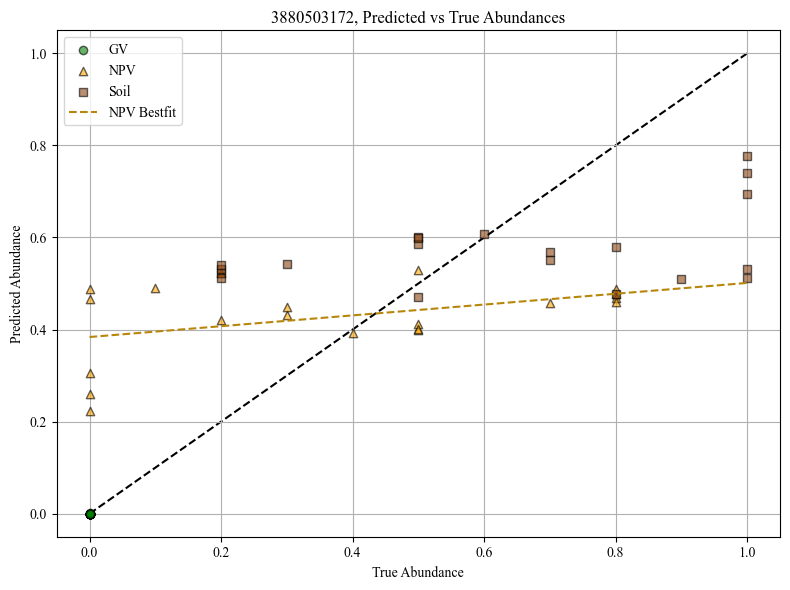

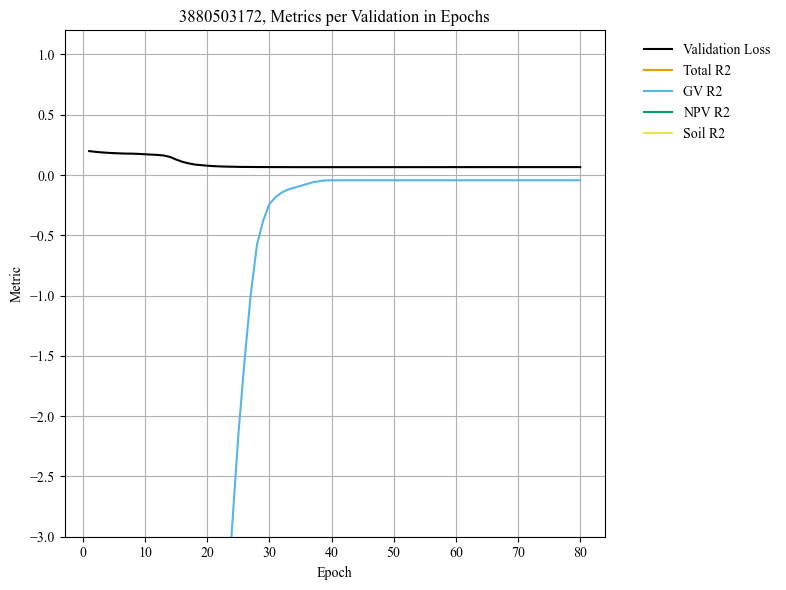

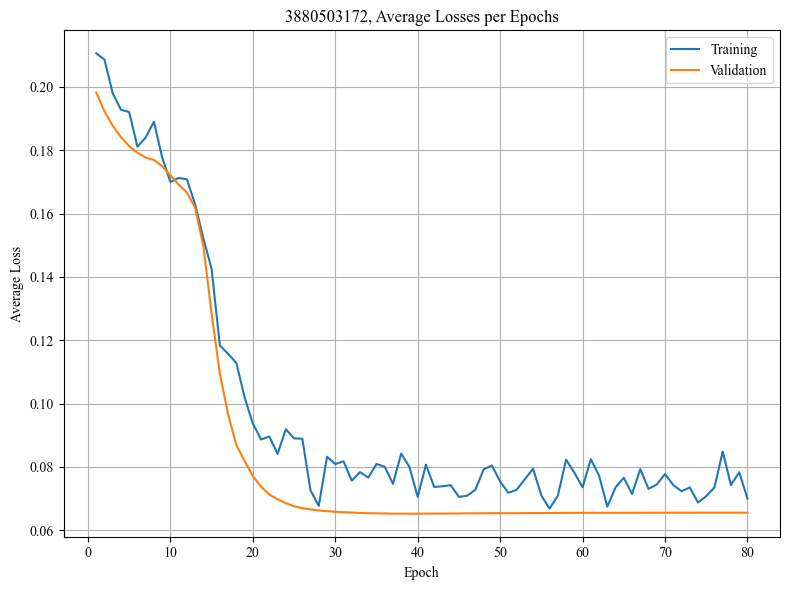

Testing complete
Initial fine tuning complete, with 100 batches
Epoch 1/80, Step 1/20, Train Loss: 0.202869
Epoch 1/80, Step 2/20, Train Loss: 0.244121
Epoch 1/80, Step 3/20, Train Loss: 0.284392
Epoch 1/80, Step 4/20, Train Loss: 0.219517
Epoch 1/80, Step 5/20, Train Loss: 0.241811
Epoch 1/80, Step 6/20, Train Loss: 0.260265
Epoch 1/80, Step 7/20, Train Loss: 0.324612
Epoch 1/80, Step 8/20, Train Loss: 0.168635
Epoch 1/80, Step 9/20, Train Loss: 0.239520
Epoch 1/80, Step 10/20, Train Loss: 0.209564
Epoch 1/80, Step 11/20, Train Loss: 0.275893
Epoch 1/80, Step 12/20, Train Loss: 0.349736
Epoch 1/80, Step 13/20, Train Loss: 0.283262
Epoch 1/80, Step 14/20, Train Loss: 0.196771
Epoch 1/80, Step 15/20, Train Loss: 0.156300
Epoch 1/80, Step 16/20, Train Loss: 0.103864
Epoch 1/80, Step 17/20, Train Loss: 0.155453
Epoch 1/80, Step 18/20, Train Loss: 0.173900
Epoch 1/80, Step 19/20, Train Loss: 0.168466
Epoch 1/80, Step 20/20, Train Loss: 0.237639
Epoch 1/80 complete. Train Loss: 0.224829, Va

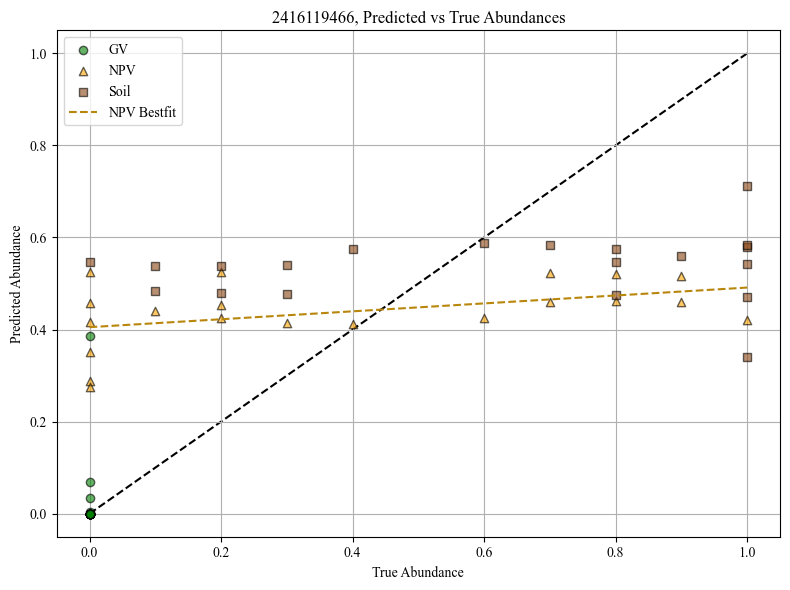

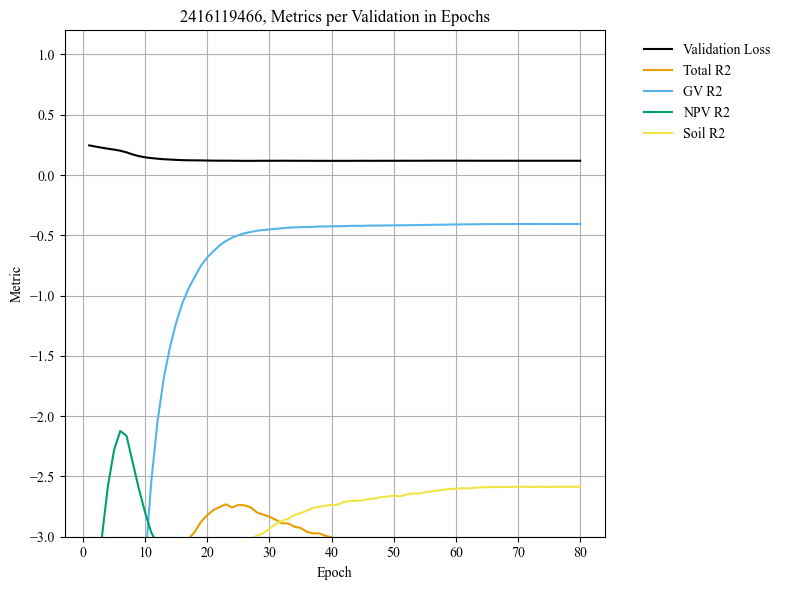

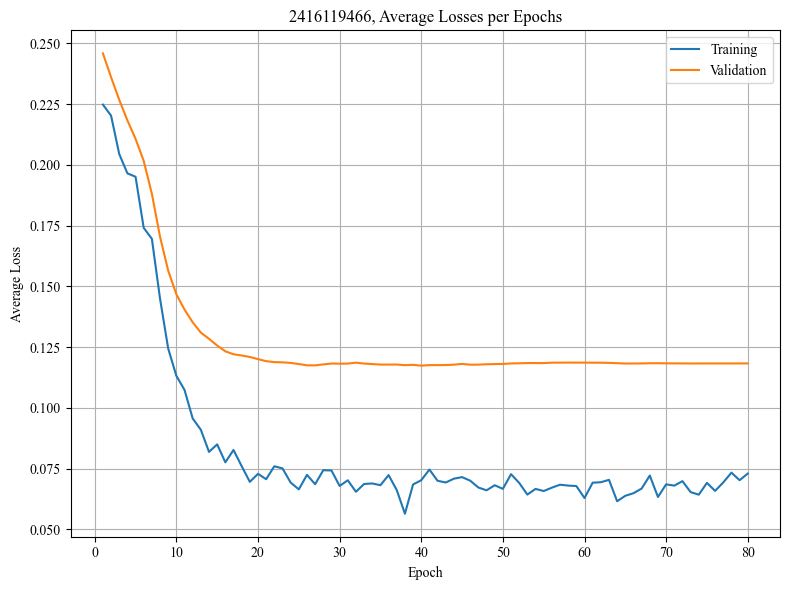

Testing complete
Initial fine tuning complete, with 100 batches
Epoch 1/80, Step 1/20, Train Loss: 0.189505
Epoch 1/80, Step 2/20, Train Loss: 0.212382
Epoch 1/80, Step 3/20, Train Loss: 0.192111
Epoch 1/80, Step 4/20, Train Loss: 0.385778
Epoch 1/80, Step 5/20, Train Loss: 0.183895
Epoch 1/80, Step 6/20, Train Loss: 0.183671
Epoch 1/80, Step 7/20, Train Loss: 0.102656
Epoch 1/80, Step 8/20, Train Loss: 0.192921
Epoch 1/80, Step 9/20, Train Loss: 0.231883
Epoch 1/80, Step 10/20, Train Loss: 0.148847
Epoch 1/80, Step 11/20, Train Loss: 0.201120
Epoch 1/80, Step 12/20, Train Loss: 0.311795
Epoch 1/80, Step 13/20, Train Loss: 0.180266
Epoch 1/80, Step 14/20, Train Loss: 0.208885
Epoch 1/80, Step 15/20, Train Loss: 0.176232
Epoch 1/80, Step 16/20, Train Loss: 0.224748
Epoch 1/80, Step 17/20, Train Loss: 0.233985
Epoch 1/80, Step 18/20, Train Loss: 0.211003
Epoch 1/80, Step 19/20, Train Loss: 0.161411
Epoch 1/80, Step 20/20, Train Loss: 0.324124
Epoch 1/80 complete. Train Loss: 0.212861, Va

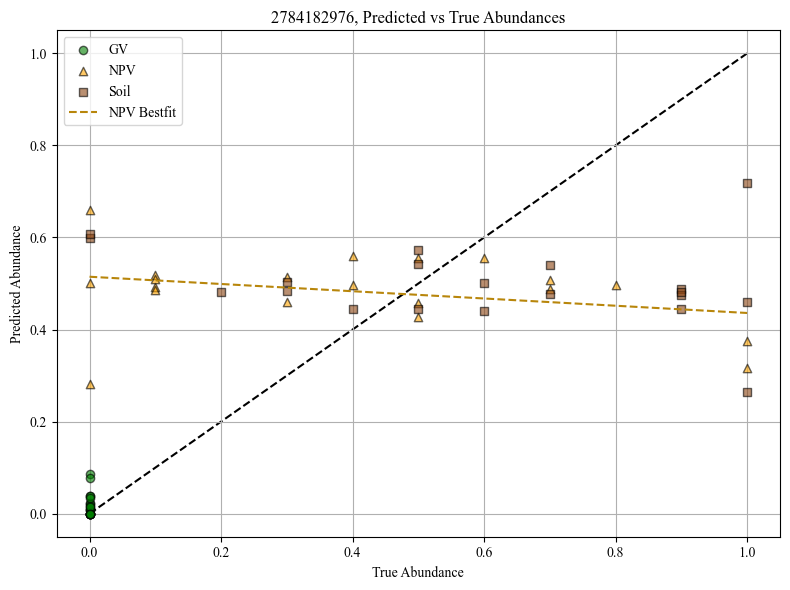

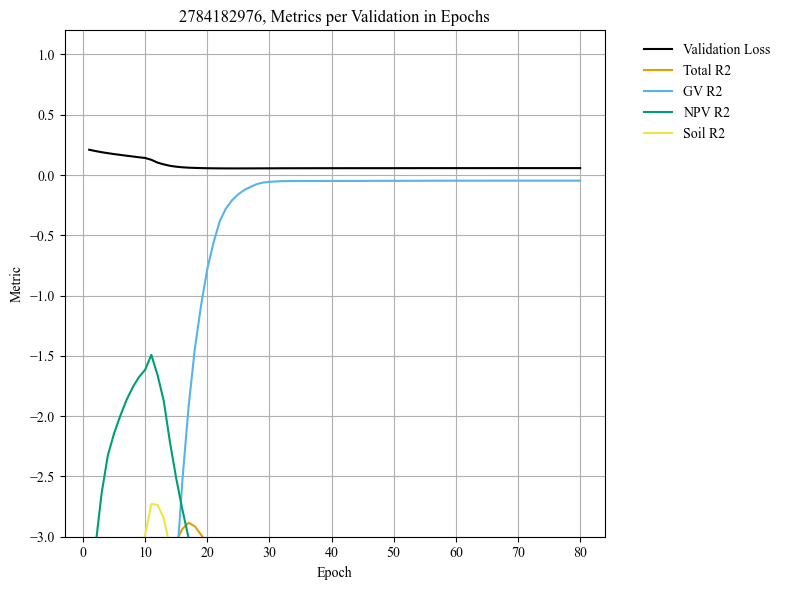

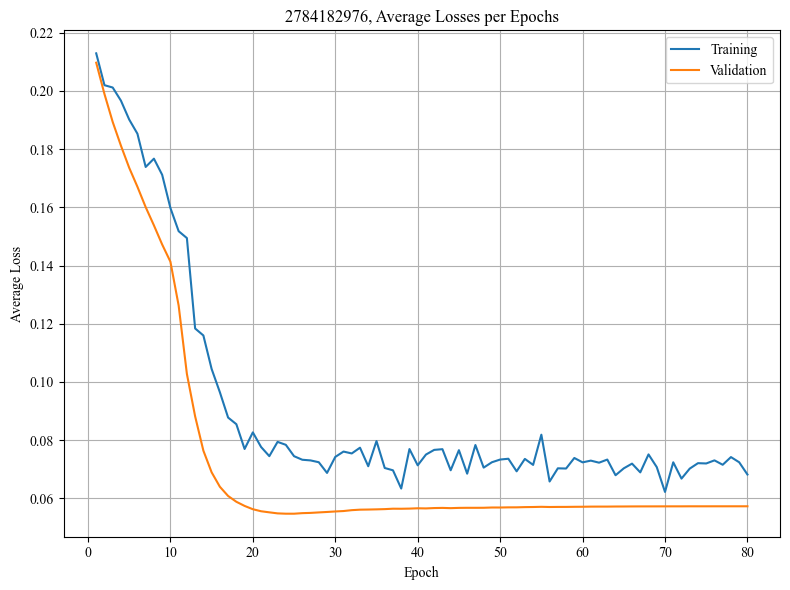

Testing complete
Initial fine tuning complete, with 100 batches
Epoch 1/80, Step 1/20, Train Loss: 0.173457
Epoch 1/80, Step 2/20, Train Loss: 0.243516
Epoch 1/80, Step 3/20, Train Loss: 0.256408
Epoch 1/80, Step 4/20, Train Loss: 0.214990
Epoch 1/80, Step 5/20, Train Loss: 0.227303
Epoch 1/80, Step 6/20, Train Loss: 0.236936
Epoch 1/80, Step 7/20, Train Loss: 0.292181
Epoch 1/80, Step 8/20, Train Loss: 0.249187
Epoch 1/80, Step 9/20, Train Loss: 0.138905
Epoch 1/80, Step 10/20, Train Loss: 0.190085
Epoch 1/80, Step 11/20, Train Loss: 0.331724
Epoch 1/80, Step 12/20, Train Loss: 0.133640
Epoch 1/80, Step 13/20, Train Loss: 0.247435
Epoch 1/80, Step 14/20, Train Loss: 0.284061
Epoch 1/80, Step 15/20, Train Loss: 0.354768
Epoch 1/80, Step 16/20, Train Loss: 0.246723
Epoch 1/80, Step 17/20, Train Loss: 0.212540
Epoch 1/80, Step 18/20, Train Loss: 0.184279
Epoch 1/80, Step 19/20, Train Loss: 0.175401
Epoch 1/80, Step 20/20, Train Loss: 0.196894
Epoch 1/80 complete. Train Loss: 0.229522, Va

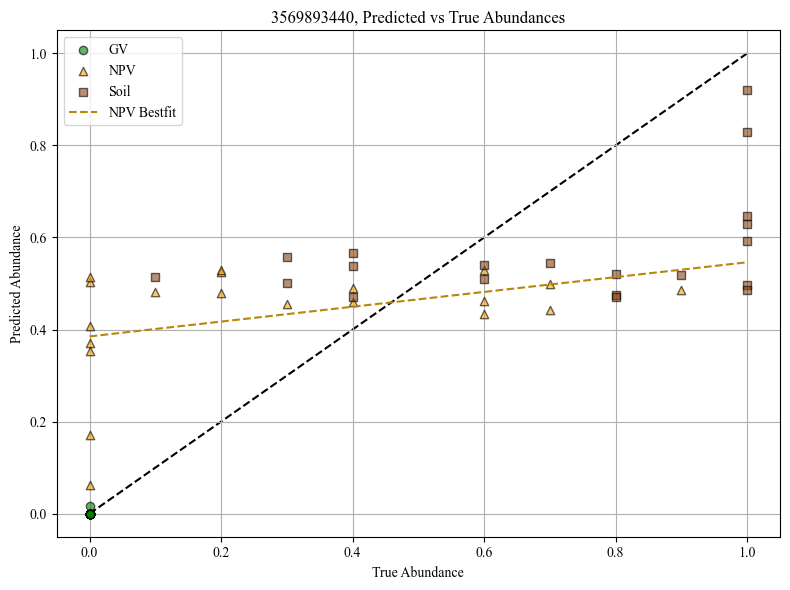

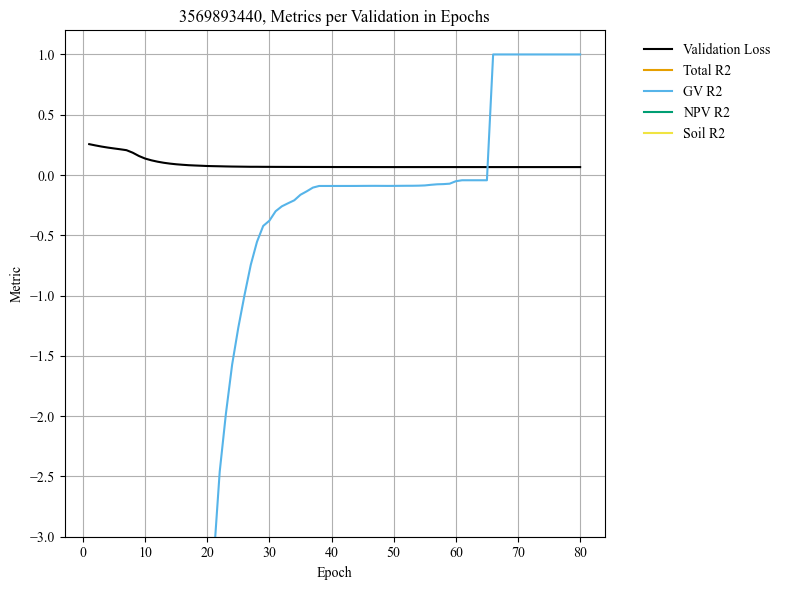

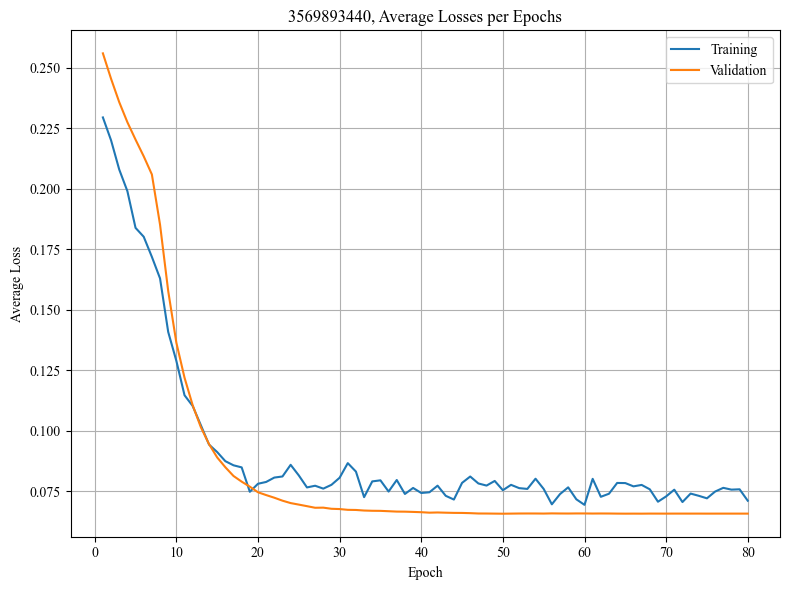

Testing complete
Initial fine tuning complete, with 100 batches
Epoch 1/80, Step 1/20, Train Loss: 0.224167
Epoch 1/80, Step 2/20, Train Loss: 0.141160
Epoch 1/80, Step 3/20, Train Loss: 0.241452
Epoch 1/80, Step 4/20, Train Loss: 0.147909
Epoch 1/80, Step 5/20, Train Loss: 0.320212
Epoch 1/80, Step 6/20, Train Loss: 0.234426
Epoch 1/80, Step 7/20, Train Loss: 0.291074
Epoch 1/80, Step 8/20, Train Loss: 0.167716
Epoch 1/80, Step 9/20, Train Loss: 0.132386
Epoch 1/80, Step 10/20, Train Loss: 0.186976
Epoch 1/80, Step 11/20, Train Loss: 0.119731
Epoch 1/80, Step 12/20, Train Loss: 0.114134
Epoch 1/80, Step 13/20, Train Loss: 0.288404
Epoch 1/80, Step 14/20, Train Loss: 0.367490
Epoch 1/80, Step 15/20, Train Loss: 0.231916
Epoch 1/80, Step 16/20, Train Loss: 0.258475
Epoch 1/80, Step 17/20, Train Loss: 0.212477
Epoch 1/80, Step 18/20, Train Loss: 0.264996
Epoch 1/80, Step 19/20, Train Loss: 0.203098
Epoch 1/80, Step 20/20, Train Loss: 0.281961
Epoch 1/80 complete. Train Loss: 0.221508, Va

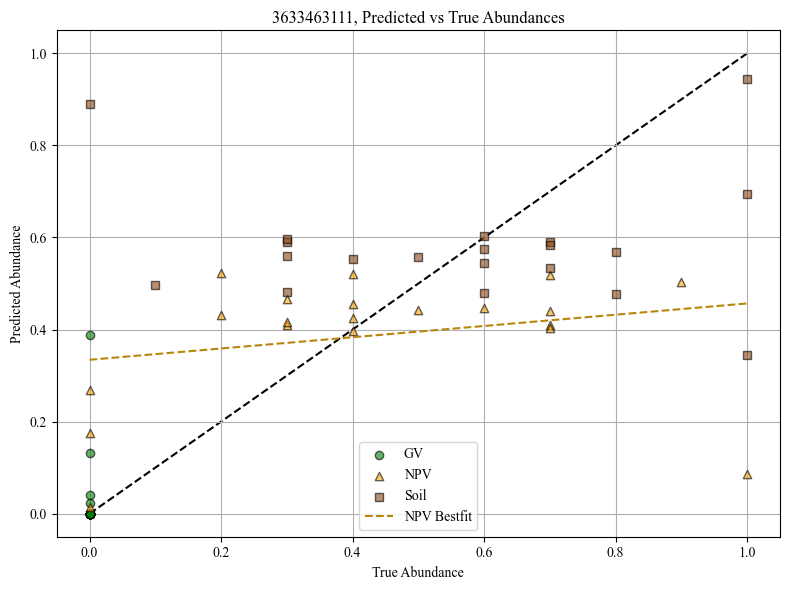

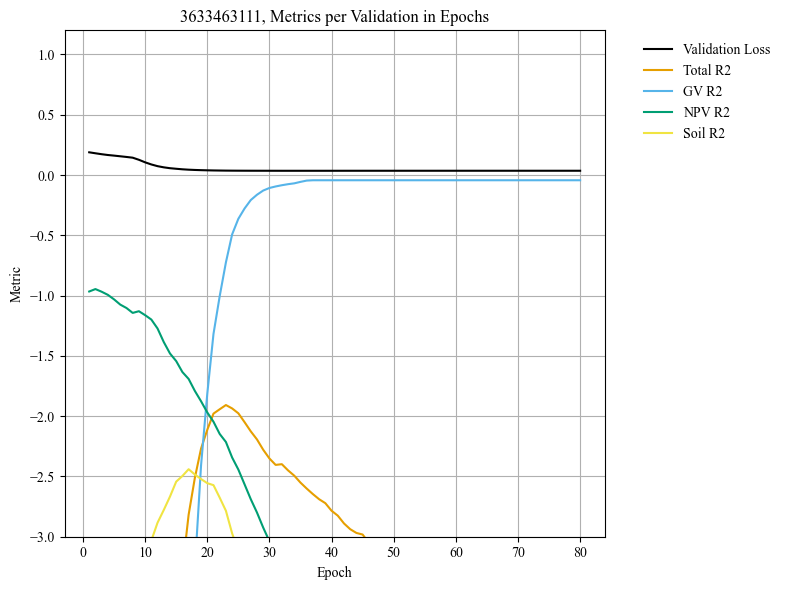

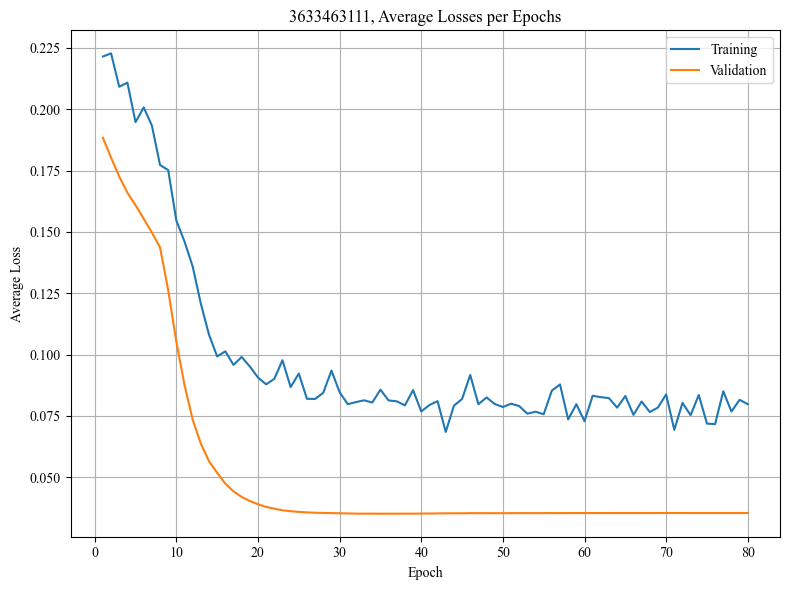

Testing complete
Initial fine tuning complete, with 100 batches
Epoch 1/80, Step 1/20, Train Loss: 0.184409
Epoch 1/80, Step 2/20, Train Loss: 0.201071
Epoch 1/80, Step 3/20, Train Loss: 0.160974
Epoch 1/80, Step 4/20, Train Loss: 0.165809
Epoch 1/80, Step 5/20, Train Loss: 0.205343
Epoch 1/80, Step 6/20, Train Loss: 0.305589
Epoch 1/80, Step 7/20, Train Loss: 0.101263
Epoch 1/80, Step 8/20, Train Loss: 0.192142
Epoch 1/80, Step 9/20, Train Loss: 0.245155
Epoch 1/80, Step 10/20, Train Loss: 0.291291
Epoch 1/80, Step 11/20, Train Loss: 0.215068
Epoch 1/80, Step 12/20, Train Loss: 0.154040
Epoch 1/80, Step 13/20, Train Loss: 0.179128
Epoch 1/80, Step 14/20, Train Loss: 0.174802
Epoch 1/80, Step 15/20, Train Loss: 0.191452
Epoch 1/80, Step 16/20, Train Loss: 0.236493
Epoch 1/80, Step 17/20, Train Loss: 0.360278
Epoch 1/80, Step 18/20, Train Loss: 0.208831
Epoch 1/80, Step 19/20, Train Loss: 0.294510
Epoch 1/80, Step 20/20, Train Loss: 0.289426
Epoch 1/80 complete. Train Loss: 0.217854, Va

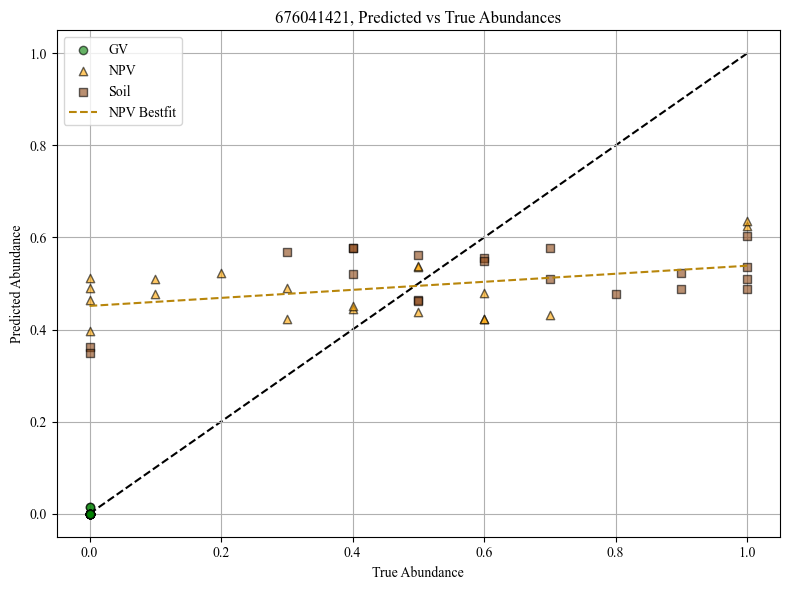

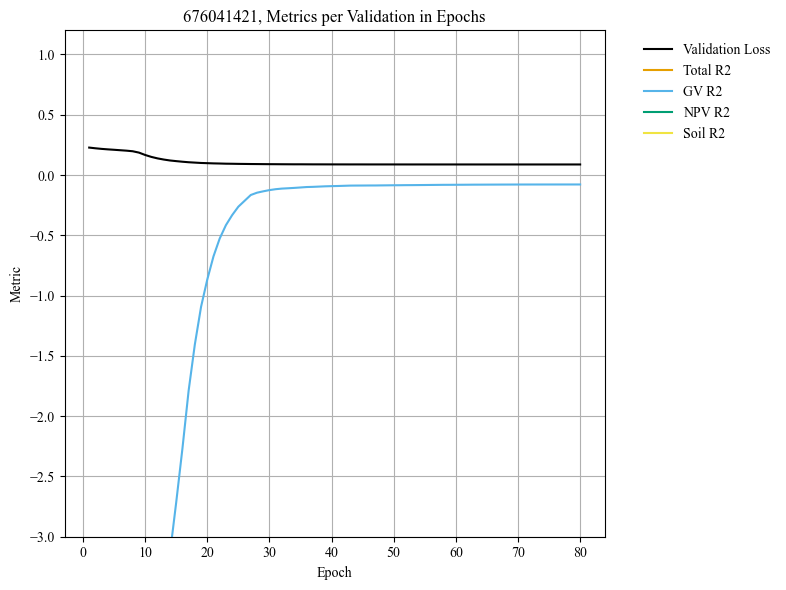

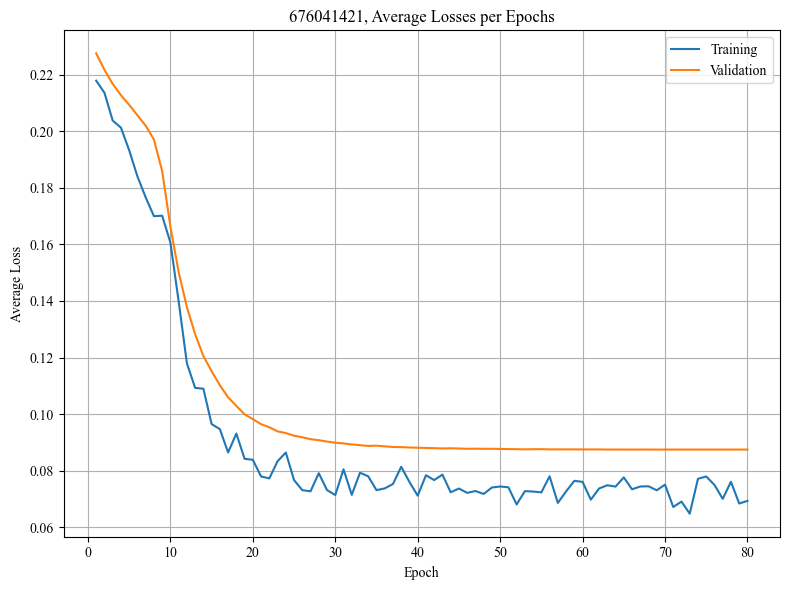

Testing complete
Initial fine tuning complete, with 100 batches
Epoch 1/80, Step 1/20, Train Loss: 0.224619
Epoch 1/80, Step 2/20, Train Loss: 0.197976
Epoch 1/80, Step 3/20, Train Loss: 0.298473
Epoch 1/80, Step 4/20, Train Loss: 0.224365
Epoch 1/80, Step 5/20, Train Loss: 0.271878
Epoch 1/80, Step 6/20, Train Loss: 0.237816
Epoch 1/80, Step 7/20, Train Loss: 0.257522
Epoch 1/80, Step 8/20, Train Loss: 0.195229
Epoch 1/80, Step 9/20, Train Loss: 0.282039
Epoch 1/80, Step 10/20, Train Loss: 0.260429
Epoch 1/80, Step 11/20, Train Loss: 0.253706
Epoch 1/80, Step 12/20, Train Loss: 0.214611
Epoch 1/80, Step 13/20, Train Loss: 0.220916
Epoch 1/80, Step 14/20, Train Loss: 0.292937
Epoch 1/80, Step 15/20, Train Loss: 0.319114
Epoch 1/80, Step 16/20, Train Loss: 0.184665
Epoch 1/80, Step 17/20, Train Loss: 0.225979
Epoch 1/80, Step 18/20, Train Loss: 0.210857
Epoch 1/80, Step 19/20, Train Loss: 0.303054
Epoch 1/80, Step 20/20, Train Loss: 0.178241
Epoch 1/80 complete. Train Loss: 0.242721, Va

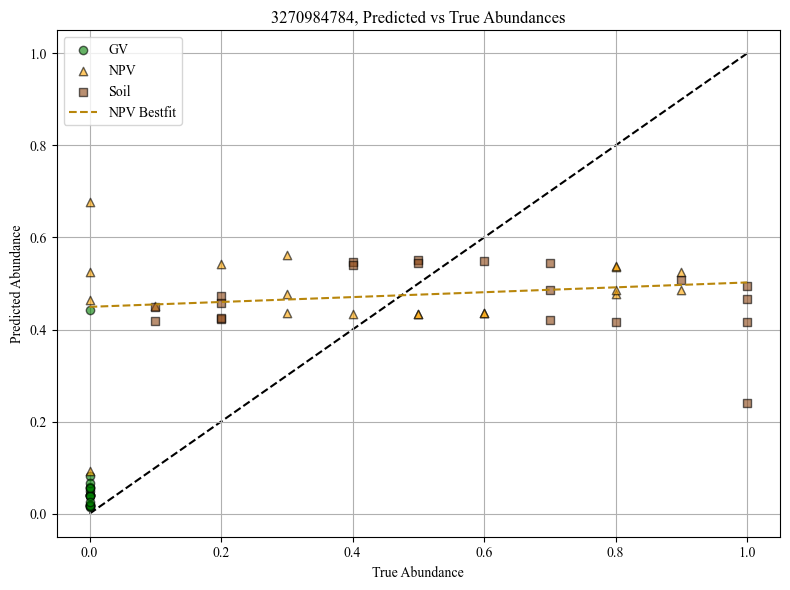

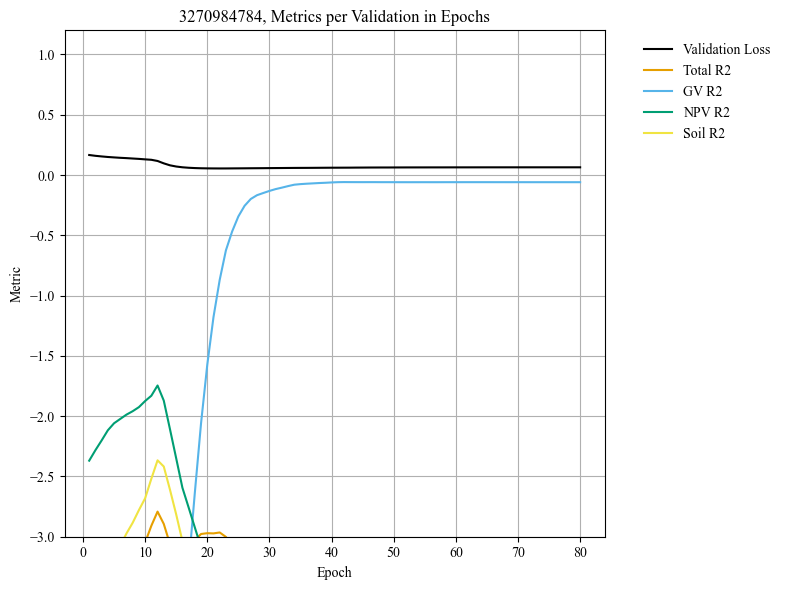

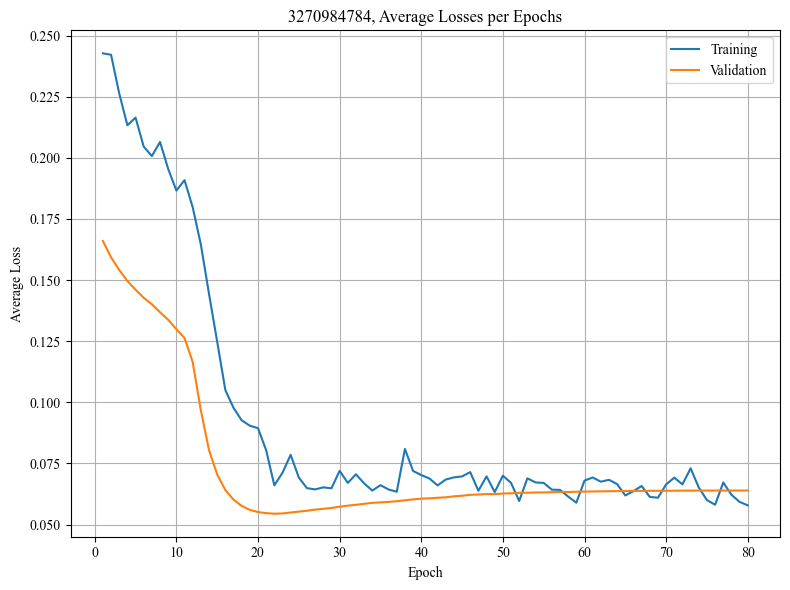

Testing complete
Initial fine tuning complete, with 100 batches
Epoch 1/80, Step 1/20, Train Loss: 0.295336
Epoch 1/80, Step 2/20, Train Loss: 0.274672
Epoch 1/80, Step 3/20, Train Loss: 0.284077
Epoch 1/80, Step 4/20, Train Loss: 0.211938
Epoch 1/80, Step 5/20, Train Loss: 0.144700
Epoch 1/80, Step 6/20, Train Loss: 0.205402
Epoch 1/80, Step 7/20, Train Loss: 0.222956
Epoch 1/80, Step 8/20, Train Loss: 0.223711
Epoch 1/80, Step 9/20, Train Loss: 0.155715
Epoch 1/80, Step 10/20, Train Loss: 0.295343
Epoch 1/80, Step 11/20, Train Loss: 0.210589
Epoch 1/80, Step 12/20, Train Loss: 0.331154
Epoch 1/80, Step 13/20, Train Loss: 0.162923
Epoch 1/80, Step 14/20, Train Loss: 0.255697
Epoch 1/80, Step 15/20, Train Loss: 0.191319
Epoch 1/80, Step 16/20, Train Loss: 0.172736
Epoch 1/80, Step 17/20, Train Loss: 0.225923
Epoch 1/80, Step 18/20, Train Loss: 0.250035
Epoch 1/80, Step 19/20, Train Loss: 0.312682
Epoch 1/80, Step 20/20, Train Loss: 0.250822
Epoch 1/80 complete. Train Loss: 0.233887, Va

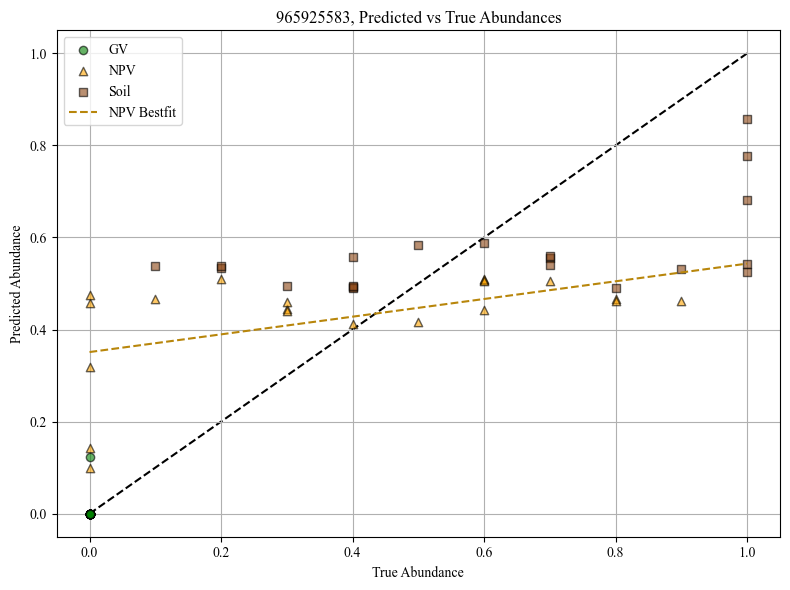

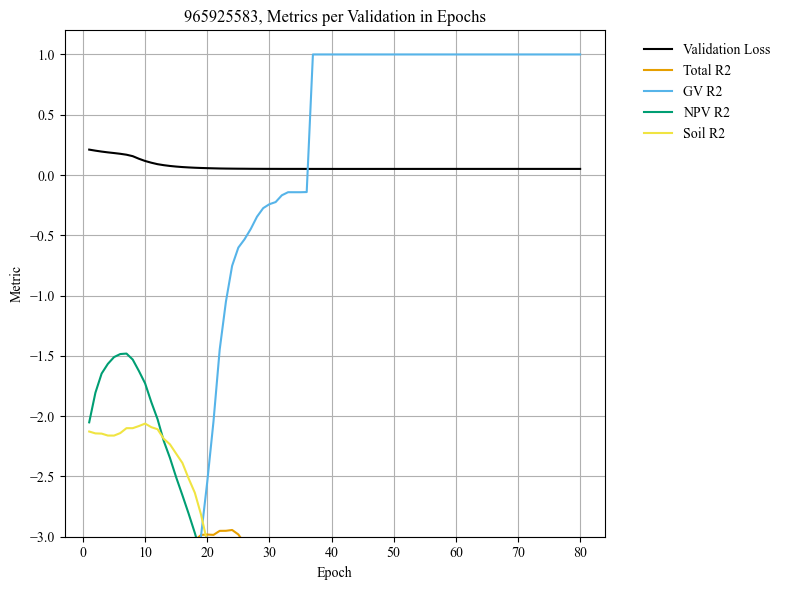

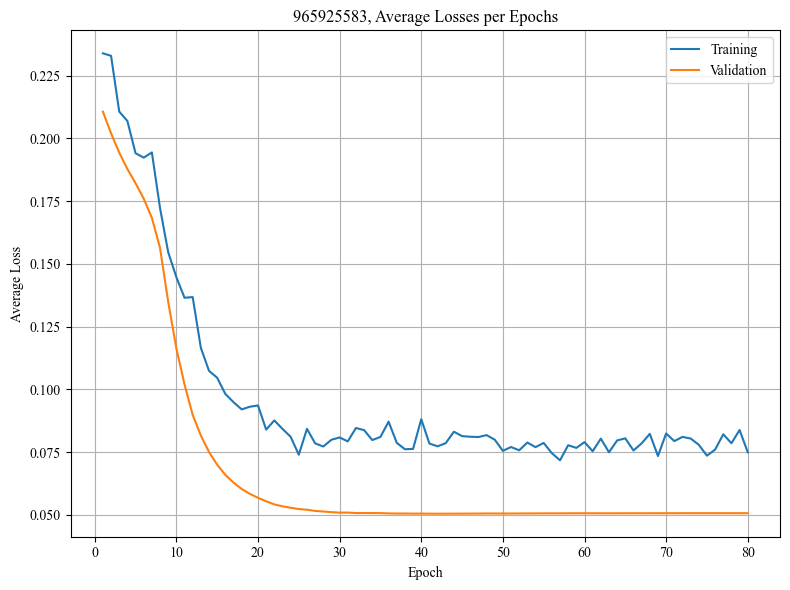

Testing complete
Initial fine tuning complete, with 100 batches
Epoch 1/80, Step 1/20, Train Loss: 0.198928
Epoch 1/80, Step 2/20, Train Loss: 0.186275
Epoch 1/80, Step 3/20, Train Loss: 0.269405
Epoch 1/80, Step 4/20, Train Loss: 0.181462
Epoch 1/80, Step 5/20, Train Loss: 0.212889
Epoch 1/80, Step 6/20, Train Loss: 0.229898
Epoch 1/80, Step 7/20, Train Loss: 0.265638
Epoch 1/80, Step 8/20, Train Loss: 0.193200
Epoch 1/80, Step 9/20, Train Loss: 0.210339
Epoch 1/80, Step 10/20, Train Loss: 0.104141
Epoch 1/80, Step 11/20, Train Loss: 0.279018
Epoch 1/80, Step 12/20, Train Loss: 0.268095
Epoch 1/80, Step 13/20, Train Loss: 0.199070
Epoch 1/80, Step 14/20, Train Loss: 0.323486
Epoch 1/80, Step 15/20, Train Loss: 0.205743
Epoch 1/80, Step 16/20, Train Loss: 0.238893
Epoch 1/80, Step 17/20, Train Loss: 0.197093
Epoch 1/80, Step 18/20, Train Loss: 0.199639
Epoch 1/80, Step 19/20, Train Loss: 0.203583
Epoch 1/80, Step 20/20, Train Loss: 0.233698
Epoch 1/80 complete. Train Loss: 0.220025, Va

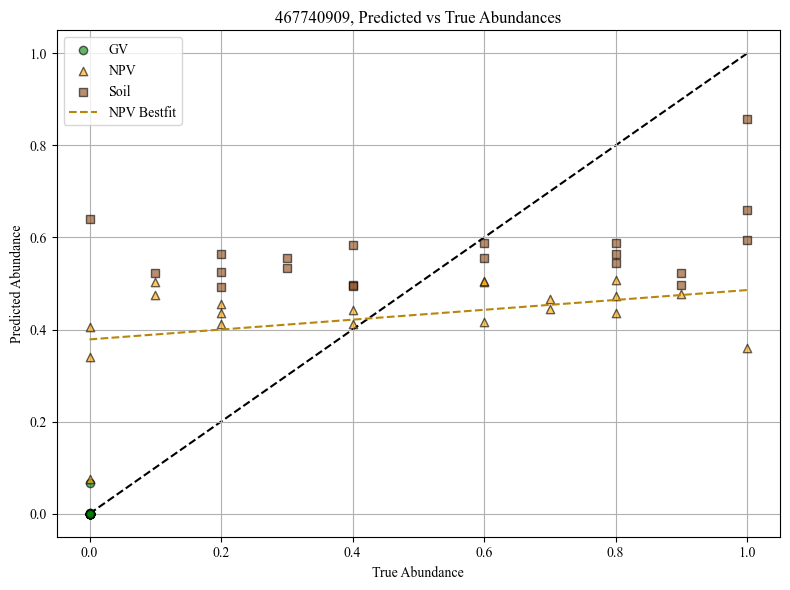

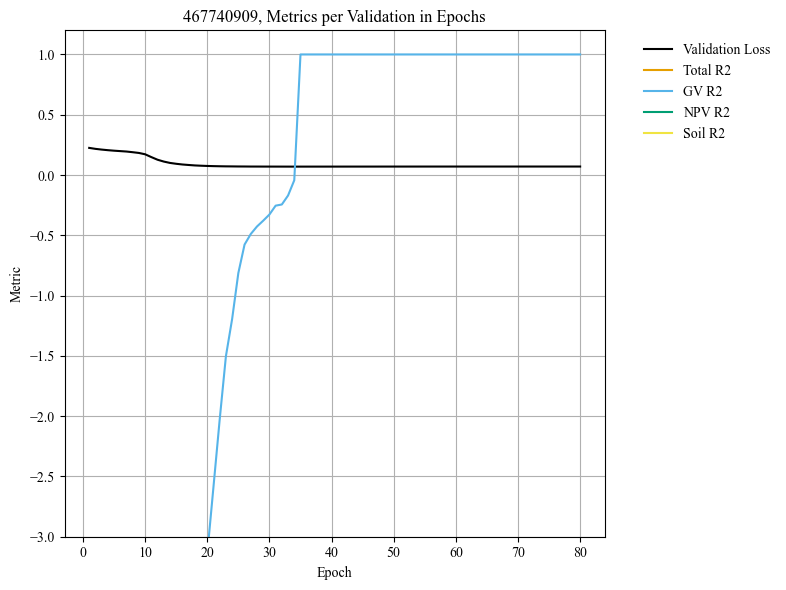

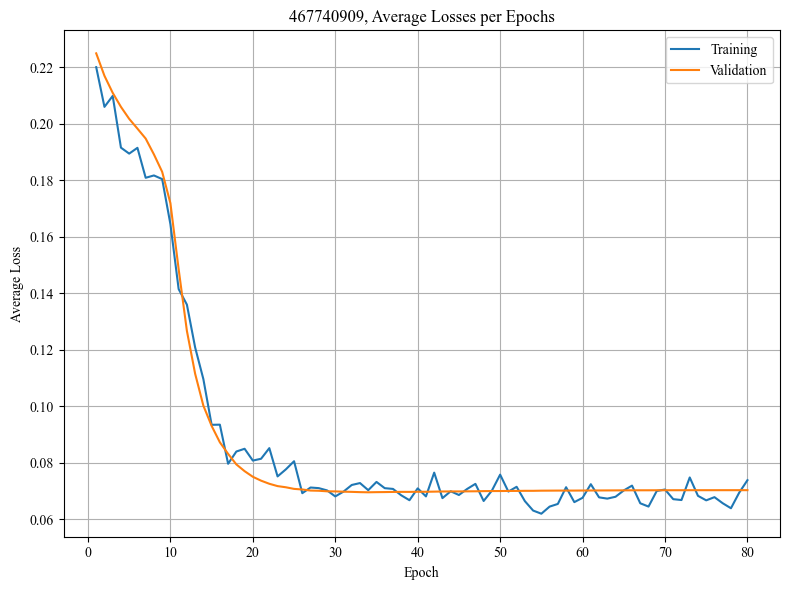

Testing complete
Initial fine tuning complete, with 100 batches
Epoch 1/80, Step 1/20, Train Loss: 0.216379
Epoch 1/80, Step 2/20, Train Loss: 0.241906
Epoch 1/80, Step 3/20, Train Loss: 0.208986
Epoch 1/80, Step 4/20, Train Loss: 0.253966
Epoch 1/80, Step 5/20, Train Loss: 0.292644
Epoch 1/80, Step 6/20, Train Loss: 0.253650
Epoch 1/80, Step 7/20, Train Loss: 0.356064
Epoch 1/80, Step 8/20, Train Loss: 0.190350
Epoch 1/80, Step 9/20, Train Loss: 0.247960
Epoch 1/80, Step 10/20, Train Loss: 0.195880
Epoch 1/80, Step 11/20, Train Loss: 0.204101
Epoch 1/80, Step 12/20, Train Loss: 0.270567
Epoch 1/80, Step 13/20, Train Loss: 0.285378
Epoch 1/80, Step 14/20, Train Loss: 0.187038
Epoch 1/80, Step 15/20, Train Loss: 0.237450
Epoch 1/80, Step 16/20, Train Loss: 0.229115
Epoch 1/80, Step 17/20, Train Loss: 0.356149
Epoch 1/80, Step 18/20, Train Loss: 0.317301
Epoch 1/80, Step 19/20, Train Loss: 0.197341
Epoch 1/80, Step 20/20, Train Loss: 0.146947
Epoch 1/80 complete. Train Loss: 0.244459, Va

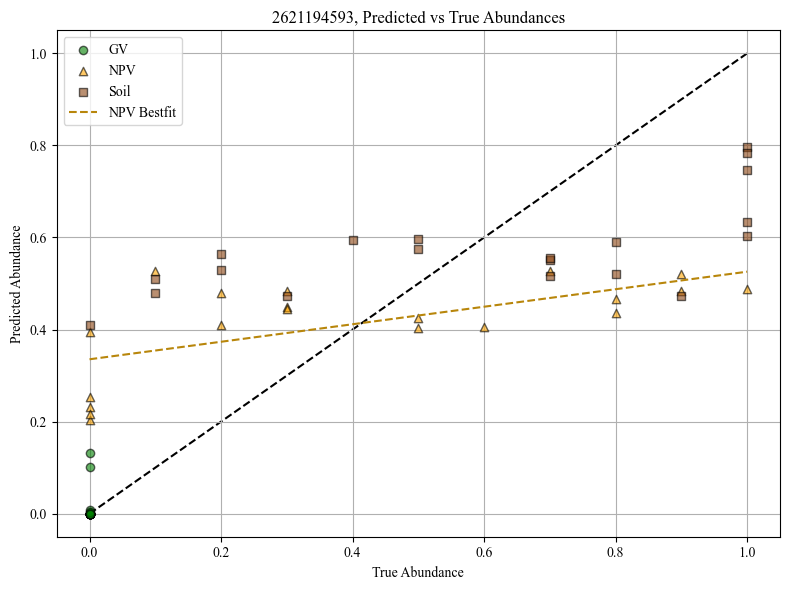

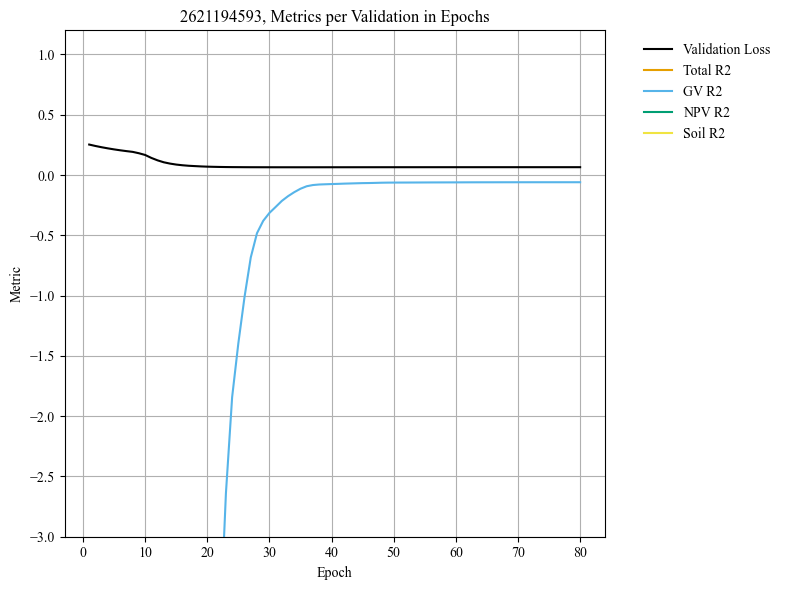

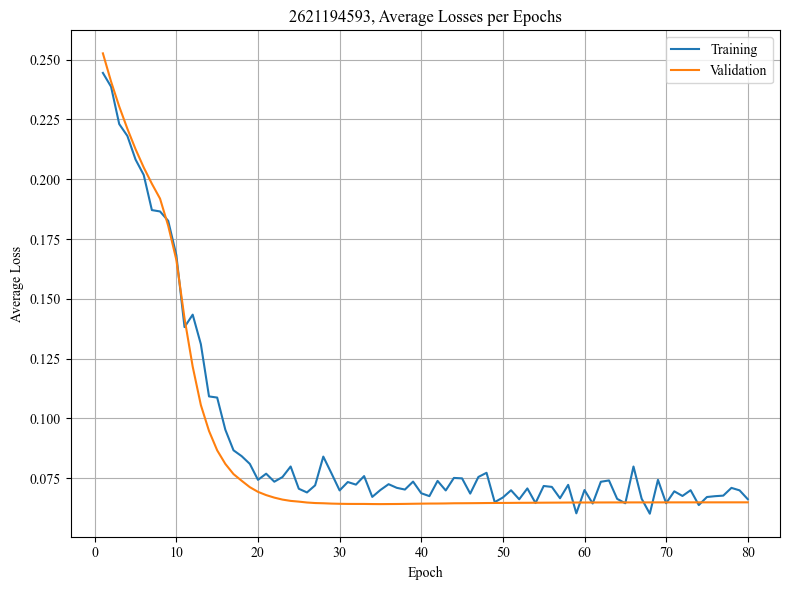

Testing complete
Initial fine tuning complete, with 100 batches
Epoch 1/80, Step 1/20, Train Loss: 0.209668
Epoch 1/80, Step 2/20, Train Loss: 0.195186
Epoch 1/80, Step 3/20, Train Loss: 0.256188
Epoch 1/80, Step 4/20, Train Loss: 0.188494
Epoch 1/80, Step 5/20, Train Loss: 0.394101
Epoch 1/80, Step 6/20, Train Loss: 0.149575
Epoch 1/80, Step 7/20, Train Loss: 0.201931
Epoch 1/80, Step 8/20, Train Loss: 0.169679
Epoch 1/80, Step 9/20, Train Loss: 0.274383
Epoch 1/80, Step 10/20, Train Loss: 0.254520
Epoch 1/80, Step 11/20, Train Loss: 0.236666
Epoch 1/80, Step 12/20, Train Loss: 0.261455
Epoch 1/80, Step 13/20, Train Loss: 0.242043
Epoch 1/80, Step 14/20, Train Loss: 0.149252
Epoch 1/80, Step 15/20, Train Loss: 0.209293
Epoch 1/80, Step 16/20, Train Loss: 0.345685
Epoch 1/80, Step 17/20, Train Loss: 0.199939
Epoch 1/80, Step 18/20, Train Loss: 0.188089
Epoch 1/80, Step 19/20, Train Loss: 0.262219
Epoch 1/80, Step 20/20, Train Loss: 0.149799
Epoch 1/80 complete. Train Loss: 0.226908, Va

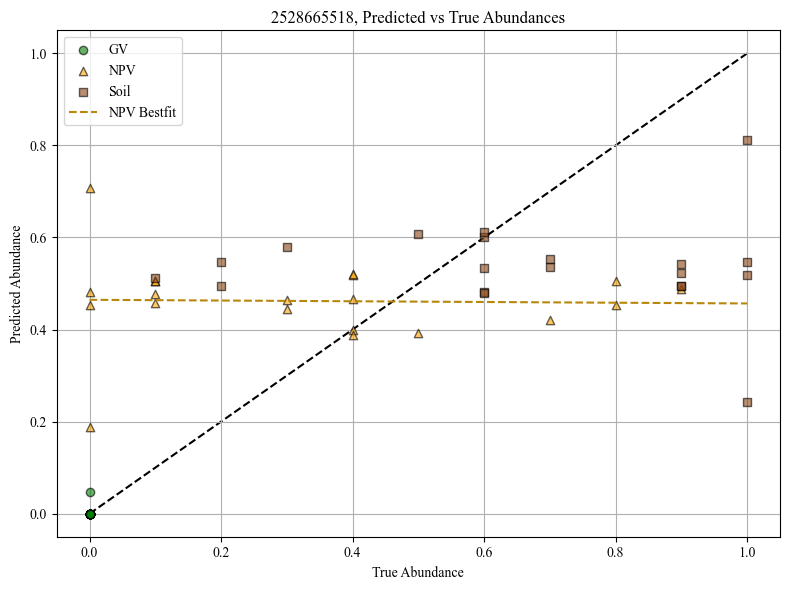

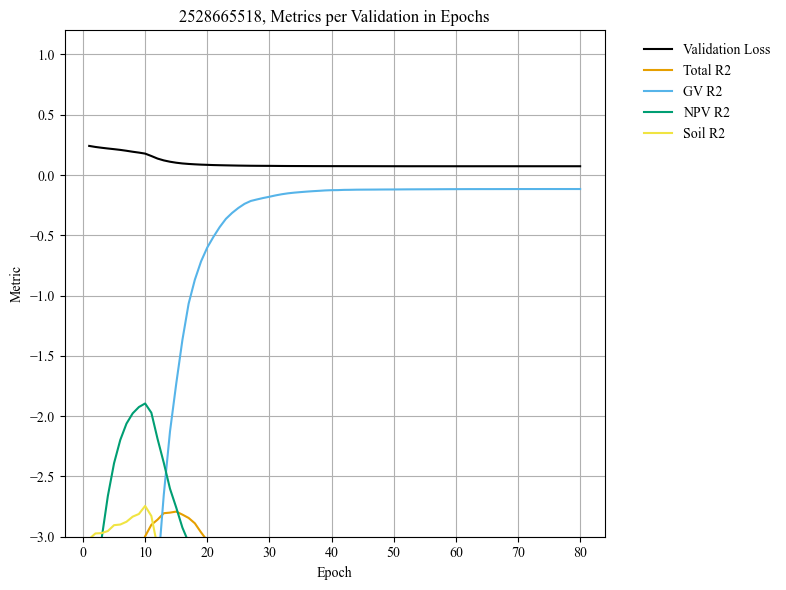

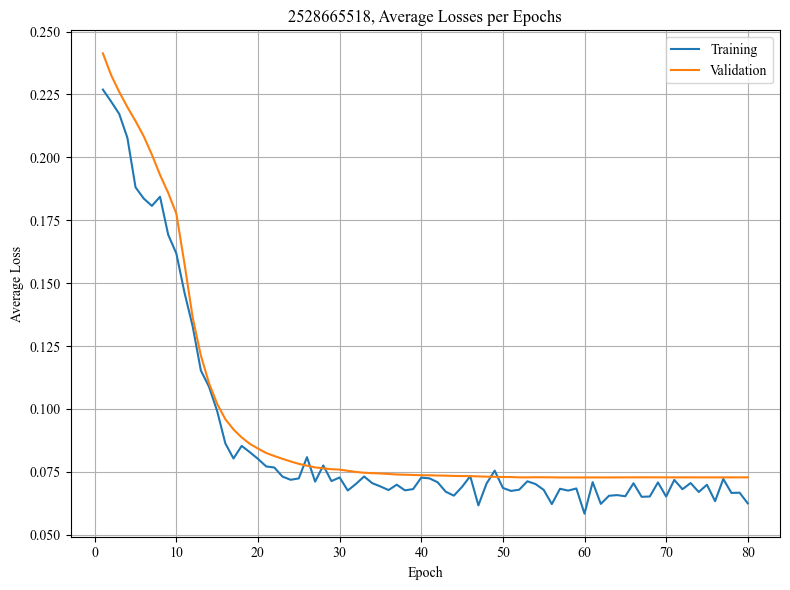

Testing complete
Initial fine tuning complete, with 100 batches
Epoch 1/80, Step 1/20, Train Loss: 0.212537
Epoch 1/80, Step 2/20, Train Loss: 0.287104
Epoch 1/80, Step 3/20, Train Loss: 0.203493
Epoch 1/80, Step 4/20, Train Loss: 0.327661
Epoch 1/80, Step 5/20, Train Loss: 0.278052
Epoch 1/80, Step 6/20, Train Loss: 0.213651
Epoch 1/80, Step 7/20, Train Loss: 0.181935
Epoch 1/80, Step 8/20, Train Loss: 0.355493
Epoch 1/80, Step 9/20, Train Loss: 0.168932
Epoch 1/80, Step 10/20, Train Loss: 0.296431
Epoch 1/80, Step 11/20, Train Loss: 0.232562
Epoch 1/80, Step 12/20, Train Loss: 0.273752
Epoch 1/80, Step 13/20, Train Loss: 0.190790
Epoch 1/80, Step 14/20, Train Loss: 0.245103
Epoch 1/80, Step 15/20, Train Loss: 0.177568
Epoch 1/80, Step 16/20, Train Loss: 0.250862
Epoch 1/80, Step 17/20, Train Loss: 0.416395
Epoch 1/80, Step 18/20, Train Loss: 0.288380
Epoch 1/80, Step 19/20, Train Loss: 0.224201
Epoch 1/80, Step 20/20, Train Loss: 0.207254
Epoch 1/80 complete. Train Loss: 0.251608, Va

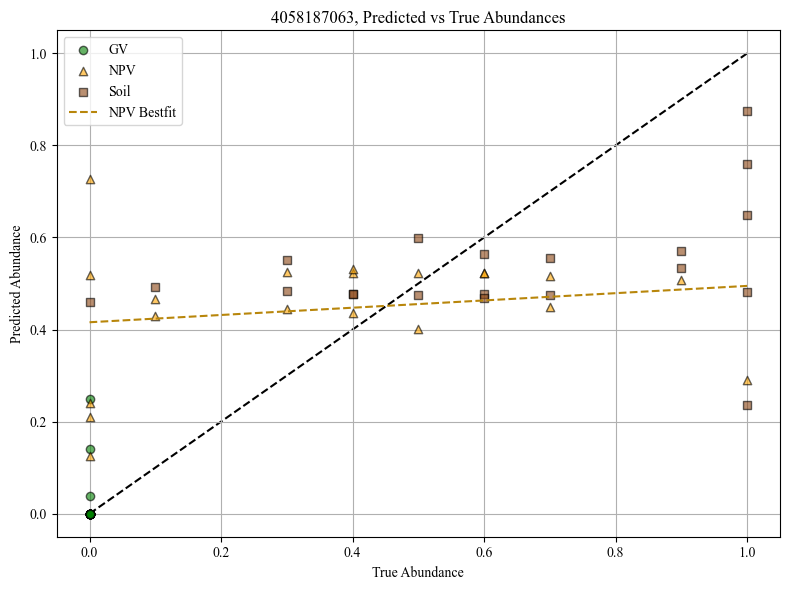

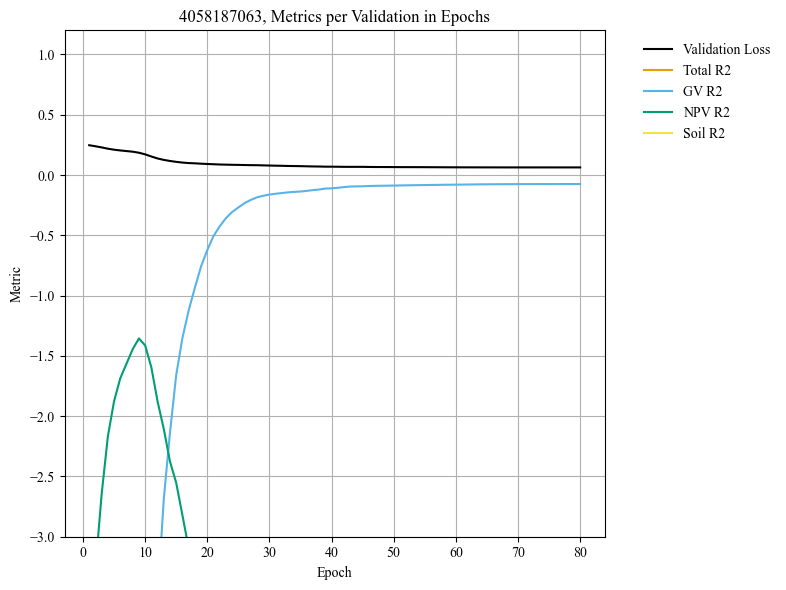

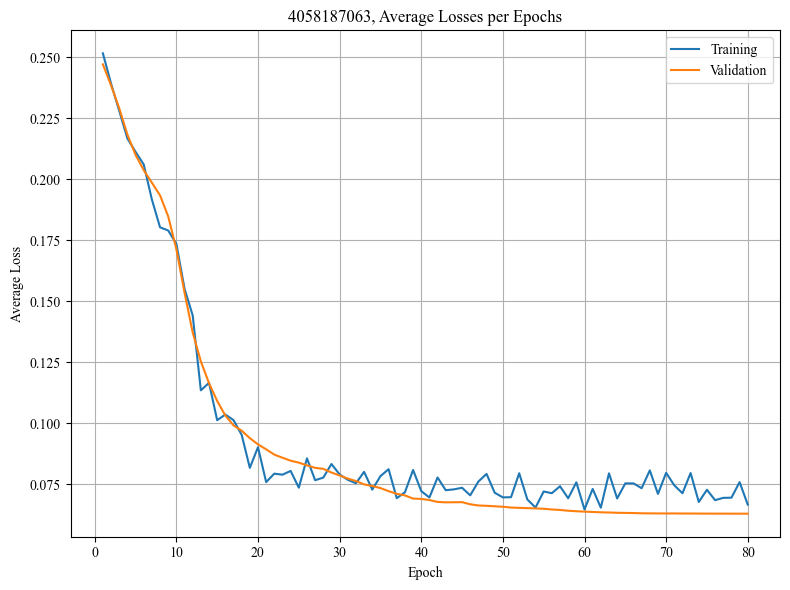

Testing complete
Initial fine tuning complete, with 100 batches
Epoch 1/80, Step 1/20, Train Loss: 0.193754
Epoch 1/80, Step 2/20, Train Loss: 0.165545
Epoch 1/80, Step 3/20, Train Loss: 0.216714
Epoch 1/80, Step 4/20, Train Loss: 0.241584
Epoch 1/80, Step 5/20, Train Loss: 0.263529
Epoch 1/80, Step 6/20, Train Loss: 0.265374
Epoch 1/80, Step 7/20, Train Loss: 0.224200
Epoch 1/80, Step 8/20, Train Loss: 0.236138
Epoch 1/80, Step 9/20, Train Loss: 0.142956
Epoch 1/80, Step 10/20, Train Loss: 0.337622
Epoch 1/80, Step 11/20, Train Loss: 0.105312
Epoch 1/80, Step 12/20, Train Loss: 0.279904
Epoch 1/80, Step 13/20, Train Loss: 0.210132
Epoch 1/80, Step 14/20, Train Loss: 0.231704
Epoch 1/80, Step 15/20, Train Loss: 0.261219
Epoch 1/80, Step 16/20, Train Loss: 0.237998
Epoch 1/80, Step 17/20, Train Loss: 0.276581
Epoch 1/80, Step 18/20, Train Loss: 0.233195
Epoch 1/80, Step 19/20, Train Loss: 0.231411
Epoch 1/80, Step 20/20, Train Loss: 0.226508
Epoch 1/80 complete. Train Loss: 0.229069, Va

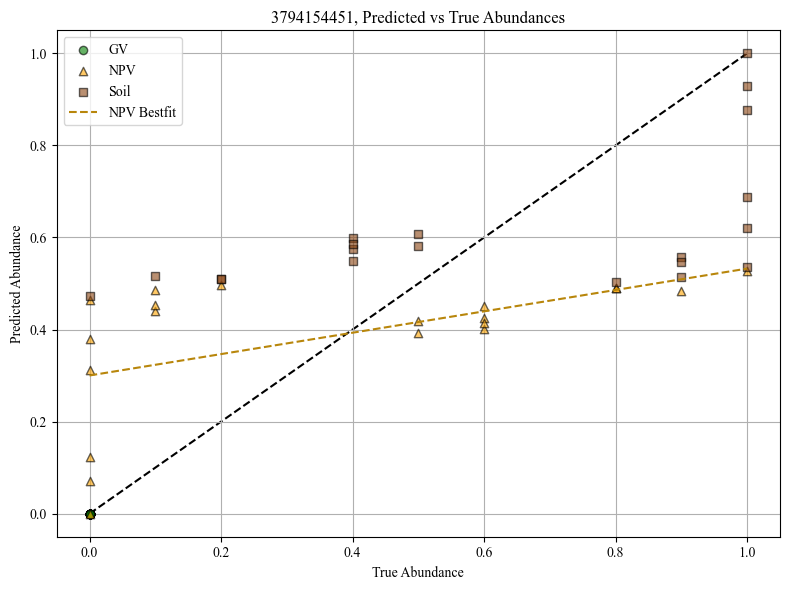

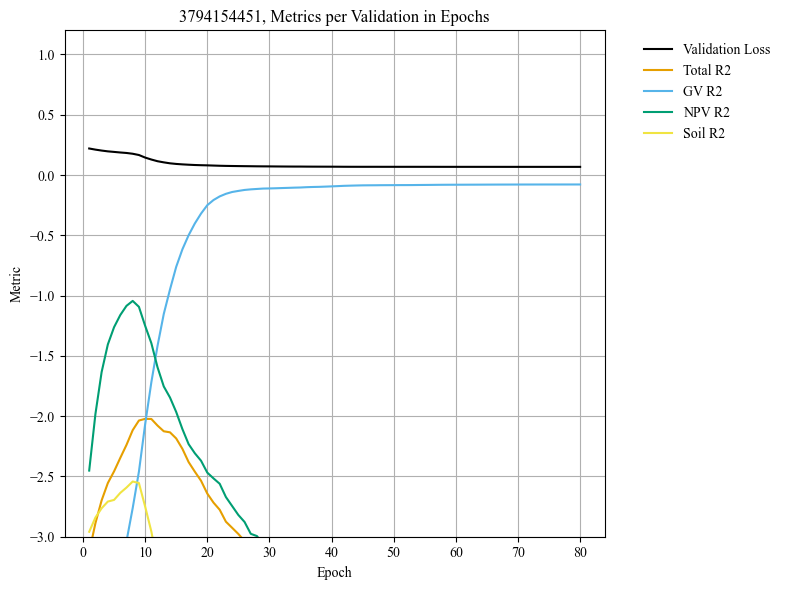

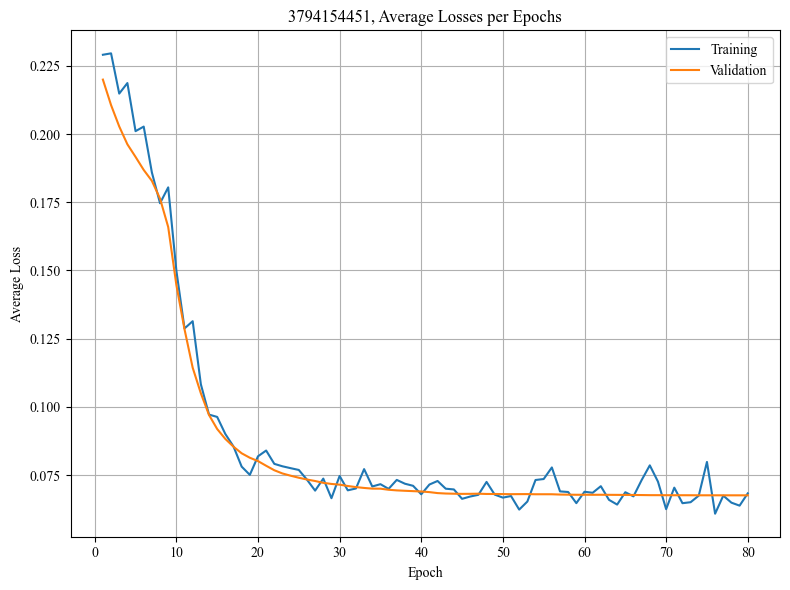

Testing complete
Initial fine tuning complete, with 100 batches
Epoch 1/80, Step 1/20, Train Loss: 0.217830
Epoch 1/80, Step 2/20, Train Loss: 0.248710
Epoch 1/80, Step 3/20, Train Loss: 0.296366
Epoch 1/80, Step 4/20, Train Loss: 0.200294
Epoch 1/80, Step 5/20, Train Loss: 0.189205
Epoch 1/80, Step 6/20, Train Loss: 0.186221
Epoch 1/80, Step 7/20, Train Loss: 0.204991
Epoch 1/80, Step 8/20, Train Loss: 0.297478
Epoch 1/80, Step 9/20, Train Loss: 0.277171
Epoch 1/80, Step 10/20, Train Loss: 0.221000
Epoch 1/80, Step 11/20, Train Loss: 0.294598
Epoch 1/80, Step 12/20, Train Loss: 0.249477
Epoch 1/80, Step 13/20, Train Loss: 0.163921
Epoch 1/80, Step 14/20, Train Loss: 0.269671
Epoch 1/80, Step 15/20, Train Loss: 0.296451
Epoch 1/80, Step 16/20, Train Loss: 0.242395
Epoch 1/80, Step 17/20, Train Loss: 0.226915
Epoch 1/80, Step 18/20, Train Loss: 0.213434
Epoch 1/80, Step 19/20, Train Loss: 0.154457
Epoch 1/80, Step 20/20, Train Loss: 0.258408
Epoch 1/80 complete. Train Loss: 0.235450, Va

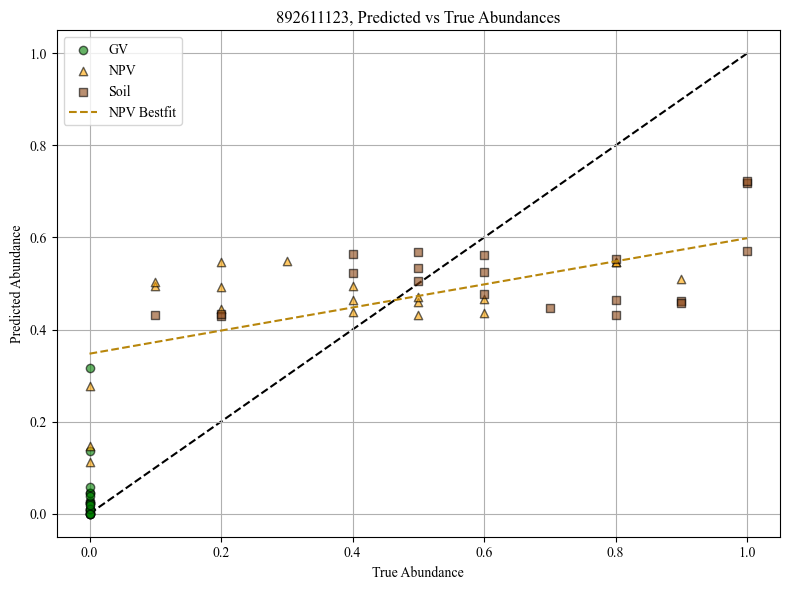

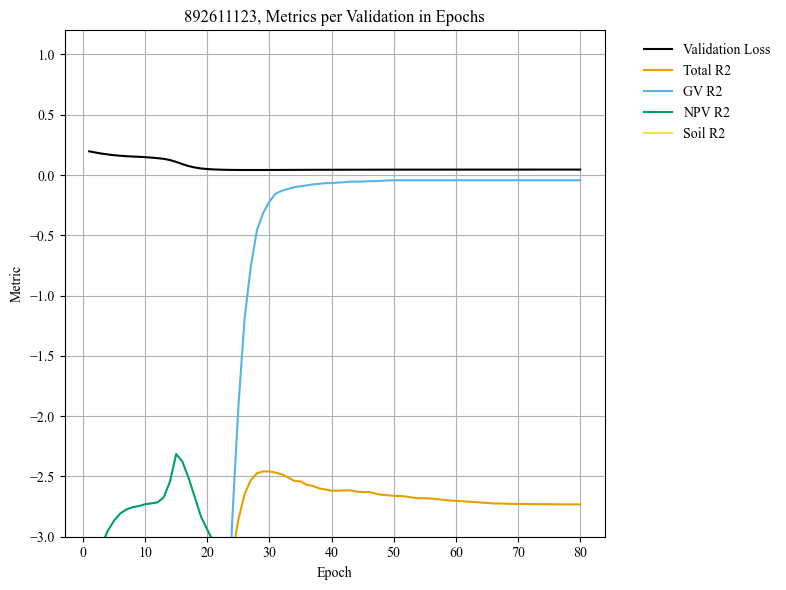

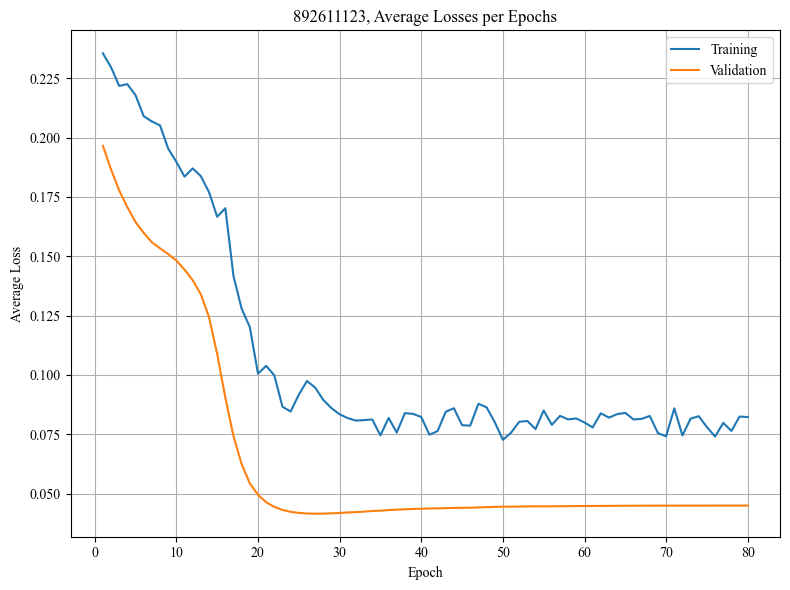

Testing complete
Initial fine tuning complete, with 100 batches
Epoch 1/80, Step 1/20, Train Loss: 0.280036
Epoch 1/80, Step 2/20, Train Loss: 0.239310
Epoch 1/80, Step 3/20, Train Loss: 0.238410
Epoch 1/80, Step 4/20, Train Loss: 0.320153
Epoch 1/80, Step 5/20, Train Loss: 0.284348
Epoch 1/80, Step 6/20, Train Loss: 0.214226
Epoch 1/80, Step 7/20, Train Loss: 0.281511
Epoch 1/80, Step 8/20, Train Loss: 0.347655
Epoch 1/80, Step 9/20, Train Loss: 0.186685
Epoch 1/80, Step 10/20, Train Loss: 0.264835
Epoch 1/80, Step 11/20, Train Loss: 0.316955
Epoch 1/80, Step 12/20, Train Loss: 0.217900
Epoch 1/80, Step 13/20, Train Loss: 0.262210
Epoch 1/80, Step 14/20, Train Loss: 0.372472
Epoch 1/80, Step 15/20, Train Loss: 0.194546
Epoch 1/80, Step 16/20, Train Loss: 0.119474
Epoch 1/80, Step 17/20, Train Loss: 0.206596
Epoch 1/80, Step 18/20, Train Loss: 0.165147
Epoch 1/80, Step 19/20, Train Loss: 0.272170
Epoch 1/80, Step 20/20, Train Loss: 0.267150
Epoch 1/80 complete. Train Loss: 0.252589, Va

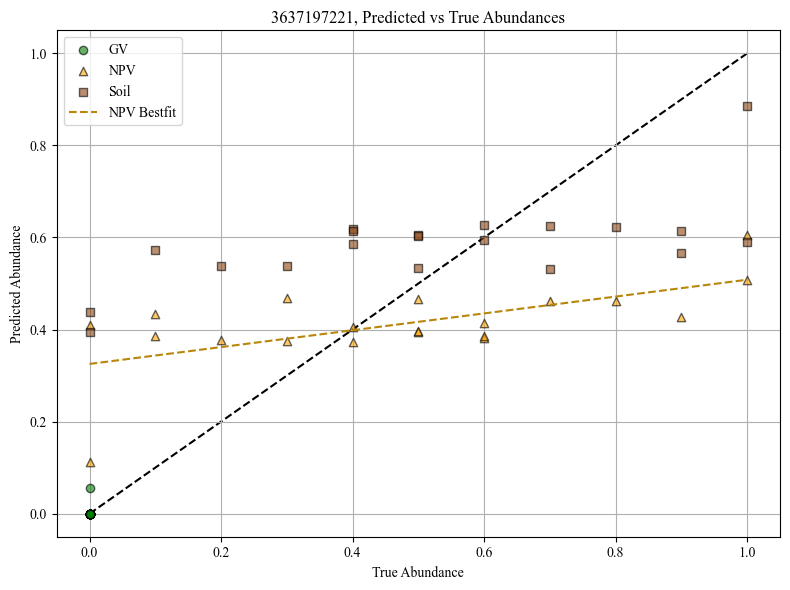

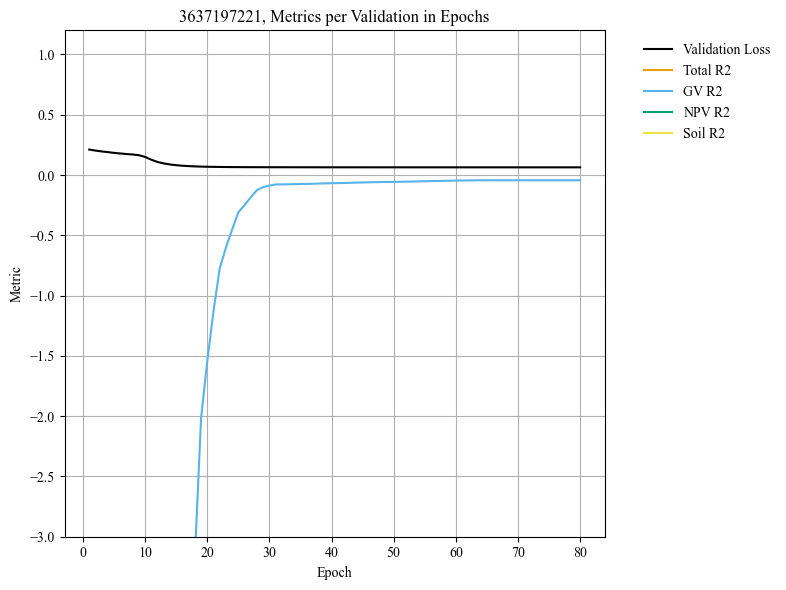

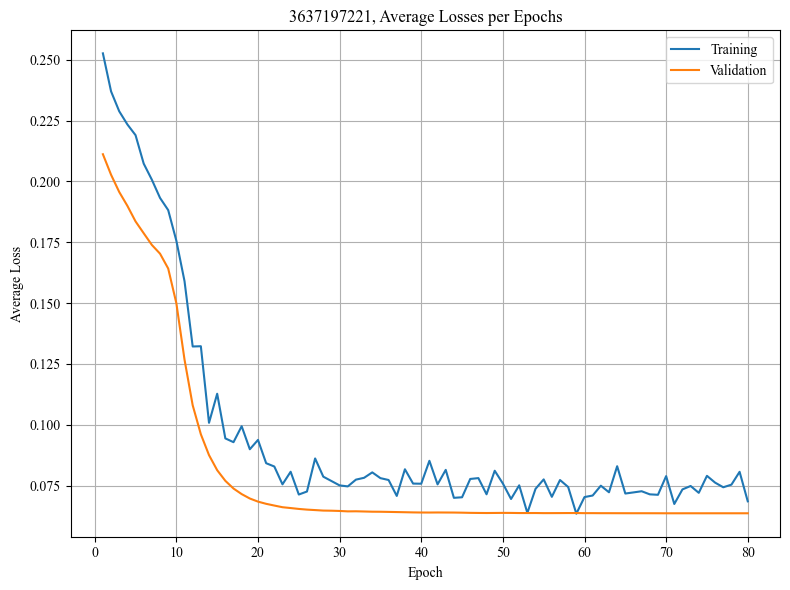

Testing complete
Initial fine tuning complete, with 100 batches
Epoch 1/80, Step 1/20, Train Loss: 0.252167
Epoch 1/80, Step 2/20, Train Loss: 0.225342
Epoch 1/80, Step 3/20, Train Loss: 0.340555
Epoch 1/80, Step 4/20, Train Loss: 0.232411
Epoch 1/80, Step 5/20, Train Loss: 0.259301
Epoch 1/80, Step 6/20, Train Loss: 0.253881
Epoch 1/80, Step 7/20, Train Loss: 0.276922
Epoch 1/80, Step 8/20, Train Loss: 0.280656
Epoch 1/80, Step 9/20, Train Loss: 0.191196
Epoch 1/80, Step 10/20, Train Loss: 0.265861
Epoch 1/80, Step 11/20, Train Loss: 0.178979
Epoch 1/80, Step 12/20, Train Loss: 0.289308
Epoch 1/80, Step 13/20, Train Loss: 0.220947
Epoch 1/80, Step 14/20, Train Loss: 0.198167
Epoch 1/80, Step 15/20, Train Loss: 0.204200
Epoch 1/80, Step 16/20, Train Loss: 0.328850
Epoch 1/80, Step 17/20, Train Loss: 0.224735
Epoch 1/80, Step 18/20, Train Loss: 0.349876
Epoch 1/80, Step 19/20, Train Loss: 0.251482
Epoch 1/80, Step 20/20, Train Loss: 0.216011
Epoch 1/80 complete. Train Loss: 0.252042, Va

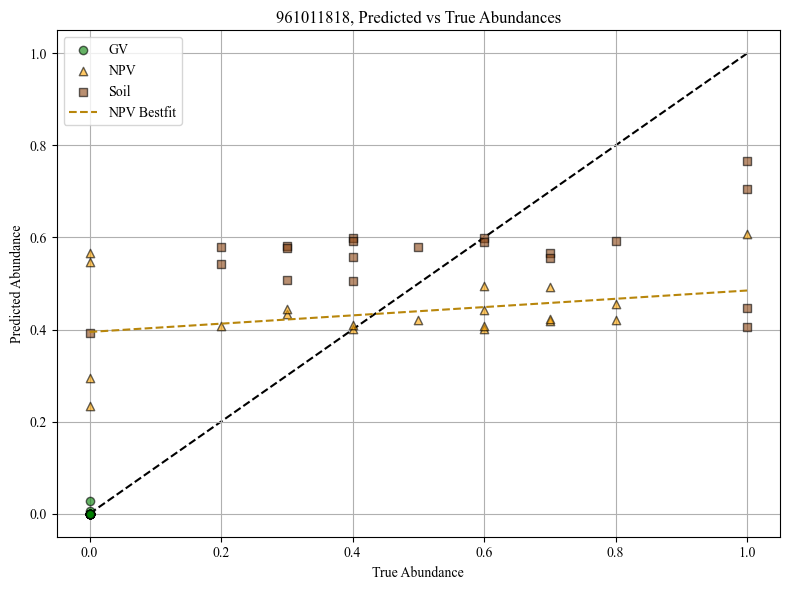

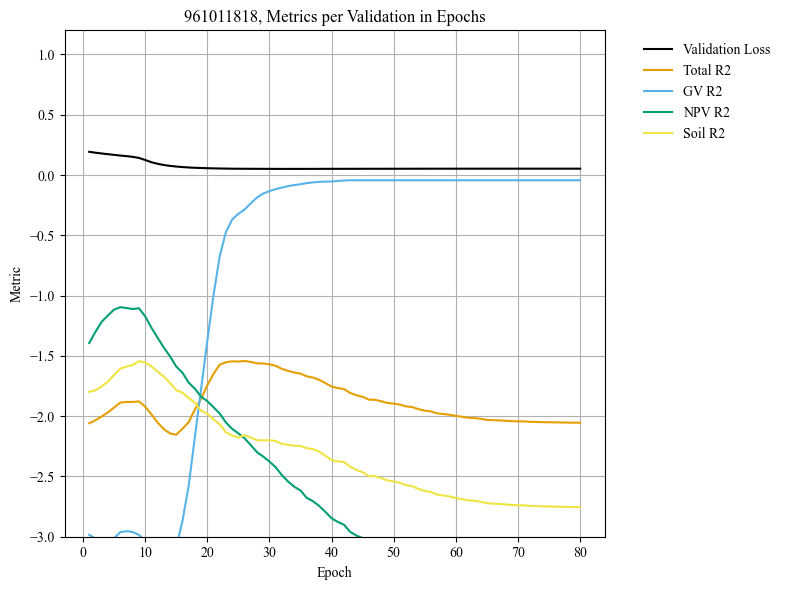

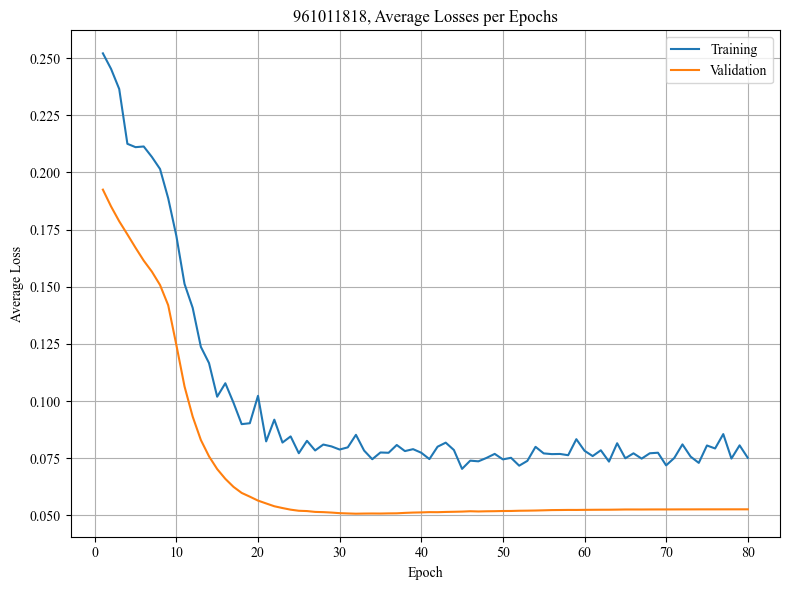

Testing complete
Initial fine tuning complete, with 100 batches
Epoch 1/80, Step 1/20, Train Loss: 0.176363
Epoch 1/80, Step 2/20, Train Loss: 0.190883
Epoch 1/80, Step 3/20, Train Loss: 0.191801
Epoch 1/80, Step 4/20, Train Loss: 0.217387
Epoch 1/80, Step 5/20, Train Loss: 0.288050
Epoch 1/80, Step 6/20, Train Loss: 0.194186
Epoch 1/80, Step 7/20, Train Loss: 0.205784
Epoch 1/80, Step 8/20, Train Loss: 0.108439
Epoch 1/80, Step 9/20, Train Loss: 0.283016
Epoch 1/80, Step 10/20, Train Loss: 0.298170
Epoch 1/80, Step 11/20, Train Loss: 0.155392
Epoch 1/80, Step 12/20, Train Loss: 0.208087
Epoch 1/80, Step 13/20, Train Loss: 0.224876
Epoch 1/80, Step 14/20, Train Loss: 0.159964
Epoch 1/80, Step 15/20, Train Loss: 0.220897
Epoch 1/80, Step 16/20, Train Loss: 0.201608
Epoch 1/80, Step 17/20, Train Loss: 0.193373
Epoch 1/80, Step 18/20, Train Loss: 0.251771
Epoch 1/80, Step 19/20, Train Loss: 0.302998
Epoch 1/80, Step 20/20, Train Loss: 0.161794
Epoch 1/80 complete. Train Loss: 0.211742, Va

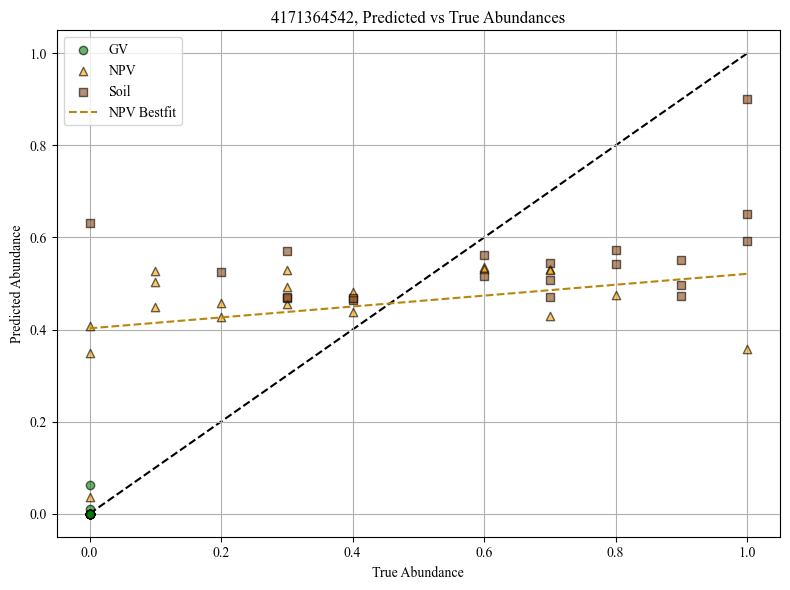

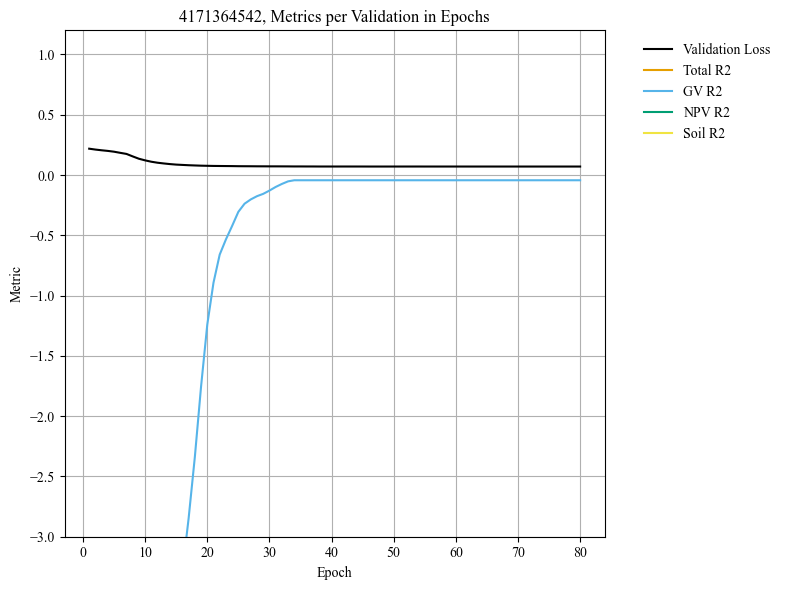

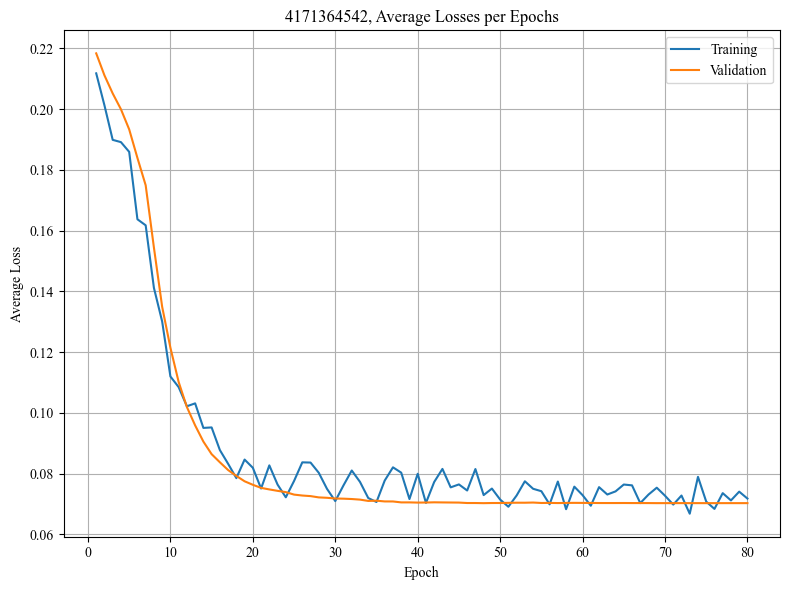

Testing complete
Initial fine tuning complete, with 100 batches
Epoch 1/80, Step 1/20, Train Loss: 0.234959
Epoch 1/80, Step 2/20, Train Loss: 0.283533
Epoch 1/80, Step 3/20, Train Loss: 0.178122
Epoch 1/80, Step 4/20, Train Loss: 0.253714
Epoch 1/80, Step 5/20, Train Loss: 0.270111
Epoch 1/80, Step 6/20, Train Loss: 0.172233
Epoch 1/80, Step 7/20, Train Loss: 0.195945
Epoch 1/80, Step 8/20, Train Loss: 0.168747
Epoch 1/80, Step 9/20, Train Loss: 0.191803
Epoch 1/80, Step 10/20, Train Loss: 0.212621
Epoch 1/80, Step 11/20, Train Loss: 0.272233
Epoch 1/80, Step 12/20, Train Loss: 0.186777
Epoch 1/80, Step 13/20, Train Loss: 0.266733
Epoch 1/80, Step 14/20, Train Loss: 0.339449
Epoch 1/80, Step 15/20, Train Loss: 0.367992
Epoch 1/80, Step 16/20, Train Loss: 0.267994
Epoch 1/80, Step 17/20, Train Loss: 0.213191
Epoch 1/80, Step 18/20, Train Loss: 0.267414
Epoch 1/80, Step 19/20, Train Loss: 0.150738
Epoch 1/80, Step 20/20, Train Loss: 0.268344
Epoch 1/80 complete. Train Loss: 0.238133, Va

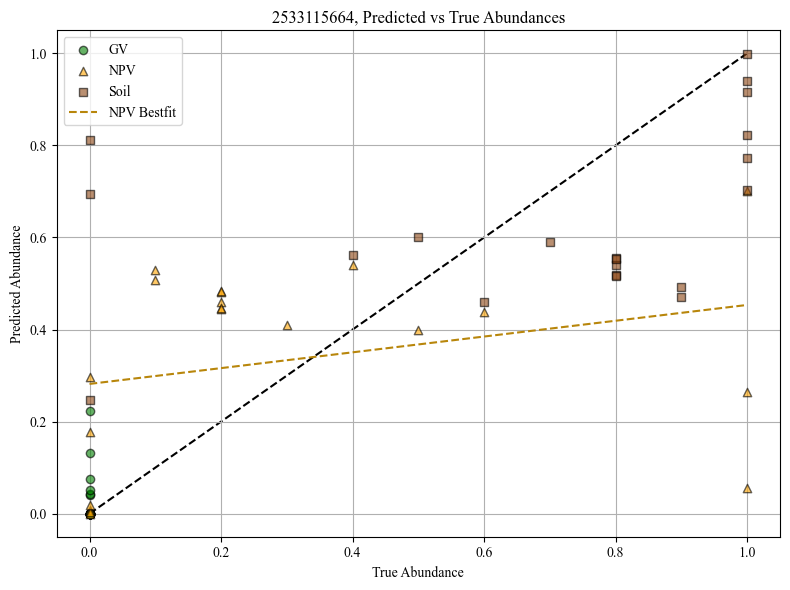

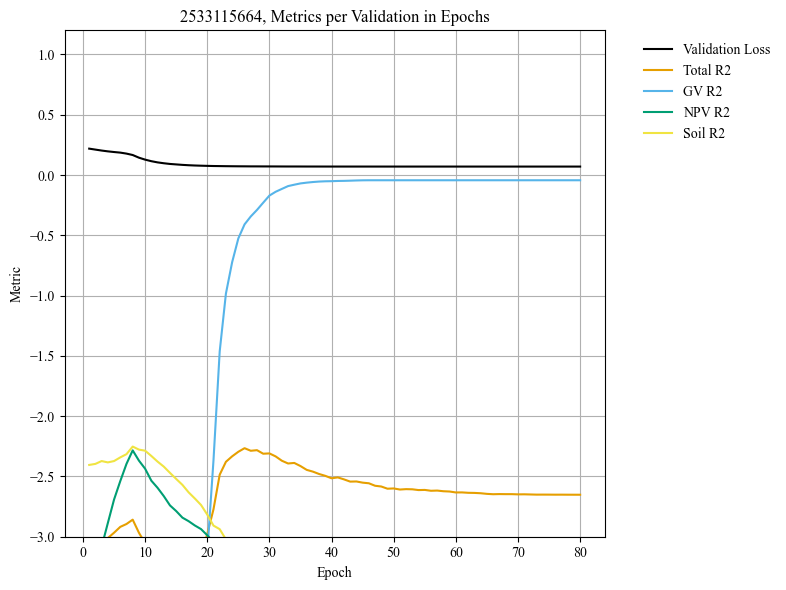

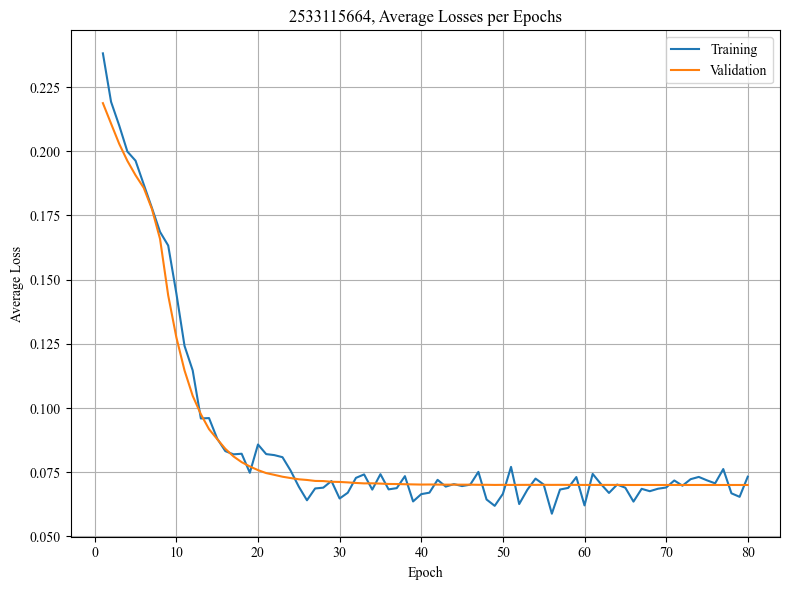

Testing complete
Initial fine tuning complete, with 100 batches
Epoch 1/80, Step 1/20, Train Loss: 0.250267
Epoch 1/80, Step 2/20, Train Loss: 0.204105
Epoch 1/80, Step 3/20, Train Loss: 0.256963
Epoch 1/80, Step 4/20, Train Loss: 0.230826
Epoch 1/80, Step 5/20, Train Loss: 0.322692
Epoch 1/80, Step 6/20, Train Loss: 0.279271
Epoch 1/80, Step 7/20, Train Loss: 0.204911
Epoch 1/80, Step 8/20, Train Loss: 0.364110
Epoch 1/80, Step 9/20, Train Loss: 0.270578
Epoch 1/80, Step 10/20, Train Loss: 0.275837
Epoch 1/80, Step 11/20, Train Loss: 0.196358
Epoch 1/80, Step 12/20, Train Loss: 0.202308
Epoch 1/80, Step 13/20, Train Loss: 0.157747
Epoch 1/80, Step 14/20, Train Loss: 0.288837
Epoch 1/80, Step 15/20, Train Loss: 0.148018
Epoch 1/80, Step 16/20, Train Loss: 0.202395
Epoch 1/80, Step 17/20, Train Loss: 0.302427
Epoch 1/80, Step 18/20, Train Loss: 0.243401
Epoch 1/80, Step 19/20, Train Loss: 0.122665
Epoch 1/80, Step 20/20, Train Loss: 0.252614
Epoch 1/80 complete. Train Loss: 0.238817, Va

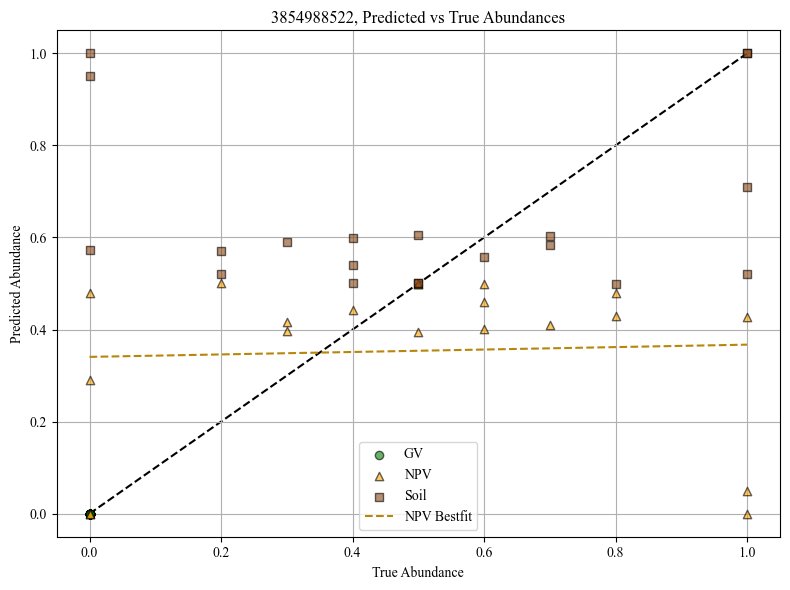

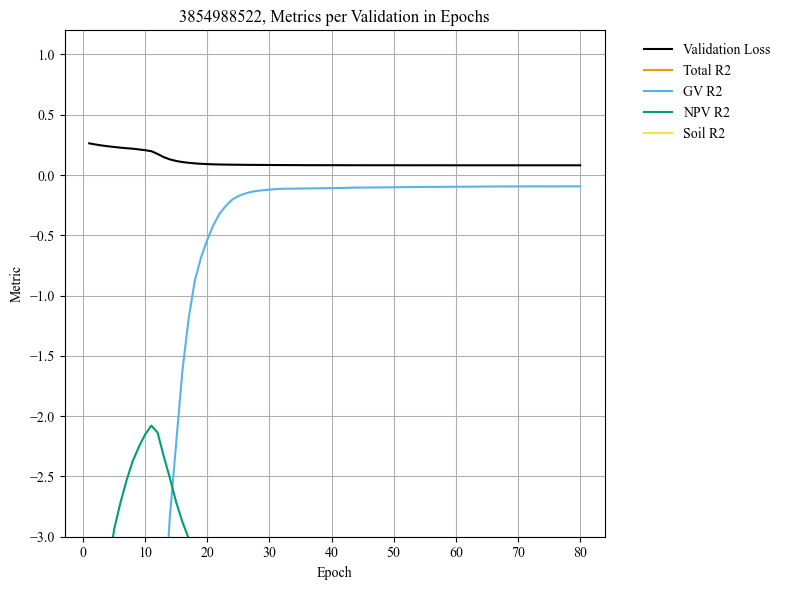

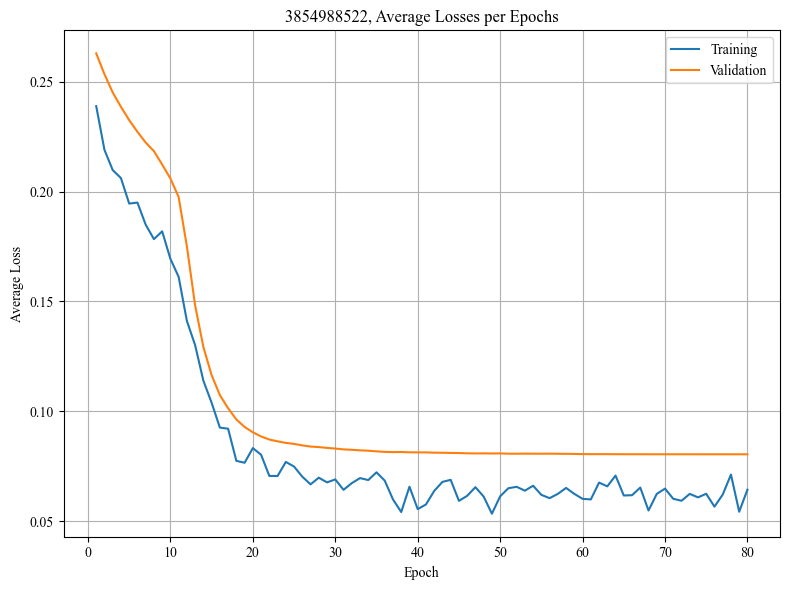

Testing complete
Initial fine tuning complete, with 100 batches
Epoch 1/80, Step 1/20, Train Loss: 0.300471
Epoch 1/80, Step 2/20, Train Loss: 0.180957
Epoch 1/80, Step 3/20, Train Loss: 0.246003
Epoch 1/80, Step 4/20, Train Loss: 0.296922
Epoch 1/80, Step 5/20, Train Loss: 0.321411
Epoch 1/80, Step 6/20, Train Loss: 0.323747
Epoch 1/80, Step 7/20, Train Loss: 0.184222
Epoch 1/80, Step 8/20, Train Loss: 0.226646
Epoch 1/80, Step 9/20, Train Loss: 0.181750
Epoch 1/80, Step 10/20, Train Loss: 0.264975
Epoch 1/80, Step 11/20, Train Loss: 0.215767
Epoch 1/80, Step 12/20, Train Loss: 0.237470
Epoch 1/80, Step 13/20, Train Loss: 0.268764
Epoch 1/80, Step 14/20, Train Loss: 0.247961
Epoch 1/80, Step 15/20, Train Loss: 0.295395
Epoch 1/80, Step 16/20, Train Loss: 0.168443
Epoch 1/80, Step 17/20, Train Loss: 0.169346
Epoch 1/80, Step 18/20, Train Loss: 0.194542
Epoch 1/80, Step 19/20, Train Loss: 0.214576
Epoch 1/80, Step 20/20, Train Loss: 0.210330
Epoch 1/80 complete. Train Loss: 0.237485, Va

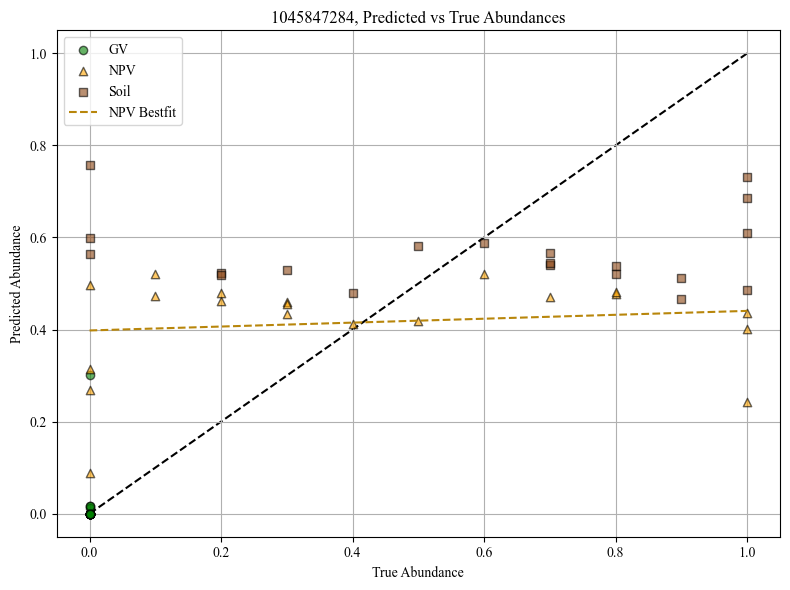

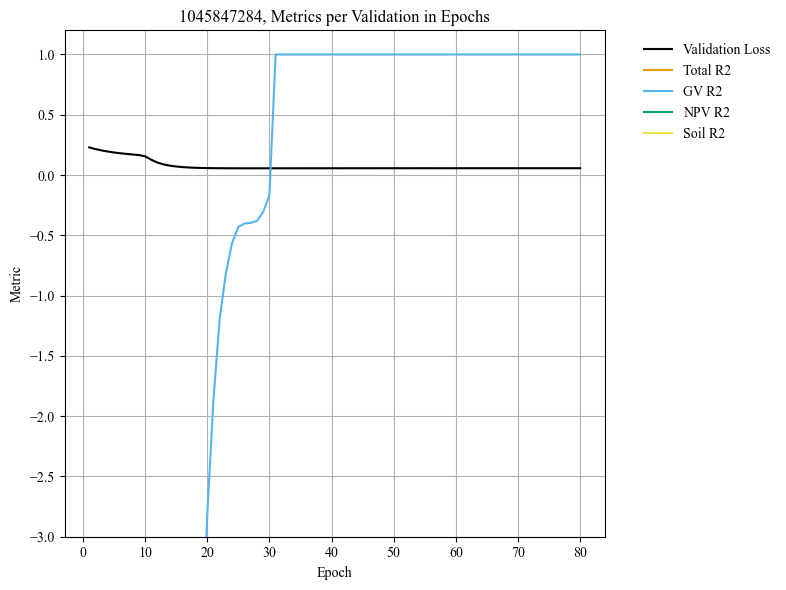

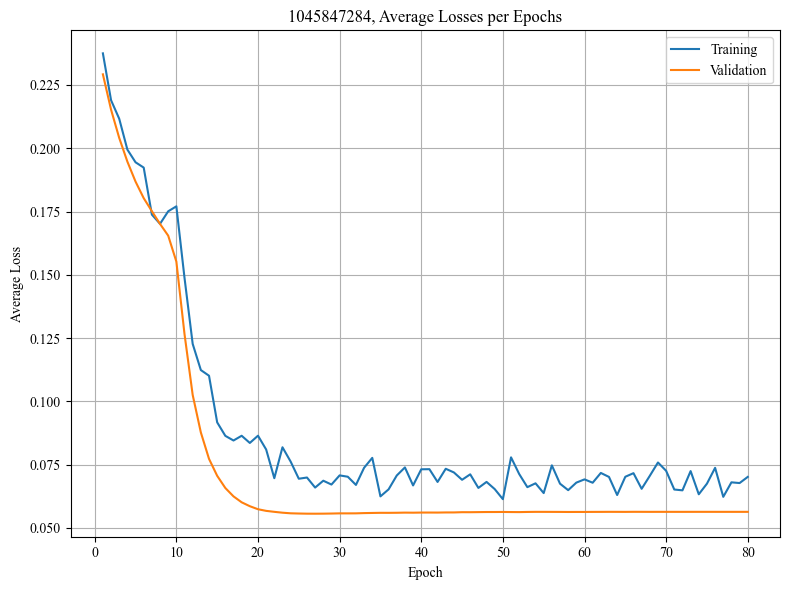

Testing complete
Initial fine tuning complete, with 100 batches
Epoch 1/80, Step 1/20, Train Loss: 0.177557
Epoch 1/80, Step 2/20, Train Loss: 0.285923
Epoch 1/80, Step 3/20, Train Loss: 0.192325
Epoch 1/80, Step 4/20, Train Loss: 0.241434
Epoch 1/80, Step 5/20, Train Loss: 0.178673
Epoch 1/80, Step 6/20, Train Loss: 0.274814
Epoch 1/80, Step 7/20, Train Loss: 0.160591
Epoch 1/80, Step 8/20, Train Loss: 0.167739
Epoch 1/80, Step 9/20, Train Loss: 0.289971
Epoch 1/80, Step 10/20, Train Loss: 0.188594
Epoch 1/80, Step 11/20, Train Loss: 0.247338
Epoch 1/80, Step 12/20, Train Loss: 0.206255
Epoch 1/80, Step 13/20, Train Loss: 0.189084
Epoch 1/80, Step 14/20, Train Loss: 0.165467
Epoch 1/80, Step 15/20, Train Loss: 0.314182
Epoch 1/80, Step 16/20, Train Loss: 0.121204
Epoch 1/80, Step 17/20, Train Loss: 0.337835
Epoch 1/80, Step 18/20, Train Loss: 0.362699
Epoch 1/80, Step 19/20, Train Loss: 0.176995
Epoch 1/80, Step 20/20, Train Loss: 0.137557
Epoch 1/80 complete. Train Loss: 0.220812, Va

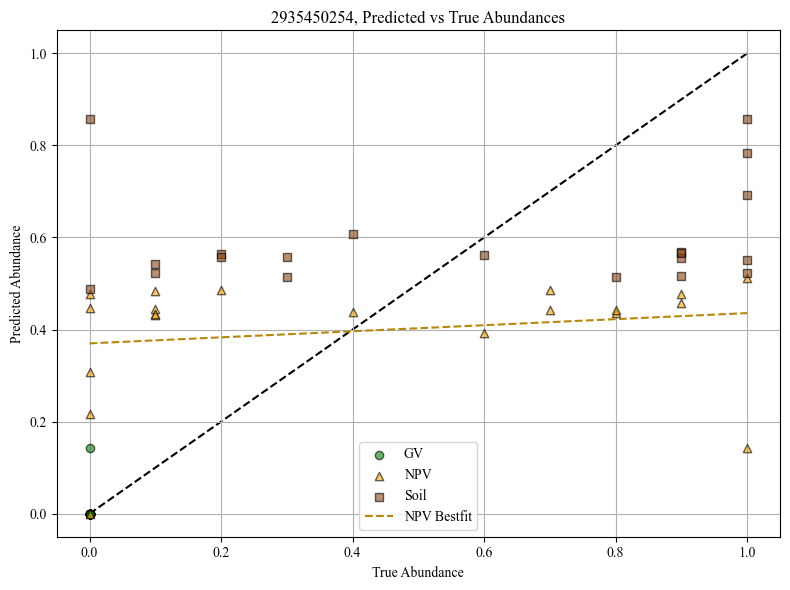

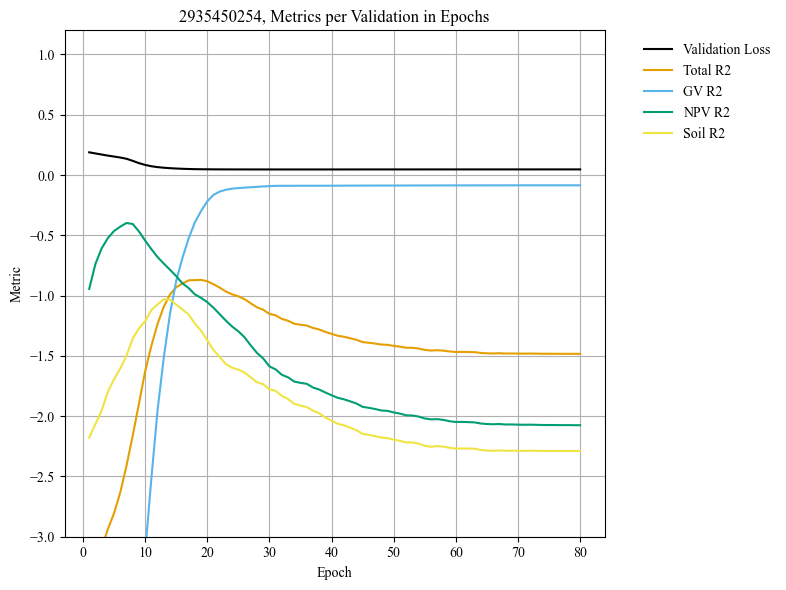

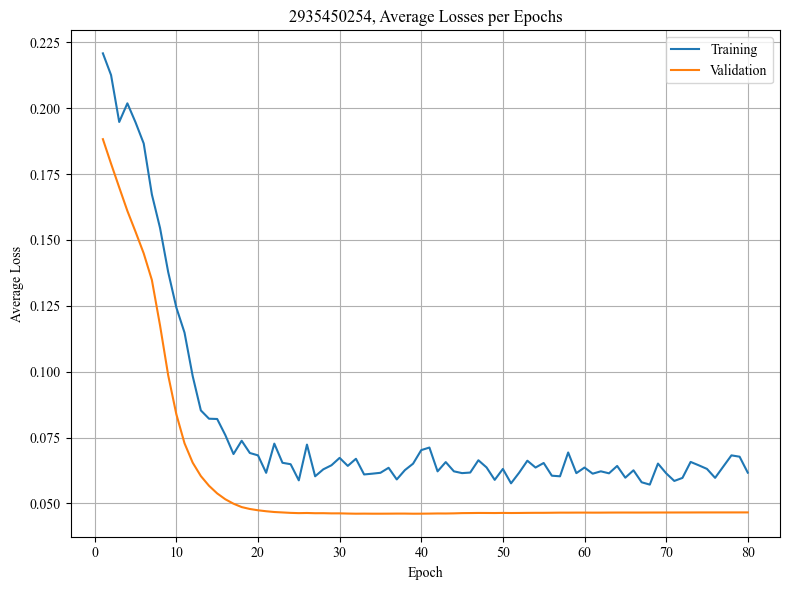

Testing complete
Initial fine tuning complete, with 100 batches
Epoch 1/80, Step 1/20, Train Loss: 0.176661
Epoch 1/80, Step 2/20, Train Loss: 0.277320
Epoch 1/80, Step 3/20, Train Loss: 0.275310
Epoch 1/80, Step 4/20, Train Loss: 0.206013
Epoch 1/80, Step 5/20, Train Loss: 0.189082
Epoch 1/80, Step 6/20, Train Loss: 0.257720
Epoch 1/80, Step 7/20, Train Loss: 0.435549
Epoch 1/80, Step 8/20, Train Loss: 0.283305
Epoch 1/80, Step 9/20, Train Loss: 0.242091
Epoch 1/80, Step 10/20, Train Loss: 0.273424
Epoch 1/80, Step 11/20, Train Loss: 0.172010
Epoch 1/80, Step 12/20, Train Loss: 0.211252
Epoch 1/80, Step 13/20, Train Loss: 0.133948
Epoch 1/80, Step 14/20, Train Loss: 0.171455
Epoch 1/80, Step 15/20, Train Loss: 0.214427
Epoch 1/80, Step 16/20, Train Loss: 0.291895
Epoch 1/80, Step 17/20, Train Loss: 0.180811
Epoch 1/80, Step 18/20, Train Loss: 0.150570
Epoch 1/80, Step 19/20, Train Loss: 0.272728
Epoch 1/80, Step 20/20, Train Loss: 0.168787
Epoch 1/80 complete. Train Loss: 0.229218, Va

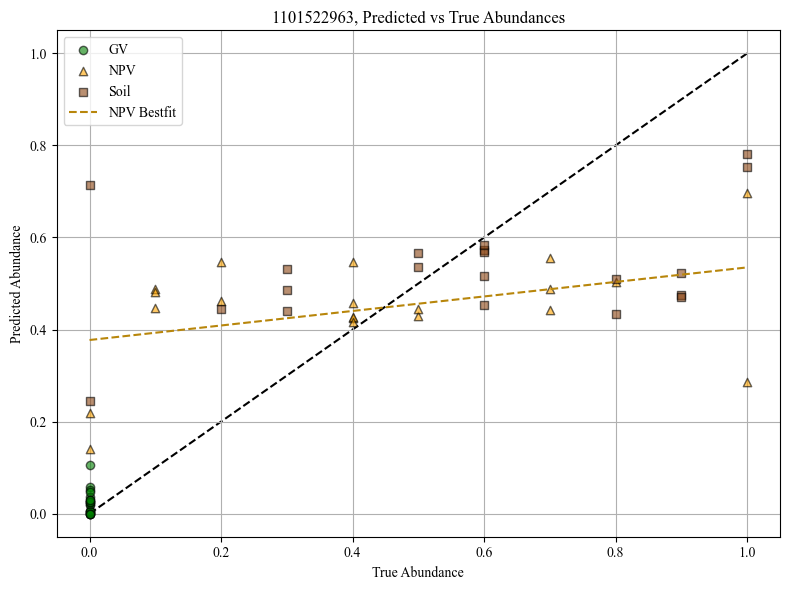

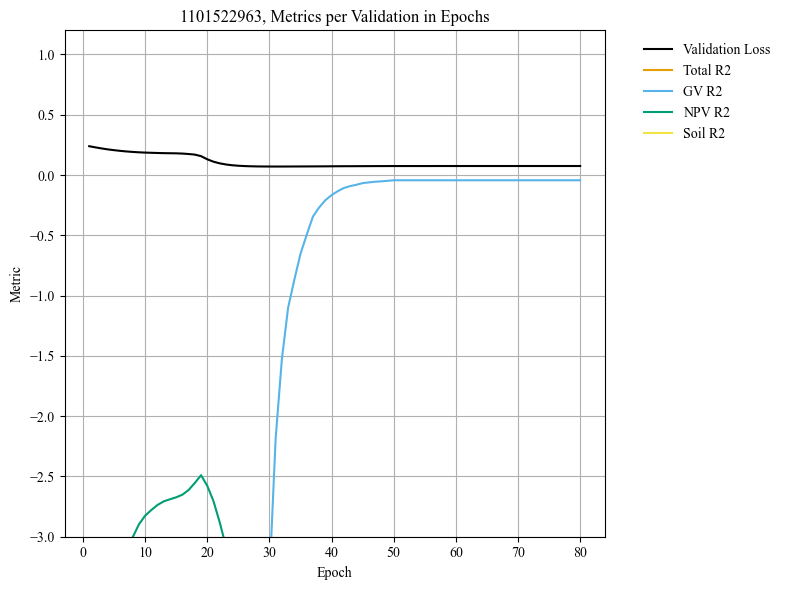

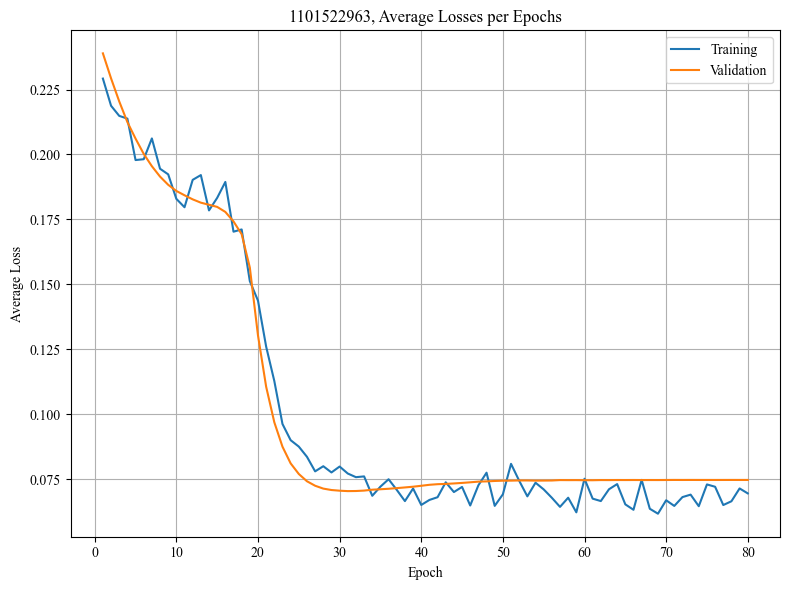

Testing complete
Initial fine tuning complete, with 100 batches
Epoch 1/80, Step 1/20, Train Loss: 0.126778
Epoch 1/80, Step 2/20, Train Loss: 0.290055
Epoch 1/80, Step 3/20, Train Loss: 0.203680
Epoch 1/80, Step 4/20, Train Loss: 0.219761
Epoch 1/80, Step 5/20, Train Loss: 0.238721
Epoch 1/80, Step 6/20, Train Loss: 0.250761
Epoch 1/80, Step 7/20, Train Loss: 0.229970
Epoch 1/80, Step 8/20, Train Loss: 0.174390
Epoch 1/80, Step 9/20, Train Loss: 0.272587
Epoch 1/80, Step 10/20, Train Loss: 0.197644
Epoch 1/80, Step 11/20, Train Loss: 0.234717
Epoch 1/80, Step 12/20, Train Loss: 0.143545
Epoch 1/80, Step 13/20, Train Loss: 0.300797
Epoch 1/80, Step 14/20, Train Loss: 0.357753
Epoch 1/80, Step 15/20, Train Loss: 0.223149
Epoch 1/80, Step 16/20, Train Loss: 0.239970
Epoch 1/80, Step 17/20, Train Loss: 0.148783
Epoch 1/80, Step 18/20, Train Loss: 0.211626
Epoch 1/80, Step 19/20, Train Loss: 0.190223
Epoch 1/80, Step 20/20, Train Loss: 0.137825
Epoch 1/80 complete. Train Loss: 0.219637, Va

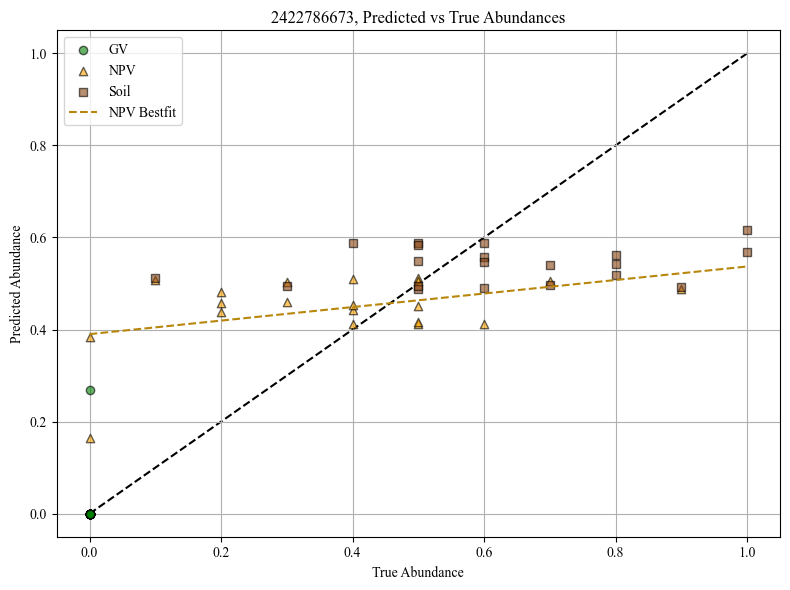

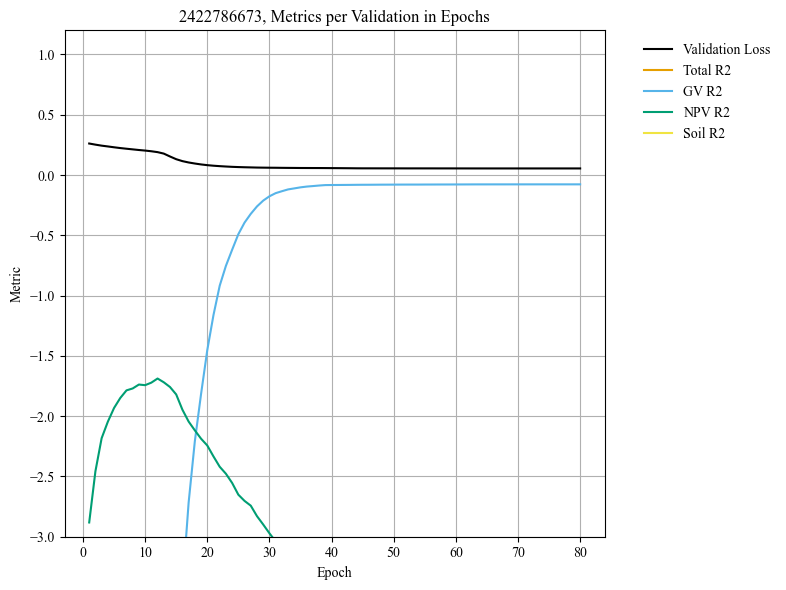

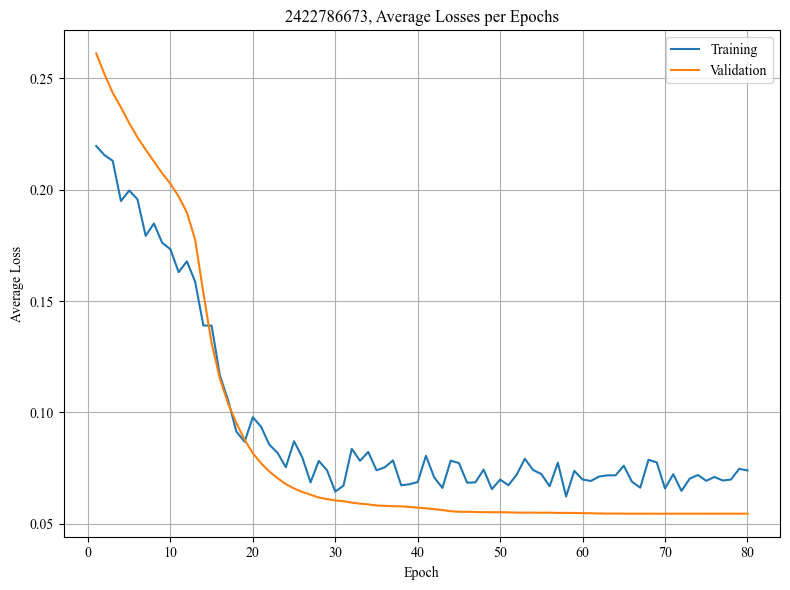

Testing complete
Initial fine tuning complete, with 100 batches
Epoch 1/80, Step 1/20, Train Loss: 0.246512
Epoch 1/80, Step 2/20, Train Loss: 0.231509
Epoch 1/80, Step 3/20, Train Loss: 0.239704
Epoch 1/80, Step 4/20, Train Loss: 0.186077
Epoch 1/80, Step 5/20, Train Loss: 0.158945
Epoch 1/80, Step 6/20, Train Loss: 0.248474
Epoch 1/80, Step 7/20, Train Loss: 0.141109
Epoch 1/80, Step 8/20, Train Loss: 0.222734
Epoch 1/80, Step 9/20, Train Loss: 0.268605
Epoch 1/80, Step 10/20, Train Loss: 0.363988
Epoch 1/80, Step 11/20, Train Loss: 0.242947
Epoch 1/80, Step 12/20, Train Loss: 0.192234
Epoch 1/80, Step 13/20, Train Loss: 0.202370
Epoch 1/80, Step 14/20, Train Loss: 0.237859
Epoch 1/80, Step 15/20, Train Loss: 0.218181
Epoch 1/80, Step 16/20, Train Loss: 0.210964
Epoch 1/80, Step 17/20, Train Loss: 0.173145
Epoch 1/80, Step 18/20, Train Loss: 0.235205
Epoch 1/80, Step 19/20, Train Loss: 0.232502
Epoch 1/80, Step 20/20, Train Loss: 0.212021
Epoch 1/80 complete. Train Loss: 0.223254, Va

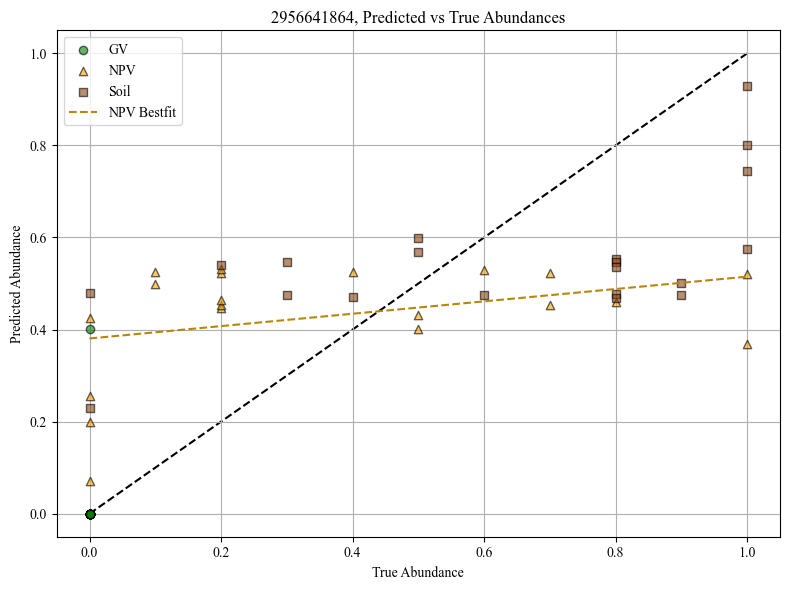

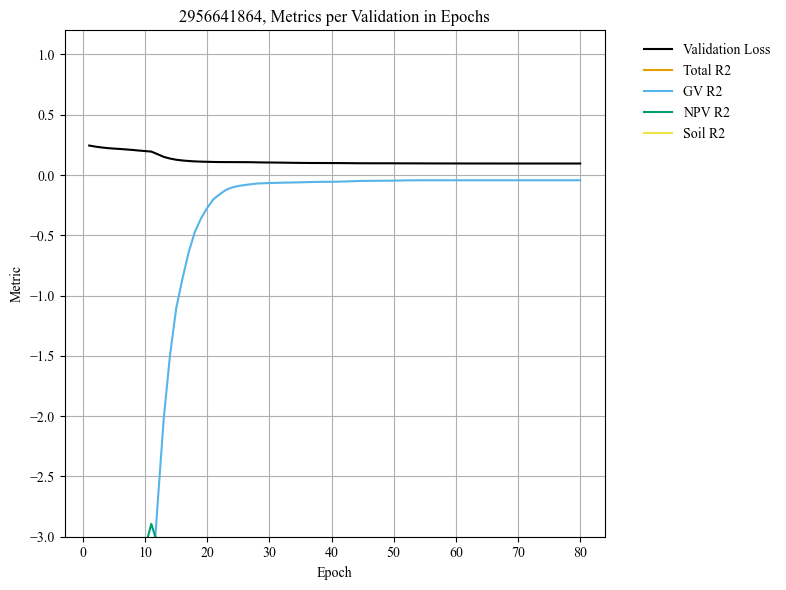

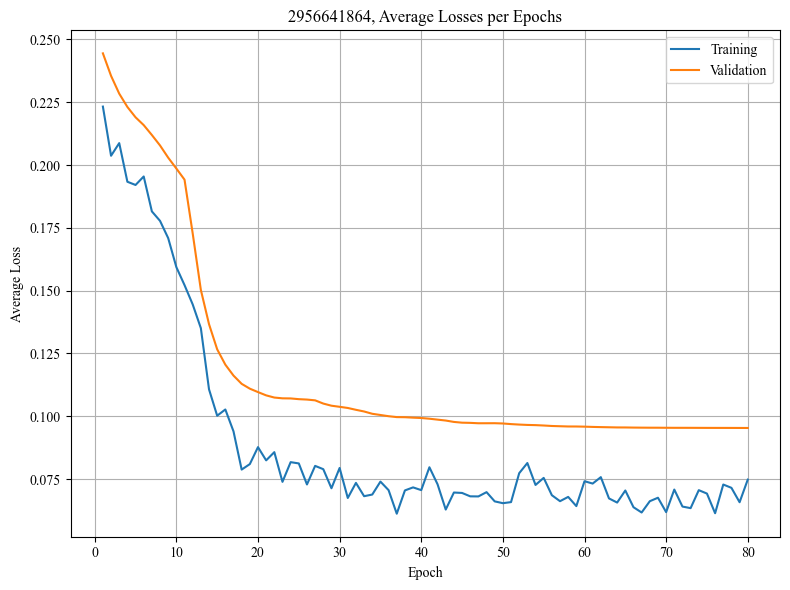

Testing complete
Initial fine tuning complete, with 100 batches
Epoch 1/80, Step 1/20, Train Loss: 0.185798
Epoch 1/80, Step 2/20, Train Loss: 0.187219
Epoch 1/80, Step 3/20, Train Loss: 0.231565
Epoch 1/80, Step 4/20, Train Loss: 0.231353
Epoch 1/80, Step 5/20, Train Loss: 0.257816
Epoch 1/80, Step 6/20, Train Loss: 0.253921
Epoch 1/80, Step 7/20, Train Loss: 0.165221
Epoch 1/80, Step 8/20, Train Loss: 0.280923
Epoch 1/80, Step 9/20, Train Loss: 0.264685
Epoch 1/80, Step 10/20, Train Loss: 0.297302
Epoch 1/80, Step 11/20, Train Loss: 0.192296
Epoch 1/80, Step 12/20, Train Loss: 0.291546
Epoch 1/80, Step 13/20, Train Loss: 0.200333
Epoch 1/80, Step 14/20, Train Loss: 0.238586
Epoch 1/80, Step 15/20, Train Loss: 0.182606
Epoch 1/80, Step 16/20, Train Loss: 0.287989
Epoch 1/80, Step 17/20, Train Loss: 0.317488
Epoch 1/80, Step 18/20, Train Loss: 0.242340
Epoch 1/80, Step 19/20, Train Loss: 0.230469
Epoch 1/80, Step 20/20, Train Loss: 0.208972
Epoch 1/80 complete. Train Loss: 0.237421, Va

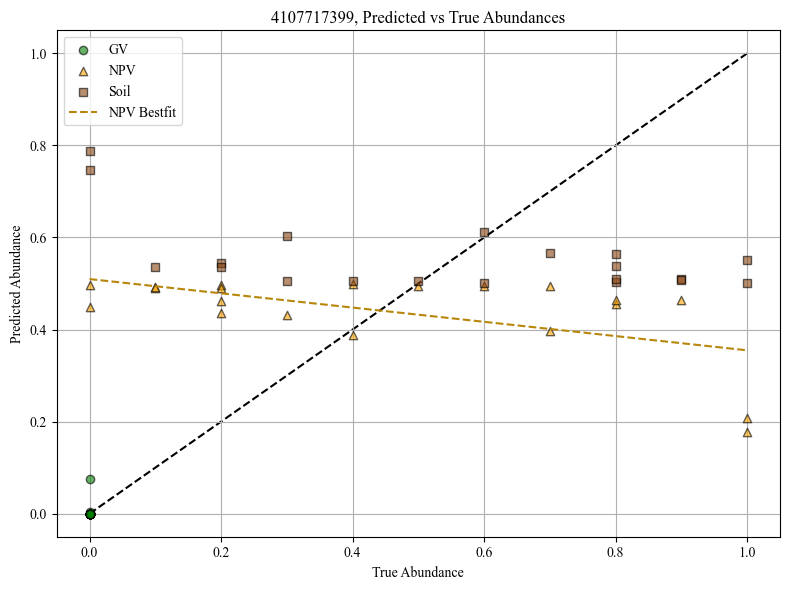

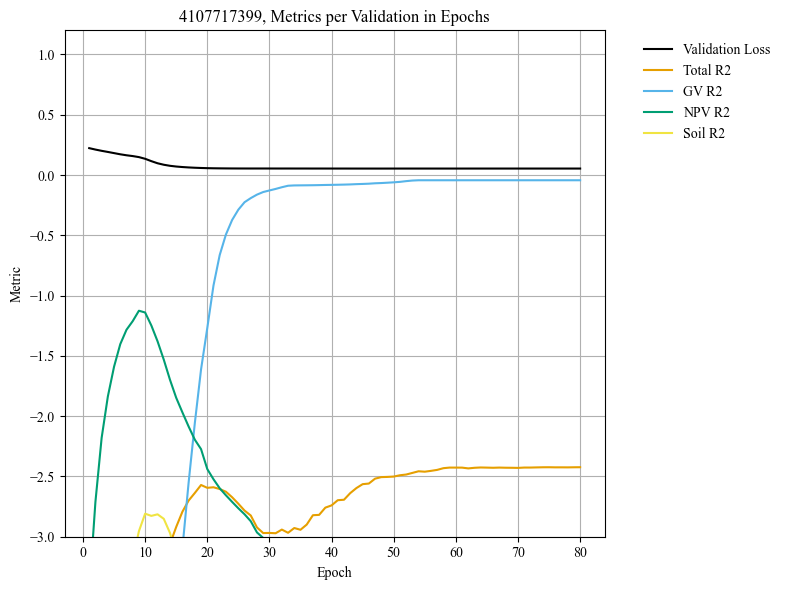

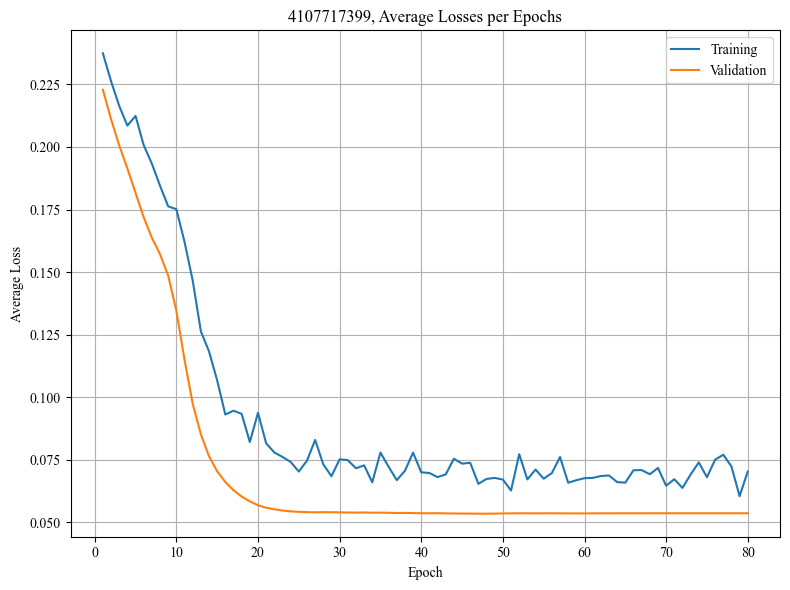

Testing complete
Initial fine tuning complete, with 100 batches
Epoch 1/80, Step 1/20, Train Loss: 0.251978
Epoch 1/80, Step 2/20, Train Loss: 0.222739
Epoch 1/80, Step 3/20, Train Loss: 0.258376
Epoch 1/80, Step 4/20, Train Loss: 0.300804
Epoch 1/80, Step 5/20, Train Loss: 0.135097
Epoch 1/80, Step 6/20, Train Loss: 0.213559
Epoch 1/80, Step 7/20, Train Loss: 0.269385
Epoch 1/80, Step 8/20, Train Loss: 0.207617
Epoch 1/80, Step 9/20, Train Loss: 0.295094
Epoch 1/80, Step 10/20, Train Loss: 0.183603
Epoch 1/80, Step 11/20, Train Loss: 0.240763
Epoch 1/80, Step 12/20, Train Loss: 0.248304
Epoch 1/80, Step 13/20, Train Loss: 0.175256
Epoch 1/80, Step 14/20, Train Loss: 0.247618
Epoch 1/80, Step 15/20, Train Loss: 0.186241
Epoch 1/80, Step 16/20, Train Loss: 0.211009
Epoch 1/80, Step 17/20, Train Loss: 0.284726
Epoch 1/80, Step 18/20, Train Loss: 0.247481
Epoch 1/80, Step 19/20, Train Loss: 0.164788
Epoch 1/80, Step 20/20, Train Loss: 0.243018
Epoch 1/80 complete. Train Loss: 0.229373, Va

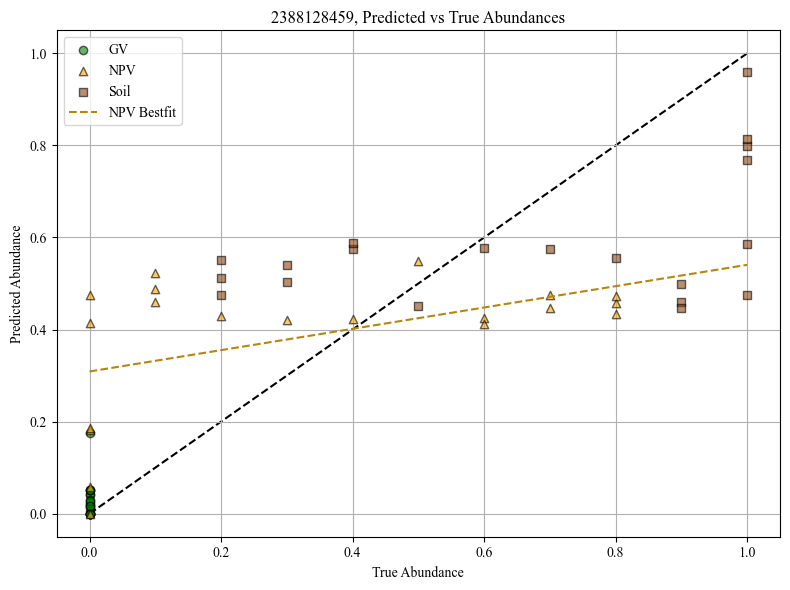

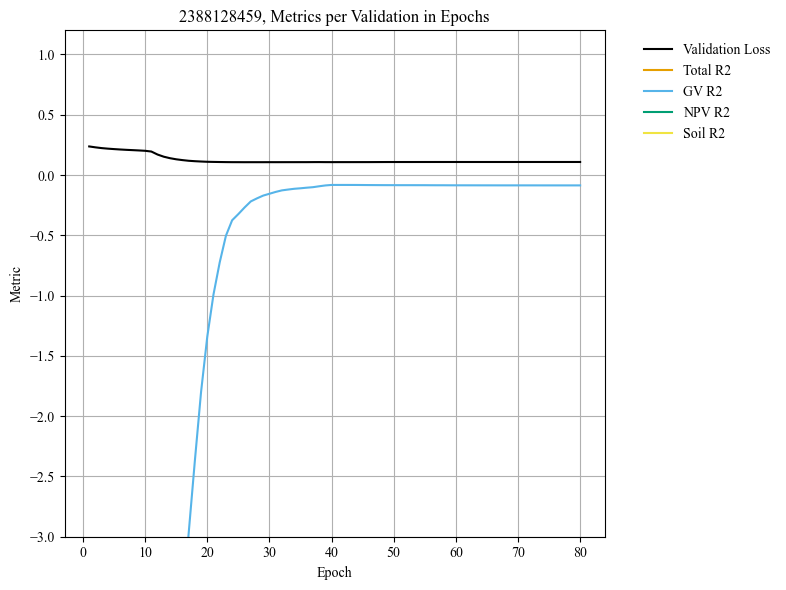

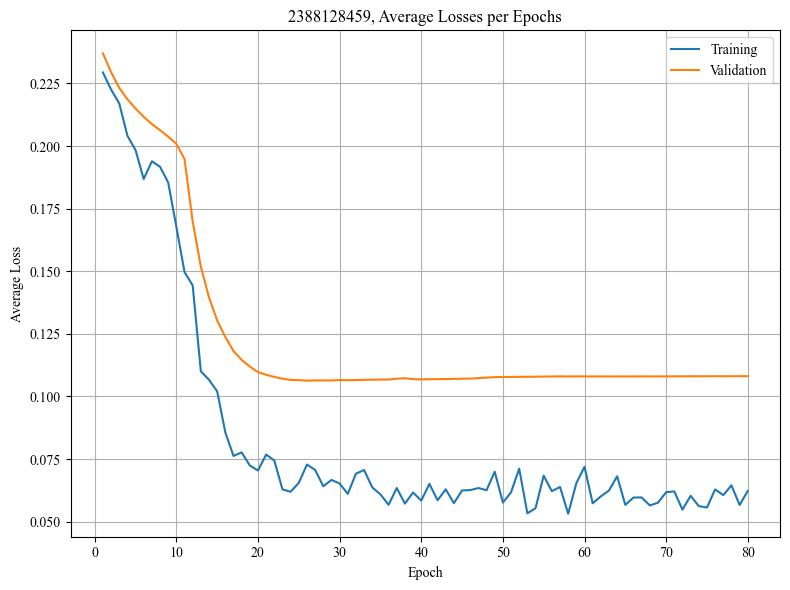

Testing complete
Initial fine tuning complete, with 100 batches
Epoch 1/80, Step 1/20, Train Loss: 0.343777
Epoch 1/80, Step 2/20, Train Loss: 0.386827
Epoch 1/80, Step 3/20, Train Loss: 0.160754
Epoch 1/80, Step 4/20, Train Loss: 0.267774
Epoch 1/80, Step 5/20, Train Loss: 0.145876
Epoch 1/80, Step 6/20, Train Loss: 0.224516
Epoch 1/80, Step 7/20, Train Loss: 0.300535
Epoch 1/80, Step 8/20, Train Loss: 0.269223
Epoch 1/80, Step 9/20, Train Loss: 0.222023
Epoch 1/80, Step 10/20, Train Loss: 0.159887
Epoch 1/80, Step 11/20, Train Loss: 0.274568
Epoch 1/80, Step 12/20, Train Loss: 0.198231
Epoch 1/80, Step 13/20, Train Loss: 0.155856
Epoch 1/80, Step 14/20, Train Loss: 0.282651
Epoch 1/80, Step 15/20, Train Loss: 0.314808
Epoch 1/80, Step 16/20, Train Loss: 0.212208
Epoch 1/80, Step 17/20, Train Loss: 0.160648
Epoch 1/80, Step 18/20, Train Loss: 0.366648
Epoch 1/80, Step 19/20, Train Loss: 0.233814
Epoch 1/80, Step 20/20, Train Loss: 0.197805
Epoch 1/80 complete. Train Loss: 0.243922, Va

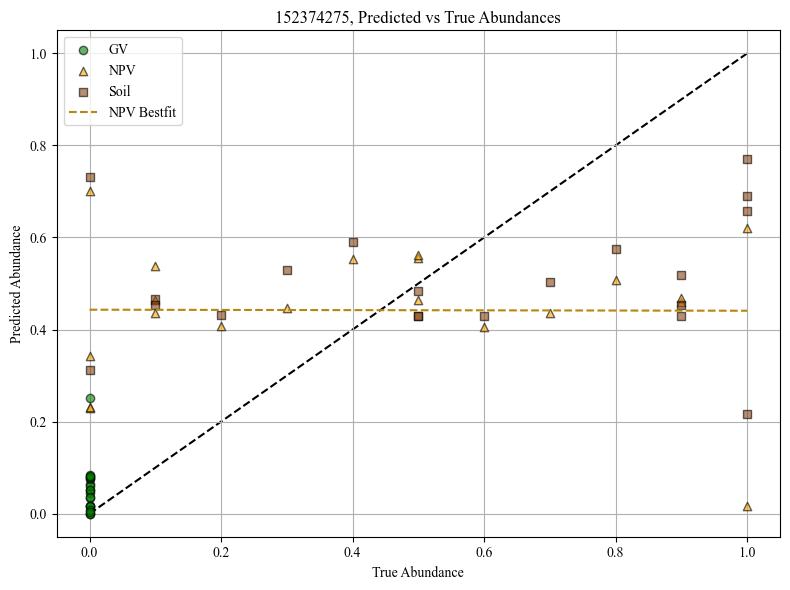

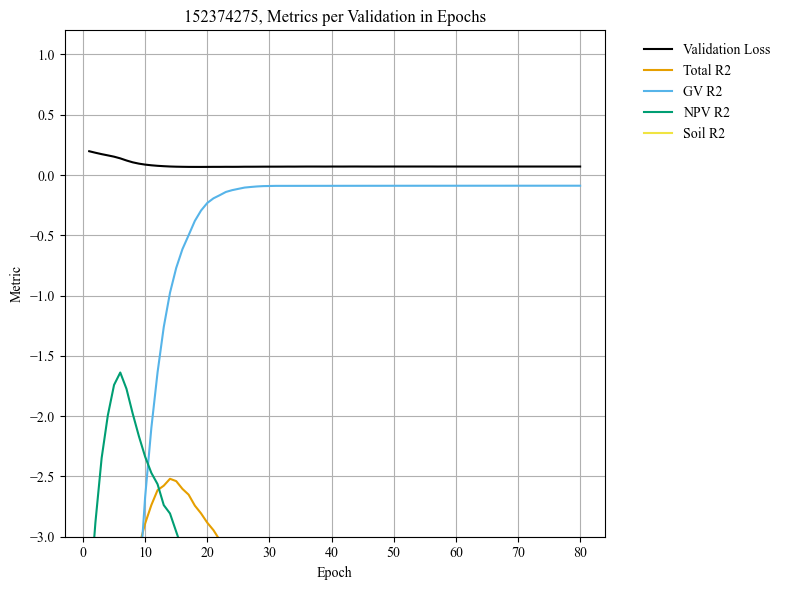

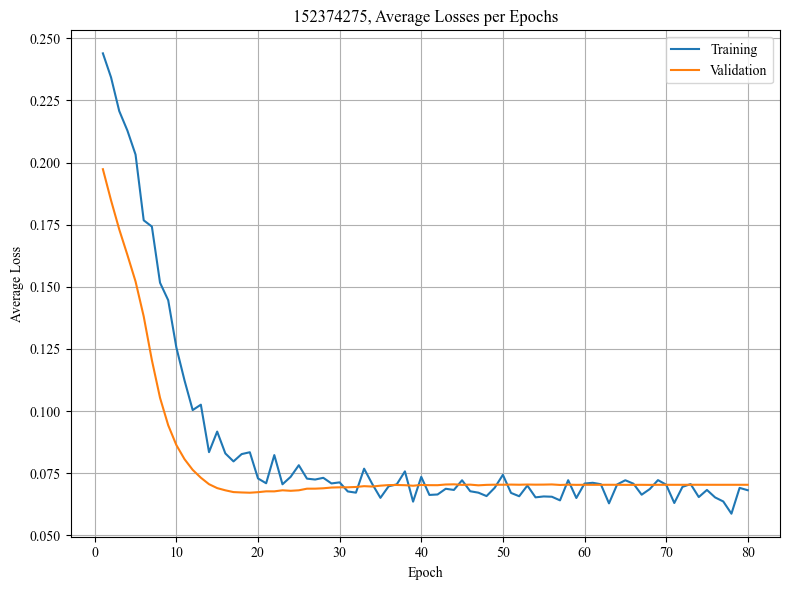

Testing complete


In [16]:
# Run the monte carlo cross validation loop

mlp_128_4layer_dict = {}

for seed in mccv_seeds:
    torch.manual_seed(seed) # Set this as the global seed for all random ops in torch and numpy, just to be safe
    np.random.default_rng(seed)

    current_save_dir = github_root / 'runs' / 'dl' / 'atmo_data' / 'mlp_128_4layer' / 'results' / str(seed)

    dataloaders = get_data(save_path=save_path, seed=seed, spec_range=[900, 1690], batch_size=batch_size, n_train=n_train, n_val=n_val, n_test=n_test)
    model = load_frozen(model_cfg, statedict_path, 'MLP').to(device)
    active_params = filter(lambda p: p.requires_grad, model.parameters()) # Filter the active params only
    optimizer = torch.optim.AdamW(active_params, lr=lr, weight_decay=weight_decay) # Only pass in the active params to the optim
    lr_scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epoch*n_tb_epoch, eta_min=1e-6)
    loss = nn.MSELoss()

    model_dict = train_model(
        model=model,
        loss_fn=loss,
        optimizer=optimizer,
        lr_scheduler=lr_scheduler,
        configured_data=dataloaders,
        n_epoch=epoch,
        n_tb_epoch=n_tb_epoch,
        device=device,
        dtype=torch.float32,
        save_dir=str(current_save_dir),
        model_name=str(seed),
        save_artifacts=True,
        fine_tuning=True
    )
    
    mlp_128_4layer_dict[seed] = model_dict

In [17]:
import pickle
with open('mlp_128_4layer_dict.pkl', 'wb') as fp:
    pickle.dump(mlp_128_4layer_dict, fp)